In [1]:
import time
import torch
import torch.nn as nn
import numpy as np
import scipy.ndimage
import scipy.io
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar
from misfit import *
import warnings
from utils import *
device = torch.device('cuda:0')
warnings.filterwarnings("ignore", category=UserWarning)  

In [2]:
# Set parameters
freq = 6
dx = 25.0
dt = 0.004 # 4ms
nz = 117
nx = 567
nt = int(6 / dt) # 2s
peak_time = 1.5 / freq

num_dims = 2
source_depth = 2
receiver_depth = 2
n_sources_per_shot = 1

d_source = 19
first_source = 9

d_receiver = 2
first_receiver = 0

n_shots = len(range(first_source, nx-1, d_source))
n_receivers_per_shot = len(range(first_receiver, nx, d_receiver))



# source_locations
source_locations = torch.zeros(n_shots, n_sources_per_shot, 2,
                               dtype=torch.long)
source_locations[..., 1] = source_depth
source_locations[:, 0, 0] = (torch.arange(n_shots) * d_source +
                             first_source)
# receiver_locations
receiver_locations = torch.zeros(n_shots, n_receivers_per_shot, 2,
                                 dtype=torch.long)
receiver_locations[..., 1] = receiver_depth
receiver_locations[:, :, 0] = (
    (torch.arange(n_receivers_per_shot) * d_receiver +
     first_receiver)
    .repeat(n_shots, 1)
)
# Load ricker wavelet, frequencies below 3 Hz are muted
from scipy.io import loadmat, savemat
r = loadmat('wavelet')
ricker = torch.tensor(r['wavelet'])[0]

source_amplitudes_true = (
    ricker
    .repeat(n_shots, n_sources_per_shot, 1)
    .to(device)
)

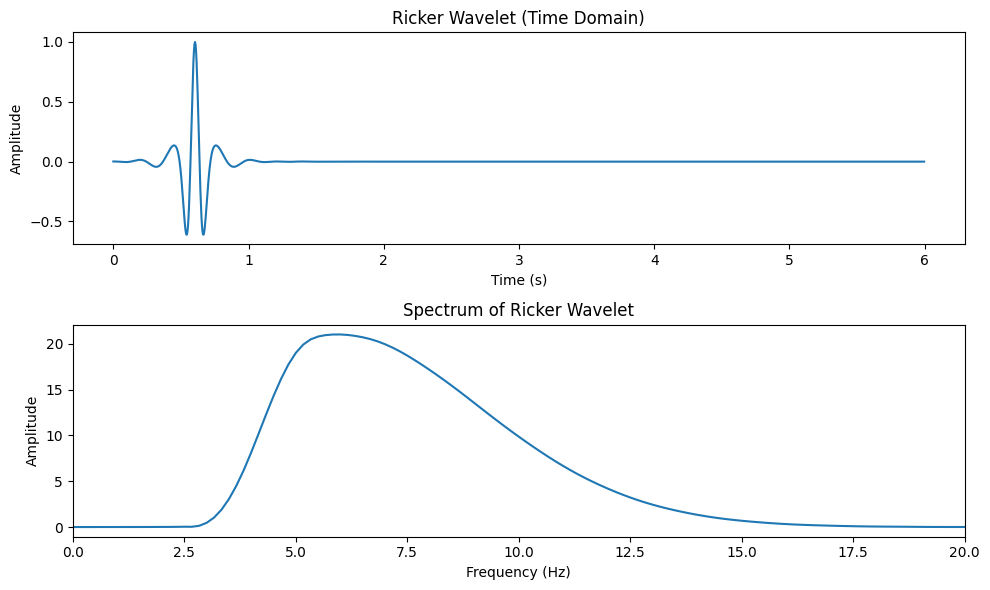

In [3]:
t_max = nt * dt  
t = np.arange(0, t_max, dt)  

wavelet = ricker.numpy()


n = len(wavelet)
f = np.fft.fftfreq(n, dt)  
f = np.fft.fftshift(f)  
wavelet_freq = np.abs(np.fft.fftshift(np.fft.fft(wavelet))) 


plt.figure(figsize=(10, 6))


plt.subplot(2, 1, 1)
plt.plot(t, wavelet)
plt.title('Ricker Wavelet (Time Domain)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


plt.subplot(2, 1, 2)
plt.plot(f, wavelet_freq)
plt.title('Spectrum of Ricker Wavelet')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.xlim([0, 20])  

plt.tight_layout()
plt.show()

In [4]:
# load true model
v = scipy.io.loadmat('True.mat')
model_true = v['True']
model_true = torch.Tensor(model_true) # Convert to a PyTorch Tensor

out = scalar(
    model_true.T.to(device), dx, dt,
    source_amplitudes=source_amplitudes_true.to(device),
    source_locations=source_locations.to(device),
    receiver_locations=receiver_locations.to(device),
    pml_freq=freq,)[-1].permute(0, 2, 1)

receiver_amplitudes_true = out

-1.198324122428894 1.1732336473464953


(array([0., 1., 2., 3., 4., 5., 6.]),
 [Text(0, 0.0, '0'),
  Text(0, 1.0, '1'),
  Text(0, 2.0, '2'),
  Text(0, 3.0, '3'),
  Text(0, 4.0, '4'),
  Text(0, 5.0, '5'),
  Text(0, 6.0, '6')])

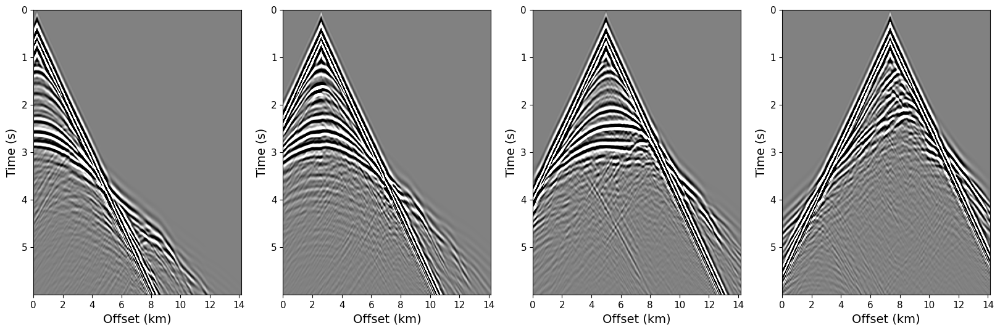

In [5]:
vmin, vmax = np.percentile(receiver_amplitudes_true[1].cpu().numpy(), [4,96])
print(vmin, vmax )
plt.style.use('default')
plt.figure(figsize=(20,6))
plt.subplot(1,4,1)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[0].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,2)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[5].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,3)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[10].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,4)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[15].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
# plt.savefig('data.jpeg', dpi=400)

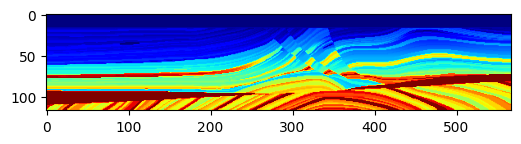

In [6]:
# plt.imshow(model_true.cpu().detach().numpy())
plt.figure(figsize=(6, 4))
plt.imshow(model_true.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
           cmap='jet')
plt.show()

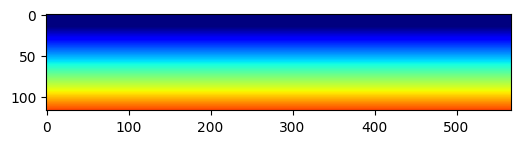

In [7]:
# Create initial model for inversion
model_init = get_linear_vel_model(v['True'],vp_min=1.5e3,vp_max=4.0e3,mask_depth = 15)
model_init = torch.Tensor(model_init)

model = model_init.clone().to(device)
model.requires_grad = True

# Create initial source amplitude for inversion
source_amplitudes = source_amplitudes_true

mask = torch.ones_like(model)
mask[:15, :] = 0


plt.figure(figsize=(6, 4))
plt.imshow(model_init.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
           cmap='jet')
plt.show()

In [8]:
# Set-up inversion
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam([{'params': [model], 'lr': 20, 'weight_decay':0e-11},
                             ]) 
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.8, last_epoch=-1)

criterion_data = Misfit_waveform_L2(dt=dt)

Epoch: 0 Loss:  22658.392578125 model_loss:  224285.1
Epoch: 1 Loss:  19597.419921875 model_loss:  225608.84
Epoch: 2 Loss:  18135.6220703125 model_loss:  227354.08
Epoch: 3 Loss:  17347.0419921875 model_loss:  229103.38
Epoch: 4 Loss:  16657.193359375 model_loss:  230810.81
Epoch: 5 Loss:  15958.2666015625 model_loss:  232629.9
Epoch: 6 Loss:  15330.046875 model_loss:  234767.48
Epoch: 7 Loss:  14739.92626953125 model_loss:  237316.3
Epoch: 8 Loss:  14262.12939453125 model_loss:  240258.19
Epoch: 9 Loss:  13882.38525390625 model_loss:  243441.25
Epoch: 10 Loss:  13517.40771484375 model_loss:  246649.45


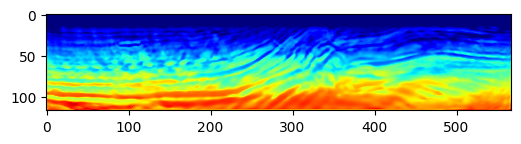

Epoch: 11 Loss:  13199.08251953125 model_loss:  249785.89
Epoch: 12 Loss:  12908.14501953125 model_loss:  252873.16
Epoch: 13 Loss:  12629.669921875 model_loss:  255930.69
Epoch: 14 Loss:  12388.982421875 model_loss:  258867.33
Epoch: 15 Loss:  12182.66943359375 model_loss:  261546.62
Epoch: 16 Loss:  11994.248046875 model_loss:  264005.8
Epoch: 17 Loss:  11802.3291015625 model_loss:  266430.78
Epoch: 18 Loss:  11632.884765625 model_loss:  268878.38
Epoch: 19 Loss:  11482.08935546875 model_loss:  271184.1
Epoch: 20 Loss:  11353.736328125 model_loss:  273270.56


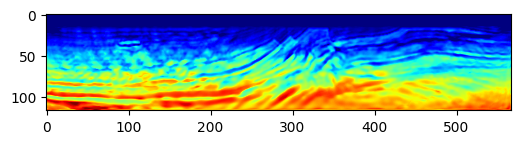

Epoch: 21 Loss:  11230.1572265625 model_loss:  275331.84
Epoch: 22 Loss:  11113.94287109375 model_loss:  277488.56
Epoch: 23 Loss:  11008.33642578125 model_loss:  279585.66
Epoch: 24 Loss:  10916.2138671875 model_loss:  281470.5
Epoch: 25 Loss:  10831.62451171875 model_loss:  283196.9
Epoch: 26 Loss:  10752.1455078125 model_loss:  284851.6
Epoch: 27 Loss:  10680.58203125 model_loss:  286460.84
Epoch: 28 Loss:  10614.32470703125 model_loss:  288032.4
Epoch: 29 Loss:  10552.9609375 model_loss:  289538.3
Epoch: 30 Loss:  10497.29541015625 model_loss:  290958.62


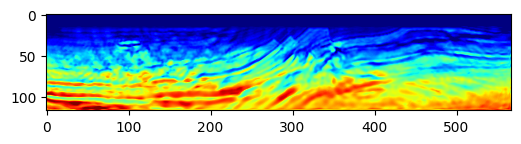

Epoch: 31 Loss:  10444.47314453125 model_loss:  292308.66
Epoch: 32 Loss:  10394.8720703125 model_loss:  293576.9
Epoch: 33 Loss:  10347.87744140625 model_loss:  294792.38
Epoch: 34 Loss:  10303.681640625 model_loss:  296001.47
Epoch: 35 Loss:  10262.94970703125 model_loss:  297186.84
Epoch: 36 Loss:  10223.330078125 model_loss:  298388.72
Epoch: 37 Loss:  10185.74267578125 model_loss:  299651.72
Epoch: 38 Loss:  10149.359375 model_loss:  300900.62
Epoch: 39 Loss:  10114.53076171875 model_loss:  302087.56
Epoch: 40 Loss:  10081.1552734375 model_loss:  303232.06


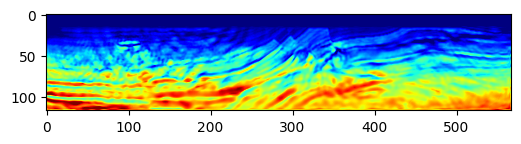

Epoch: 41 Loss:  10047.8671875 model_loss:  304358.06
Epoch: 42 Loss:  10016.2412109375 model_loss:  305471.12
Epoch: 43 Loss:  9985.6513671875 model_loss:  306561.12
Epoch: 44 Loss:  9955.7470703125 model_loss:  307642.88
Epoch: 45 Loss:  9926.51123046875 model_loss:  308710.88
Epoch: 46 Loss:  9897.3203125 model_loss:  309749.9
Epoch: 47 Loss:  9868.9638671875 model_loss:  310758.47
Epoch: 48 Loss:  9841.208984375 model_loss:  311730.9
Epoch: 49 Loss:  9813.9189453125 model_loss:  312691.03
Epoch: 50 Loss:  9787.3876953125 model_loss:  313657.6


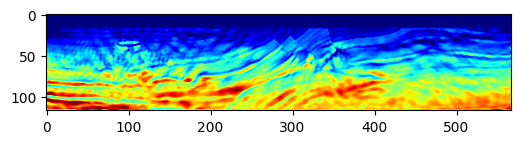

Epoch: 51 Loss:  9761.349609375 model_loss:  314626.5
Epoch: 52 Loss:  9736.0654296875 model_loss:  315594.16
Epoch: 53 Loss:  9711.060546875 model_loss:  316566.12
Epoch: 54 Loss:  9686.5400390625 model_loss:  317545.94
Epoch: 55 Loss:  9662.49658203125 model_loss:  318523.16
Epoch: 56 Loss:  9638.95068359375 model_loss:  319502.94
Epoch: 57 Loss:  9615.806640625 model_loss:  320484.97
Epoch: 58 Loss:  9592.93603515625 model_loss:  321462.62
Epoch: 59 Loss:  9570.60498046875 model_loss:  322427.84
Epoch: 60 Loss:  9548.4609375 model_loss:  323386.2


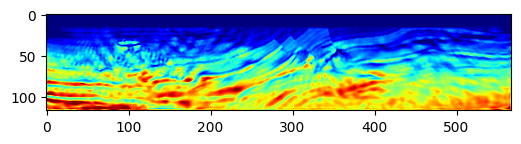

Epoch: 61 Loss:  9526.78759765625 model_loss:  324337.34
Epoch: 62 Loss:  9505.22314453125 model_loss:  325284.34
Epoch: 63 Loss:  9484.197265625 model_loss:  326218.28
Epoch: 64 Loss:  9463.1494140625 model_loss:  327139.56
Epoch: 65 Loss:  9442.70361328125 model_loss:  328040.6
Epoch: 66 Loss:  9422.12646484375 model_loss:  328924.97
Epoch: 67 Loss:  9402.28564453125 model_loss:  329784.62
Epoch: 68 Loss:  9381.9990234375 model_loss:  330631.94
Epoch: 69 Loss:  9362.498046875 model_loss:  331454.44
Epoch: 70 Loss:  9342.3447265625 model_loss:  332262.0


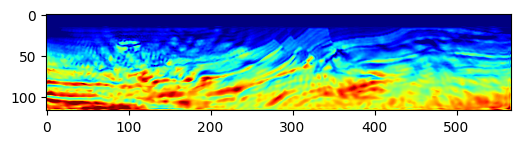

Epoch: 71 Loss:  9323.15625 model_loss:  333041.88
Epoch: 72 Loss:  9303.044921875 model_loss:  333806.25
Epoch: 73 Loss:  9284.10498046875 model_loss:  334532.6
Epoch: 74 Loss:  9294.69873046875 model_loss:  335200.9
Epoch: 75 Loss:  9298.92822265625 model_loss:  335883.4
Epoch: 76 Loss:  9284.841796875 model_loss:  336487.44
Epoch: 77 Loss:  9260.01123046875 model_loss:  337187.28
Epoch: 78 Loss:  9249.2998046875 model_loss:  337649.72
Epoch: 79 Loss:  9221.5087890625 model_loss:  338253.12
Epoch: 80 Loss:  9208.7265625 model_loss:  338808.94


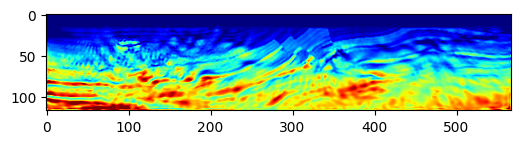

Epoch: 81 Loss:  9181.83740234375 model_loss:  339307.97
Epoch: 82 Loss:  9170.7705078125 model_loss:  339740.94
Epoch: 83 Loss:  9143.32568359375 model_loss:  340216.7
Epoch: 84 Loss:  9129.05322265625 model_loss:  340668.66
Epoch: 85 Loss:  9105.7373046875 model_loss:  341055.62
Epoch: 86 Loss:  9089.8271484375 model_loss:  341471.72
Epoch: 87 Loss:  9071.0478515625 model_loss:  341847.1
Epoch: 88 Loss:  9053.9169921875 model_loss:  342247.4
Epoch: 89 Loss:  9038.3359375 model_loss:  342596.5
Epoch: 90 Loss:  9019.2021484375 model_loss:  342973.72


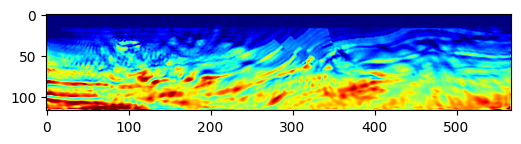

Epoch: 91 Loss:  9004.638671875 model_loss:  343323.7
Epoch: 92 Loss:  8986.42041015625 model_loss:  343685.53
Epoch: 93 Loss:  8972.01904296875 model_loss:  344055.12
Epoch: 94 Loss:  8955.849609375 model_loss:  344410.25
Epoch: 95 Loss:  8939.79345703125 model_loss:  344785.12
Epoch: 96 Loss:  8926.59765625 model_loss:  345135.7
Epoch: 97 Loss:  8909.0712890625 model_loss:  345526.28
Epoch: 98 Loss:  8896.8984375 model_loss:  345892.22
Epoch: 99 Loss:  8880.4892578125 model_loss:  346261.25
Epoch: 100 Loss:  8866.90576171875 model_loss:  346622.12


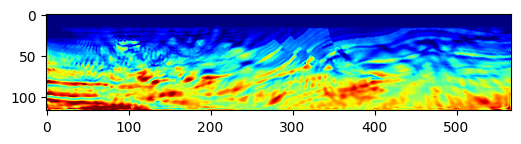

Epoch: 101 Loss:  8853.8408203125 model_loss:  346990.22
Epoch: 102 Loss:  8839.3857421875 model_loss:  347344.44
Epoch: 103 Loss:  8827.859375 model_loss:  347728.9
Epoch: 104 Loss:  8815.3564453125 model_loss:  348045.16
Epoch: 105 Loss:  8802.5830078125 model_loss:  348444.8
Epoch: 106 Loss:  8794.25 model_loss:  348731.3
Epoch: 107 Loss:  8780.47705078125 model_loss:  349141.7
Epoch: 108 Loss:  8772.80908203125 model_loss:  349421.8
Epoch: 109 Loss:  8762.50537109375 model_loss:  349813.56
Epoch: 110 Loss:  8752.357421875 model_loss:  350098.16


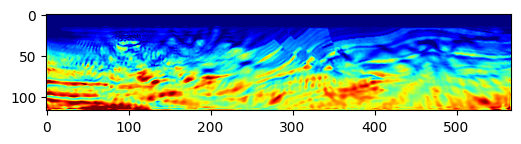

Epoch: 111 Loss:  8744.8369140625 model_loss:  350477.75
Epoch: 112 Loss:  8730.70751953125 model_loss:  350753.5
Epoch: 113 Loss:  8720.55126953125 model_loss:  351117.1
Epoch: 114 Loss:  8706.56201171875 model_loss:  351409.66
Epoch: 115 Loss:  8692.978515625 model_loss:  351736.34
Epoch: 116 Loss:  8683.4130859375 model_loss:  352039.25
Epoch: 117 Loss:  8667.65625 model_loss:  352344.78
Epoch: 118 Loss:  8661.89013671875 model_loss:  352647.28
Epoch: 119 Loss:  8646.82080078125 model_loss:  352942.53
Epoch: 120 Loss:  8640.1640625 model_loss:  353249.94


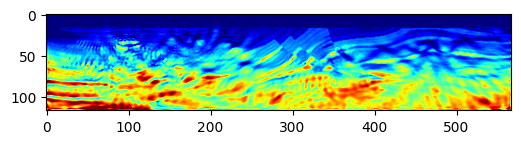

Epoch: 121 Loss:  8630.5703125 model_loss:  353533.97
Epoch: 122 Loss:  8619.4609375 model_loss:  353846.47
Epoch: 123 Loss:  8613.025390625 model_loss:  354136.72
Epoch: 124 Loss:  8600.7666015625 model_loss:  354431.9
Epoch: 125 Loss:  8590.75048828125 model_loss:  354757.88
Epoch: 126 Loss:  8584.35546875 model_loss:  355025.62
Epoch: 127 Loss:  8571.20654296875 model_loss:  355372.8
Epoch: 128 Loss:  8563.611328125 model_loss:  355658.44
Epoch: 129 Loss:  8556.8955078125 model_loss:  355980.03
Epoch: 130 Loss:  8544.59033203125 model_loss:  356305.3


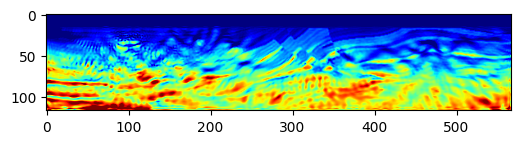

Epoch: 131 Loss:  8540.2646484375 model_loss:  356639.28
Epoch: 132 Loss:  8532.228515625 model_loss:  356938.72
Epoch: 133 Loss:  8520.357421875 model_loss:  357348.12
Epoch: 134 Loss:  8520.6181640625 model_loss:  357615.47
Epoch: 135 Loss:  8506.31787109375 model_loss:  358024.44
Epoch: 136 Loss:  8498.8046875 model_loss:  358380.28
Epoch: 137 Loss:  8505.19873046875 model_loss:  358709.22
Epoch: 138 Loss:  8486.517578125 model_loss:  359100.25
Epoch: 139 Loss:  8481.77587890625 model_loss:  359531.06
Epoch: 140 Loss:  8482.1357421875 model_loss:  359813.94


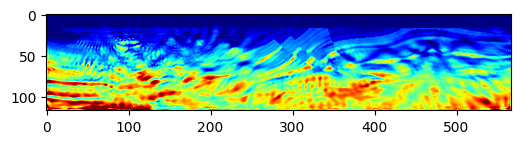

Epoch: 141 Loss:  8464.9306640625 model_loss:  360344.66
Epoch: 142 Loss:  8465.83203125 model_loss:  360684.47
Epoch: 143 Loss:  8441.2685546875 model_loss:  361089.66
Epoch: 144 Loss:  8433.77978515625 model_loss:  361606.62
Epoch: 145 Loss:  8436.5263671875 model_loss:  361925.56
Epoch: 146 Loss:  8416.06201171875 model_loss:  362423.53
Epoch: 147 Loss:  8407.0537109375 model_loss:  362951.5
Epoch: 148 Loss:  8399.7451171875 model_loss:  363296.34
Epoch: 149 Loss:  8385.9091796875 model_loss:  363842.66
Epoch: 150 Loss:  8383.80419921875 model_loss:  364289.12


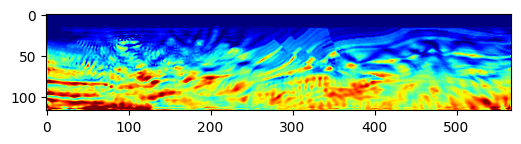

Epoch: 151 Loss:  8364.03369140625 model_loss:  364738.7
Epoch: 152 Loss:  8356.9912109375 model_loss:  365273.2
Epoch: 153 Loss:  8352.81640625 model_loss:  365670.75
Epoch: 154 Loss:  8339.076171875 model_loss:  366184.56
Epoch: 155 Loss:  8330.56689453125 model_loss:  366709.66
Epoch: 156 Loss:  8324.4560546875 model_loss:  367111.0
Epoch: 157 Loss:  8312.35400390625 model_loss:  367656.75
Epoch: 158 Loss:  8307.6875 model_loss:  368079.06
Epoch: 159 Loss:  8294.7314453125 model_loss:  368563.03
Epoch: 160 Loss:  8284.67529296875 model_loss:  369081.16


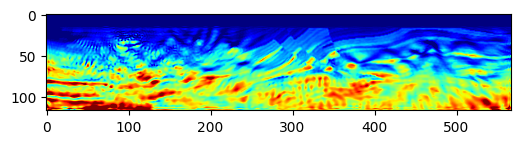

Epoch: 161 Loss:  8283.8037109375 model_loss:  369507.25
Epoch: 162 Loss:  8267.8427734375 model_loss:  369966.22
Epoch: 163 Loss:  8261.72119140625 model_loss:  370556.47
Epoch: 164 Loss:  8260.0859375 model_loss:  370889.62
Epoch: 165 Loss:  8245.07861328125 model_loss:  371502.56
Epoch: 166 Loss:  8236.7080078125 model_loss:  371930.88
Epoch: 167 Loss:  8226.3203125 model_loss:  372399.5
Epoch: 168 Loss:  8215.41162109375 model_loss:  372957.16
Epoch: 169 Loss:  8214.8017578125 model_loss:  373423.1
Epoch: 170 Loss:  8197.0322265625 model_loss:  373839.25


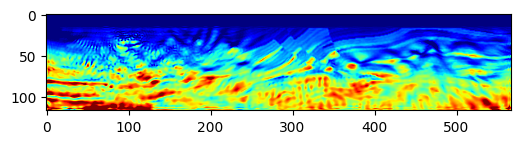

Epoch: 171 Loss:  8189.56201171875 model_loss:  374533.88
Epoch: 172 Loss:  8189.07080078125 model_loss:  374861.03
Epoch: 173 Loss:  8168.136962890625 model_loss:  375496.22
Epoch: 174 Loss:  8157.560302734375 model_loss:  376000.72
Epoch: 175 Loss:  8143.73291015625 model_loss:  376475.8
Epoch: 176 Loss:  8134.603515625 model_loss:  377064.7
Epoch: 177 Loss:  8125.73486328125 model_loss:  377616.16
Epoch: 178 Loss:  8108.60302734375 model_loss:  378049.97
Epoch: 179 Loss:  8095.557373046875 model_loss:  378717.12
Epoch: 180 Loss:  8088.220458984375 model_loss:  379153.38


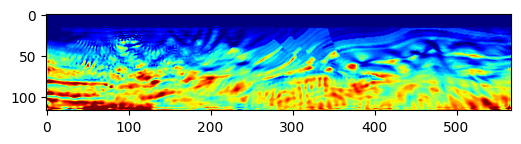

Epoch: 181 Loss:  8068.39013671875 model_loss:  379706.28
Epoch: 182 Loss:  8056.1474609375 model_loss:  380211.78
Epoch: 183 Loss:  8042.0751953125 model_loss:  380712.16
Epoch: 184 Loss:  8029.4111328125 model_loss:  381189.62
Epoch: 185 Loss:  8015.217529296875 model_loss:  381720.47
Epoch: 186 Loss:  8005.39111328125 model_loss:  382108.22
Epoch: 187 Loss:  7989.89111328125 model_loss:  382647.34
Epoch: 188 Loss:  7981.90576171875 model_loss:  383055.44
Epoch: 189 Loss:  7966.8134765625 model_loss:  383524.44
Epoch: 190 Loss:  7956.398681640625 model_loss:  383981.62


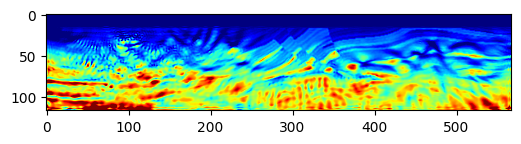

Epoch: 191 Loss:  7947.248779296875 model_loss:  384436.34
Epoch: 192 Loss:  7936.3984375 model_loss:  384857.78
Epoch: 193 Loss:  7924.181640625 model_loss:  385362.3
Epoch: 194 Loss:  7919.3505859375 model_loss:  385719.8
Epoch: 195 Loss:  7902.42822265625 model_loss:  386205.62
Epoch: 196 Loss:  7893.0166015625 model_loss:  386613.28
Epoch: 197 Loss:  7884.027587890625 model_loss:  387000.0
Epoch: 198 Loss:  7869.1630859375 model_loss:  387439.66
Epoch: 199 Loss:  7856.959228515625 model_loss:  387835.44
Epoch: 200 Loss:  7851.3291015625 model_loss:  388162.6


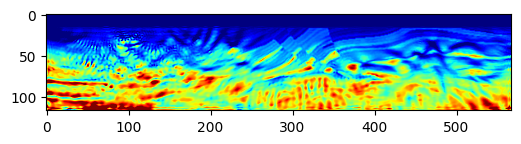

Epoch: 201 Loss:  7832.865234375 model_loss:  388615.8
Epoch: 202 Loss:  7822.48583984375 model_loss:  388875.94
Epoch: 203 Loss:  7806.230224609375 model_loss:  389197.38
Epoch: 204 Loss:  7792.582763671875 model_loss:  389537.56
Epoch: 205 Loss:  7782.039794921875 model_loss:  389725.53
Epoch: 206 Loss:  7769.915771484375 model_loss:  390006.56
Epoch: 207 Loss:  7760.38525390625 model_loss:  390310.62
Epoch: 208 Loss:  7761.435302734375 model_loss:  390360.84
Epoch: 209 Loss:  7726.50927734375 model_loss:  390694.28
Epoch: 210 Loss:  7720.37109375 model_loss:  390828.5


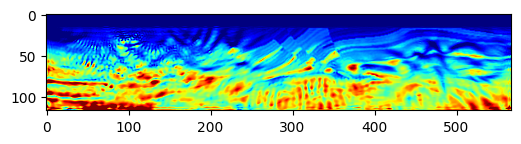

Epoch: 211 Loss:  7721.892578125 model_loss:  390905.5
Epoch: 212 Loss:  7699.140869140625 model_loss:  391216.88
Epoch: 213 Loss:  7686.980224609375 model_loss:  391222.44
Epoch: 214 Loss:  7688.367431640625 model_loss:  391309.6
Epoch: 215 Loss:  7676.944580078125 model_loss:  391563.66
Epoch: 216 Loss:  7674.459716796875 model_loss:  391428.66
Epoch: 217 Loss:  7636.2841796875 model_loss:  391592.53
Epoch: 218 Loss:  7633.45556640625 model_loss:  391613.6
Epoch: 219 Loss:  7630.039306640625 model_loss:  391554.66
Epoch: 220 Loss:  7605.72802734375 model_loss:  391645.0


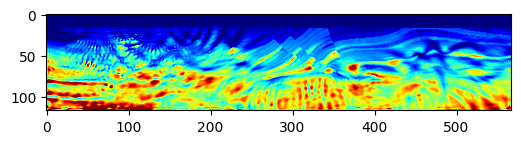

Epoch: 221 Loss:  7596.545166015625 model_loss:  391568.22
Epoch: 222 Loss:  7602.509765625 model_loss:  391467.84
Epoch: 223 Loss:  7583.447998046875 model_loss:  391497.8
Epoch: 224 Loss:  7575.091552734375 model_loss:  391272.5
Epoch: 225 Loss:  7559.18017578125 model_loss:  391205.72
Epoch: 226 Loss:  7549.427978515625 model_loss:  390977.75
Epoch: 227 Loss:  7540.434814453125 model_loss:  390807.7
Epoch: 228 Loss:  7529.533203125 model_loss:  390535.47
Epoch: 229 Loss:  7523.167236328125 model_loss:  390288.38
Epoch: 230 Loss:  7518.582763671875 model_loss:  389968.1


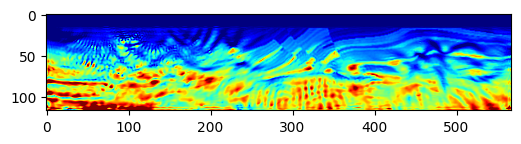

Epoch: 231 Loss:  7496.123046875 model_loss:  389624.75
Epoch: 232 Loss:  7481.625 model_loss:  389275.44
Epoch: 233 Loss:  7475.257080078125 model_loss:  388833.5
Epoch: 234 Loss:  7454.423828125 model_loss:  388442.84
Epoch: 235 Loss:  7444.902099609375 model_loss:  387989.44
Epoch: 236 Loss:  7437.177734375 model_loss:  387556.62
Epoch: 237 Loss:  7420.54345703125 model_loss:  387044.22
Epoch: 238 Loss:  7405.03125 model_loss:  386648.84
Epoch: 239 Loss:  7390.161376953125 model_loss:  386101.28
Epoch: 240 Loss:  7370.843017578125 model_loss:  385685.53


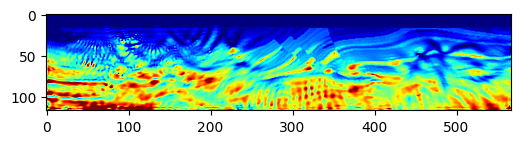

Epoch: 241 Loss:  7359.895751953125 model_loss:  385198.62
Epoch: 242 Loss:  7347.807861328125 model_loss:  384756.9
Epoch: 243 Loss:  7331.11474609375 model_loss:  384306.53
Epoch: 244 Loss:  7320.33740234375 model_loss:  383895.4
Epoch: 245 Loss:  7295.7705078125 model_loss:  383429.47
Epoch: 246 Loss:  7276.634765625 model_loss:  383052.2
Epoch: 247 Loss:  7266.270751953125 model_loss:  382609.6
Epoch: 248 Loss:  7247.5068359375 model_loss:  382267.6
Epoch: 249 Loss:  7232.23095703125 model_loss:  381901.25
Epoch: 250 Loss:  7226.66748046875 model_loss:  381577.8


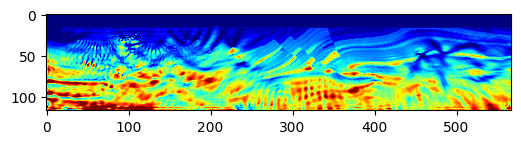

Epoch: 251 Loss:  7195.7578125 model_loss:  381240.72
Epoch: 252 Loss:  7178.73486328125 model_loss:  380974.0
Epoch: 253 Loss:  7175.910400390625 model_loss:  380608.97
Epoch: 254 Loss:  7146.3291015625 model_loss:  380395.6
Epoch: 255 Loss:  7140.572509765625 model_loss:  380101.8
Epoch: 256 Loss:  7146.19140625 model_loss:  379903.44
Epoch: 257 Loss:  7108.328125 model_loss:  379681.62
Epoch: 258 Loss:  7093.072265625 model_loss:  379502.97
Epoch: 259 Loss:  7108.737060546875 model_loss:  379206.66
Epoch: 260 Loss:  7057.14208984375 model_loss:  379094.2


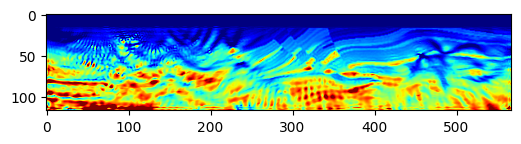

Epoch: 261 Loss:  7051.645263671875 model_loss:  378846.06
Epoch: 262 Loss:  7072.8291015625 model_loss:  378778.34
Epoch: 263 Loss:  7031.1796875 model_loss:  378730.16
Epoch: 264 Loss:  7015.064453125 model_loss:  378648.12
Epoch: 265 Loss:  7022.35400390625 model_loss:  378492.2
Epoch: 266 Loss:  7000.7470703125 model_loss:  378538.6
Epoch: 267 Loss:  6988.58935546875 model_loss:  378427.75
Epoch: 268 Loss:  6960.3359375 model_loss:  378462.97
Epoch: 269 Loss:  6925.05322265625 model_loss:  378626.25
Epoch: 270 Loss:  6970.408447265625 model_loss:  378555.12


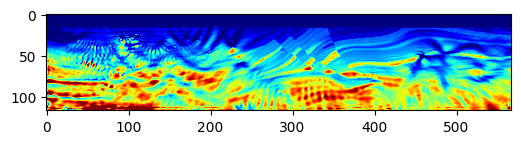

Epoch: 271 Loss:  6894.060791015625 model_loss:  378747.66
Epoch: 272 Loss:  6910.83203125 model_loss:  378907.47
Epoch: 273 Loss:  6949.952880859375 model_loss:  378828.53
Epoch: 274 Loss:  6907.07958984375 model_loss:  379248.4
Epoch: 275 Loss:  6937.246337890625 model_loss:  379114.16
Epoch: 276 Loss:  6852.08544921875 model_loss:  379518.6
Epoch: 277 Loss:  6893.286376953125 model_loss:  379481.25
Epoch: 278 Loss:  6925.353515625 model_loss:  379759.22
Epoch: 279 Loss:  6938.541015625 model_loss:  380048.16
Epoch: 280 Loss:  6960.91650390625 model_loss:  379675.97


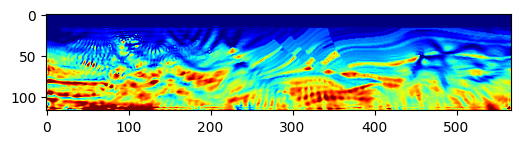

Epoch: 281 Loss:  6886.165771484375 model_loss:  380401.1
Epoch: 282 Loss:  6941.6064453125 model_loss:  380049.6
Epoch: 283 Loss:  6846.92138671875 model_loss:  380488.5
Epoch: 284 Loss:  6837.757568359375 model_loss:  380507.16
Epoch: 285 Loss:  6760.681884765625 model_loss:  380627.44
Epoch: 286 Loss:  6731.388427734375 model_loss:  381135.1
Epoch: 287 Loss:  6743.5947265625 model_loss:  380854.25
Epoch: 288 Loss:  6715.164306640625 model_loss:  381235.06
Epoch: 289 Loss:  6735.5947265625 model_loss:  381266.16
Epoch: 290 Loss:  6686.490234375 model_loss:  381567.4


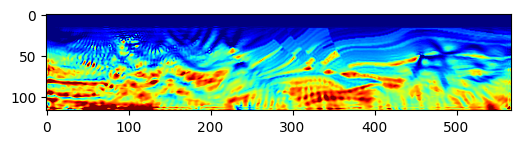

Epoch: 291 Loss:  6683.061279296875 model_loss:  381829.34
Epoch: 292 Loss:  6707.08251953125 model_loss:  381781.9
Epoch: 293 Loss:  6674.395751953125 model_loss:  382245.4
Epoch: 294 Loss:  6705.149658203125 model_loss:  382273.8
Epoch: 295 Loss:  6657.8662109375 model_loss:  382596.56
Epoch: 296 Loss:  6677.702392578125 model_loss:  382755.88
Epoch: 297 Loss:  6697.331787109375 model_loss:  382916.0
Epoch: 298 Loss:  6673.33056640625 model_loss:  383324.75
Epoch: 299 Loss:  6723.568359375 model_loss:  383154.72
Epoch: 300 Loss:  6659.890625 model_loss:  383755.53


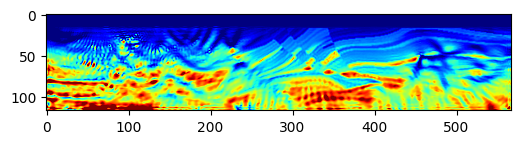

Epoch: 301 Loss:  6693.4970703125 model_loss:  383641.8
Epoch: 302 Loss:  6627.183349609375 model_loss:  384003.97
Epoch: 303 Loss:  6636.871826171875 model_loss:  384242.22
Epoch: 304 Loss:  6638.406982421875 model_loss:  384149.47
Epoch: 305 Loss:  6623.3798828125 model_loss:  384719.72
Epoch: 306 Loss:  6660.90234375 model_loss:  384465.34
Epoch: 307 Loss:  6616.745361328125 model_loss:  384999.56
Epoch: 308 Loss:  6652.4453125 model_loss:  384972.0
Epoch: 309 Loss:  6588.90380859375 model_loss:  385231.25
Epoch: 310 Loss:  6589.799560546875 model_loss:  385497.3


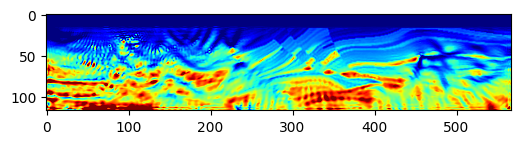

Epoch: 311 Loss:  6572.379638671875 model_loss:  385469.62
Epoch: 312 Loss:  6570.4013671875 model_loss:  385912.03
Epoch: 313 Loss:  6594.97412109375 model_loss:  385727.75
Epoch: 314 Loss:  6575.998779296875 model_loss:  386211.7
Epoch: 315 Loss:  6601.63818359375 model_loss:  386146.38
Epoch: 316 Loss:  6556.56494140625 model_loss:  386471.88
Epoch: 317 Loss:  6574.75244140625 model_loss:  386678.16
Epoch: 318 Loss:  6527.787841796875 model_loss:  386776.22
Epoch: 319 Loss:  6529.8544921875 model_loss:  387067.03
Epoch: 320 Loss:  6523.85107421875 model_loss:  387049.8


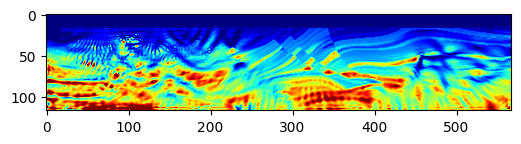

Epoch: 321 Loss:  6507.1455078125 model_loss:  387398.56
Epoch: 322 Loss:  6508.708740234375 model_loss:  387461.97
Epoch: 323 Loss:  6495.787109375 model_loss:  387674.53
Epoch: 324 Loss:  6488.8896484375 model_loss:  387939.03
Epoch: 325 Loss:  6512.23779296875 model_loss:  388033.5
Epoch: 326 Loss:  6481.947998046875 model_loss:  388326.6
Epoch: 327 Loss:  6494.12890625 model_loss:  388464.78
Epoch: 328 Loss:  6496.08349609375 model_loss:  388645.56
Epoch: 329 Loss:  6543.623779296875 model_loss:  388907.12
Epoch: 330 Loss:  6552.662109375 model_loss:  388931.7


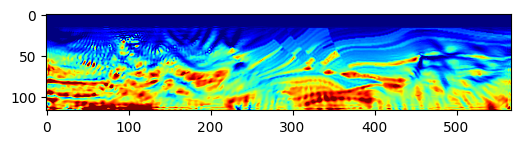

Epoch: 331 Loss:  6528.0673828125 model_loss:  389277.2
Epoch: 332 Loss:  6552.4560546875 model_loss:  389311.53
Epoch: 333 Loss:  6514.65966796875 model_loss:  389641.1
Epoch: 334 Loss:  6526.068359375 model_loss:  389766.56
Epoch: 335 Loss:  6525.68310546875 model_loss:  389904.06
Epoch: 336 Loss:  6513.251708984375 model_loss:  390245.53
Epoch: 337 Loss:  6533.5400390625 model_loss:  390193.47
Epoch: 338 Loss:  6498.573974609375 model_loss:  390626.94
Epoch: 339 Loss:  6511.560546875 model_loss:  390667.84
Epoch: 340 Loss:  6496.326904296875 model_loss:  390946.16


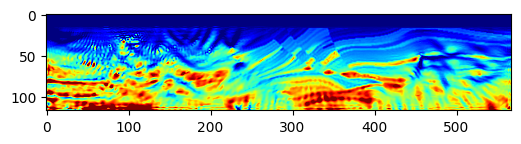

Epoch: 341 Loss:  6495.66650390625 model_loss:  391193.34
Epoch: 342 Loss:  6511.794677734375 model_loss:  391258.5
Epoch: 343 Loss:  6483.604736328125 model_loss:  391700.2
Epoch: 344 Loss:  6502.829345703125 model_loss:  391664.8
Epoch: 345 Loss:  6471.407958984375 model_loss:  392059.5
Epoch: 346 Loss:  6484.8271484375 model_loss:  392213.44
Epoch: 347 Loss:  6487.20654296875 model_loss:  392412.53
Epoch: 348 Loss:  6472.48828125 model_loss:  392808.25
Epoch: 349 Loss:  6498.86083984375 model_loss:  392778.97
Epoch: 350 Loss:  6462.51904296875 model_loss:  393271.38


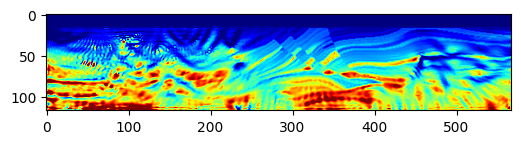

Epoch: 351 Loss:  6483.531005859375 model_loss:  393317.12
Epoch: 352 Loss:  6458.81494140625 model_loss:  393658.84
Epoch: 353 Loss:  6465.77734375 model_loss:  393932.78
Epoch: 354 Loss:  6479.806640625 model_loss:  394017.78
Epoch: 355 Loss:  6453.26025390625 model_loss:  394543.47
Epoch: 356 Loss:  6483.70703125 model_loss:  394484.1
Epoch: 357 Loss:  6443.419921875 model_loss:  394956.1
Epoch: 358 Loss:  6462.11669921875 model_loss:  395096.8
Epoch: 359 Loss:  6441.66748046875 model_loss:  395397.53
Epoch: 360 Loss:  6439.92041015625 model_loss:  395784.1


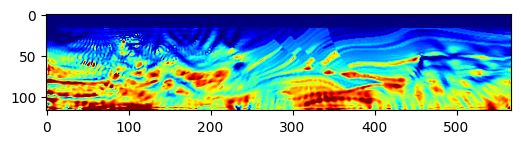

Epoch: 361 Loss:  6459.0693359375 model_loss:  395786.75
Epoch: 362 Loss:  6427.2646484375 model_loss:  396338.47
Epoch: 363 Loss:  6453.9296875 model_loss:  396367.8
Epoch: 364 Loss:  6416.0107421875 model_loss:  396786.38
Epoch: 365 Loss:  6429.254638671875 model_loss:  397026.3
Epoch: 366 Loss:  6423.8828125 model_loss:  397262.47
Epoch: 367 Loss:  6411.330810546875 model_loss:  397728.9
Epoch: 368 Loss:  6435.34765625 model_loss:  397728.78
Epoch: 369 Loss:  6401.81494140625 model_loss:  398236.53
Epoch: 370 Loss:  6420.521240234375 model_loss:  398381.4


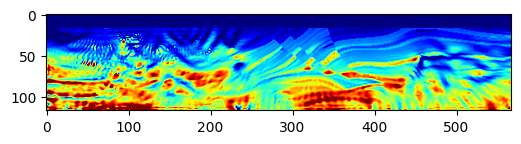

Epoch: 371 Loss:  6394.25732421875 model_loss:  398755.12
Epoch: 372 Loss:  6398.56201171875 model_loss:  399087.0
Epoch: 373 Loss:  6410.78857421875 model_loss:  399226.3
Epoch: 374 Loss:  6385.841064453125 model_loss:  399733.75
Epoch: 375 Loss:  6409.345703125 model_loss:  399790.94
Epoch: 376 Loss:  6374.9013671875 model_loss:  400242.8
Epoch: 377 Loss:  6389.2568359375 model_loss:  400479.47
Epoch: 378 Loss:  6382.3203125 model_loss:  400769.22
Epoch: 379 Loss:  6372.861328125 model_loss:  401189.88
Epoch: 380 Loss:  6396.04296875 model_loss:  401244.78


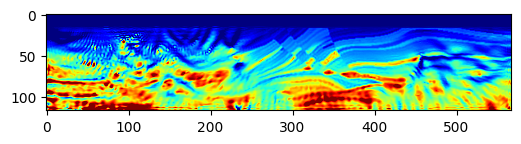

Epoch: 381 Loss:  6363.1259765625 model_loss:  401755.72
Epoch: 382 Loss:  6382.015380859375 model_loss:  401891.78
Epoch: 383 Loss:  6354.5439453125 model_loss:  402272.72
Epoch: 384 Loss:  6362.0185546875 model_loss:  402582.3
Epoch: 385 Loss:  6371.781005859375 model_loss:  402747.34
Epoch: 386 Loss:  6348.197998046875 model_loss:  403235.0
Epoch: 387 Loss:  6373.50732421875 model_loss:  403272.2
Epoch: 388 Loss:  6338.044189453125 model_loss:  403725.9
Epoch: 389 Loss:  6353.52490234375 model_loss:  403929.97
Epoch: 390 Loss:  6340.06201171875 model_loss:  404213.75


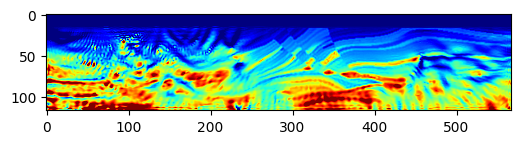

Epoch: 391 Loss:  6334.83740234375 model_loss:  404589.8
Epoch: 392 Loss:  6356.35546875 model_loss:  404633.78
Epoch: 393 Loss:  6323.376708984375 model_loss:  405121.5
Epoch: 394 Loss:  6343.84375 model_loss:  405214.5
Epoch: 395 Loss:  6310.3564453125 model_loss:  405573.4
Epoch: 396 Loss:  6321.109375 model_loss:  405820.25
Epoch: 397 Loss:  6324.671142578125 model_loss:  405987.7
Epoch: 398 Loss:  6305.506103515625 model_loss:  406416.28
Epoch: 399 Loss:  6331.1201171875 model_loss:  406420.75
Epoch: 400 Loss:  6295.9658203125 model_loss:  406851.78


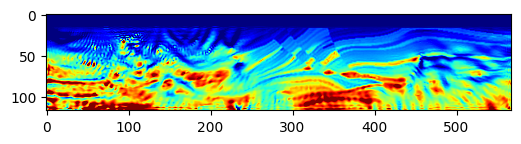

Epoch: 401 Loss:  6312.278564453125 model_loss:  407003.12
Epoch: 402 Loss:  6292.52294921875 model_loss:  407278.2
Epoch: 403 Loss:  6291.771484375 model_loss:  407587.6
Epoch: 404 Loss:  6310.523193359375 model_loss:  407640.5
Epoch: 405 Loss:  6279.30224609375 model_loss:  408099.06
Epoch: 406 Loss:  6301.049072265625 model_loss:  408157.62
Epoch: 407 Loss:  6264.58056640625 model_loss:  408518.06
Epoch: 408 Loss:  6278.28955078125 model_loss:  408725.28
Epoch: 409 Loss:  6276.10986328125 model_loss:  408924.53
Epoch: 410 Loss:  6261.638427734375 model_loss:  409321.44


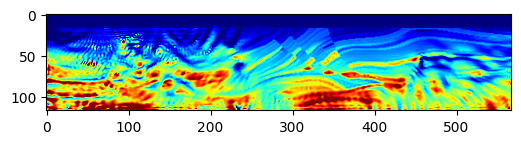

Epoch: 411 Loss:  6286.798828125 model_loss:  409327.75
Epoch: 412 Loss:  6251.19140625 model_loss:  409778.94
Epoch: 413 Loss:  6269.142578125 model_loss:  409900.2
Epoch: 414 Loss:  6243.70703125 model_loss:  410198.22
Epoch: 415 Loss:  6248.59619140625 model_loss:  410472.3
Epoch: 416 Loss:  6262.26171875 model_loss:  410555.53
Epoch: 417 Loss:  6233.9755859375 model_loss:  411011.72
Epoch: 418 Loss:  6258.988037109375 model_loss:  411036.03
Epoch: 419 Loss:  6220.77001953125 model_loss:  411426.56
Epoch: 420 Loss:  6236.22900390625 model_loss:  411605.56


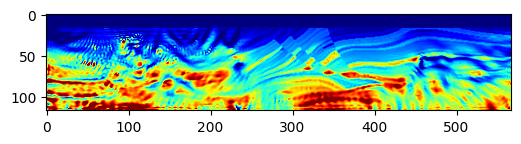

Epoch: 421 Loss:  6224.891357421875 model_loss:  411844.62
Epoch: 422 Loss:  6217.49951171875 model_loss:  412215.28
Epoch: 423 Loss:  6240.727783203125 model_loss:  412244.53
Epoch: 424 Loss:  6205.162841796875 model_loss:  412713.16
Epoch: 425 Loss:  6225.00048828125 model_loss:  412809.72
Epoch: 426 Loss:  6191.299560546875 model_loss:  413151.84
Epoch: 427 Loss:  6204.315673828125 model_loss:  413389.6
Epoch: 428 Loss:  6208.420654296875 model_loss:  413550.22
Epoch: 429 Loss:  6190.254150390625 model_loss:  413988.03
Epoch: 430 Loss:  6216.56005859375 model_loss:  414001.03


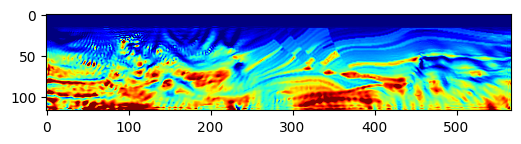

Epoch: 431 Loss:  6178.7470703125 model_loss:  414446.97
Epoch: 432 Loss:  6196.134521484375 model_loss:  414578.88
Epoch: 433 Loss:  6173.06640625 model_loss:  414879.44
Epoch: 434 Loss:  6179.04248046875 model_loss:  415180.38
Epoch: 435 Loss:  6193.75 model_loss:  415266.72
Epoch: 436 Loss:  6166.62451171875 model_loss:  415741.22
Epoch: 437 Loss:  6191.996826171875 model_loss:  415789.4
Epoch: 438 Loss:  6153.465576171875 model_loss:  416205.84
Epoch: 439 Loss:  6169.426025390625 model_loss:  416375.2
Epoch: 440 Loss:  6157.724609375 model_loss:  416631.34


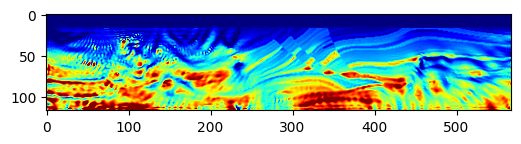

Epoch: 441 Loss:  6154.90673828125 model_loss:  417007.25
Epoch: 442 Loss:  6176.28955078125 model_loss:  417064.34
Epoch: 443 Loss:  6142.301513671875 model_loss:  417549.1
Epoch: 444 Loss:  6163.05078125 model_loss:  417641.9
Epoch: 445 Loss:  6126.124267578125 model_loss:  418033.78
Epoch: 446 Loss:  6143.363037109375 model_loss:  418261.4
Epoch: 447 Loss:  6142.8349609375 model_loss:  418479.94
Epoch: 448 Loss:  6133.410400390625 model_loss:  418912.25
Epoch: 449 Loss:  6155.78857421875 model_loss:  418970.66
Epoch: 450 Loss:  6119.73828125 model_loss:  419474.25


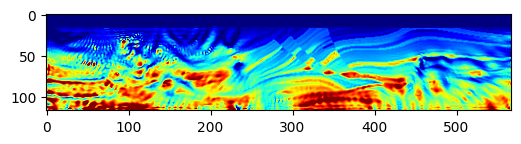

Epoch: 451 Loss:  6135.905517578125 model_loss:  419598.8
Epoch: 452 Loss:  6104.87939453125 model_loss:  419987.8
Epoch: 453 Loss:  6119.924560546875 model_loss:  420266.16
Epoch: 454 Loss:  6125.52587890625 model_loss:  420472.78
Epoch: 455 Loss:  6111.85888671875 model_loss:  420940.5
Epoch: 456 Loss:  6131.406005859375 model_loss:  421022.4
Epoch: 457 Loss:  6096.565673828125 model_loss:  421534.97
Epoch: 458 Loss:  6107.5009765625 model_loss:  421686.34
Epoch: 459 Loss:  6088.4091796875 model_loss:  422056.12
Epoch: 460 Loss:  6099.1650390625 model_loss:  422380.78


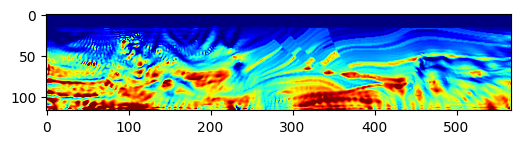

Epoch: 461 Loss:  6109.6767578125 model_loss:  422567.12
Epoch: 462 Loss:  6089.16259765625 model_loss:  423052.12
Epoch: 463 Loss:  6107.658935546875 model_loss:  423146.47
Epoch: 464 Loss:  6072.6044921875 model_loss:  423634.0
Epoch: 465 Loss:  6084.20263671875 model_loss:  423812.38
Epoch: 466 Loss:  6075.871337890625 model_loss:  424122.75
Epoch: 467 Loss:  6079.591064453125 model_loss:  424488.03
Epoch: 468 Loss:  6094.382568359375 model_loss:  424640.9
Epoch: 469 Loss:  6066.14501953125 model_loss:  425135.22
Epoch: 470 Loss:  6082.6298828125 model_loss:  425230.28


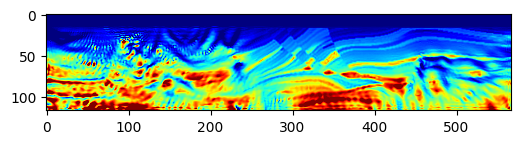

Epoch: 471 Loss:  6047.2509765625 model_loss:  425666.2
Epoch: 472 Loss:  6062.291748046875 model_loss:  425876.44
Epoch: 473 Loss:  6061.240966796875 model_loss:  426139.62
Epoch: 474 Loss:  6059.7041015625 model_loss:  426524.56
Epoch: 475 Loss:  6075.21728515625 model_loss:  426640.94
Epoch: 476 Loss:  6044.456298828125 model_loss:  427133.03
Epoch: 477 Loss:  6057.919189453125 model_loss:  427226.47
Epoch: 478 Loss:  6025.072509765625 model_loss:  427627.97
Epoch: 479 Loss:  6040.744140625 model_loss:  427853.4
Epoch: 480 Loss:  6044.739990234375 model_loss:  428095.03


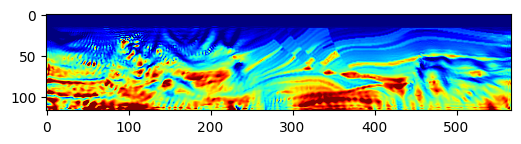

Epoch: 481 Loss:  6040.3662109375 model_loss:  428473.88
Epoch: 482 Loss:  6054.572509765625 model_loss:  428577.22
Epoch: 483 Loss:  6024.984619140625 model_loss:  429061.06
Epoch: 484 Loss:  6034.03271484375 model_loss:  429163.12
Epoch: 485 Loss:  6008.052978515625 model_loss:  429547.4
Epoch: 486 Loss:  6022.692138671875 model_loss:  429776.97
Epoch: 487 Loss:  6030.739501953125 model_loss:  430002.53
Epoch: 488 Loss:  6022.54150390625 model_loss:  430380.7
Epoch: 489 Loss:  6035.67236328125 model_loss:  430486.9
Epoch: 490 Loss:  6006.89208984375 model_loss:  430959.16


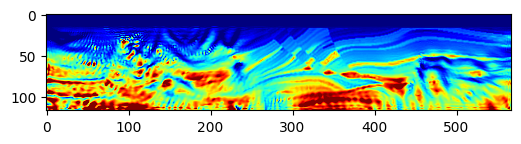

Epoch: 491 Loss:  6012.03955078125 model_loss:  431072.78
Epoch: 492 Loss:  5999.201416015625 model_loss:  431424.22
Epoch: 493 Loss:  6013.07080078125 model_loss:  431682.62
Epoch: 494 Loss:  6022.975341796875 model_loss:  431883.16
Epoch: 495 Loss:  6007.53759765625 model_loss:  432296.94
Epoch: 496 Loss:  6021.78515625 model_loss:  432398.75
Epoch: 497 Loss:  5990.8173828125 model_loss:  432864.56
Epoch: 498 Loss:  5999.0908203125 model_loss:  433008.2
Epoch: 499 Loss:  5993.795166015625 model_loss:  433311.28
Epoch: 500 Loss:  6002.572998046875 model_loss:  433613.44


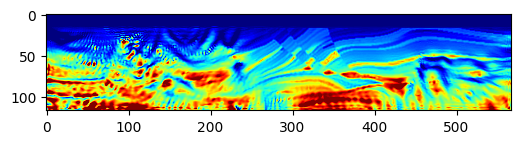

Epoch: 501 Loss:  6013.681884765625 model_loss:  433779.3
Epoch: 502 Loss:  5991.9638671875 model_loss:  434226.56
Epoch: 503 Loss:  6005.308837890625 model_loss:  434313.38
Epoch: 504 Loss:  5974.54736328125 model_loss:  434741.94
Epoch: 505 Loss:  5986.368408203125 model_loss:  434912.97
Epoch: 506 Loss:  5985.327392578125 model_loss:  435183.28
Epoch: 507 Loss:  5989.057373046875 model_loss:  435510.66
Epoch: 508 Loss:  6000.47216796875 model_loss:  435643.06
Epoch: 509 Loss:  5976.224853515625 model_loss:  436093.94
Epoch: 510 Loss:  5987.03759765625 model_loss:  436186.3


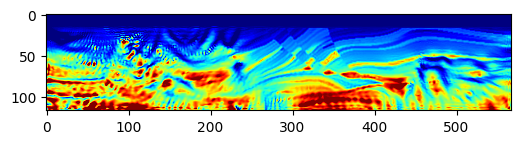

Epoch: 511 Loss:  5958.919677734375 model_loss:  436580.16
Epoch: 512 Loss:  5972.931884765625 model_loss:  436771.44
Epoch: 513 Loss:  5975.80078125 model_loss:  437015.78
Epoch: 514 Loss:  5975.0283203125 model_loss:  437343.78
Epoch: 515 Loss:  5986.780029296875 model_loss:  437471.2
Epoch: 516 Loss:  5917.006103515625 model_loss:  437930.1
Epoch: 517 Loss:  5927.075927734375 model_loss:  438055.62
Epoch: 518 Loss:  5893.18359375 model_loss:  438421.94
Epoch: 519 Loss:  5922.9599609375 model_loss:  438666.47
Epoch: 520 Loss:  5934.40625 model_loss:  438856.66


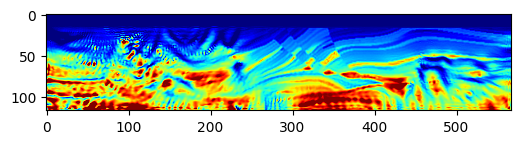

Epoch: 521 Loss:  5922.873291015625 model_loss:  439241.62
Epoch: 522 Loss:  5941.052490234375 model_loss:  439360.22
Epoch: 523 Loss:  5900.6318359375 model_loss:  439839.84
Epoch: 524 Loss:  5907.099853515625 model_loss:  439940.3
Epoch: 525 Loss:  5874.17041015625 model_loss:  440280.72
Epoch: 526 Loss:  5897.169921875 model_loss:  440522.97
Epoch: 527 Loss:  5912.257568359375 model_loss:  440699.03
Epoch: 528 Loss:  5910.96728515625 model_loss:  441087.4
Epoch: 529 Loss:  5920.272216796875 model_loss:  441169.38
Epoch: 530 Loss:  5891.556396484375 model_loss:  441677.28


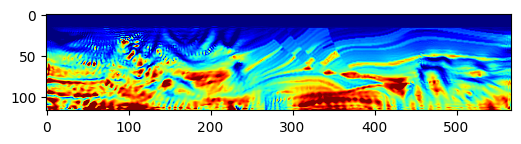

Epoch: 531 Loss:  5905.39111328125 model_loss:  441749.78
Epoch: 532 Loss:  5866.55859375 model_loss:  442162.1
Epoch: 533 Loss:  5875.053955078125 model_loss:  442335.0
Epoch: 534 Loss:  5879.53662109375 model_loss:  442569.28
Epoch: 535 Loss:  5869.6669921875 model_loss:  442877.47
Epoch: 536 Loss:  5874.21484375 model_loss:  443075.28
Epoch: 537 Loss:  5854.648681640625 model_loss:  443448.22
Epoch: 538 Loss:  5859.100830078125 model_loss:  443607.28
Epoch: 539 Loss:  5861.67431640625 model_loss:  443905.94
Epoch: 540 Loss:  5864.6259765625 model_loss:  444161.2


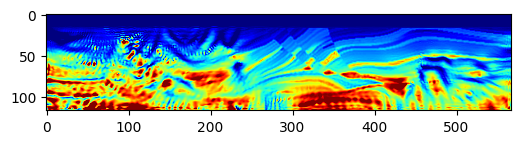

Epoch: 541 Loss:  5883.431884765625 model_loss:  444358.94
Epoch: 542 Loss:  5857.19140625 model_loss:  444719.5
Epoch: 543 Loss:  5876.198974609375 model_loss:  444904.72
Epoch: 544 Loss:  5835.77197265625 model_loss:  445274.5
Epoch: 545 Loss:  5849.37646484375 model_loss:  445456.4
Epoch: 546 Loss:  5864.26953125 model_loss:  445684.97
Epoch: 547 Loss:  5882.2783203125 model_loss:  445961.4
Epoch: 548 Loss:  5892.31103515625 model_loss:  446080.7
Epoch: 549 Loss:  5869.2939453125 model_loss:  446522.53
Epoch: 550 Loss:  5886.22216796875 model_loss:  446562.8


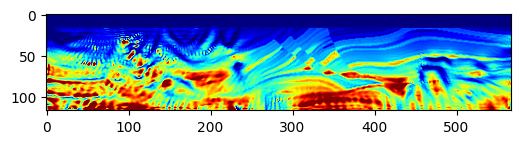

Epoch: 551 Loss:  5847.823974609375 model_loss:  446991.72
Epoch: 552 Loss:  5860.529296875 model_loss:  447102.1
Epoch: 553 Loss:  5818.2998046875 model_loss:  447364.47
Epoch: 554 Loss:  5828.41064453125 model_loss:  447604.12
Epoch: 555 Loss:  5815.983642578125 model_loss:  447752.66
Epoch: 556 Loss:  5812.6435546875 model_loss:  448000.0
Epoch: 557 Loss:  5802.171142578125 model_loss:  448219.62
Epoch: 558 Loss:  5801.67138671875 model_loss:  448426.25
Epoch: 559 Loss:  5800.80908203125 model_loss:  448650.34
Epoch: 560 Loss:  5812.181884765625 model_loss:  448844.28


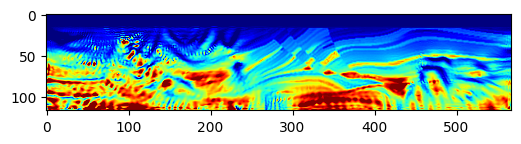

Epoch: 561 Loss:  5803.56201171875 model_loss:  449110.06
Epoch: 562 Loss:  5808.96826171875 model_loss:  449292.72
Epoch: 563 Loss:  5799.373046875 model_loss:  449570.2
Epoch: 564 Loss:  5800.90576171875 model_loss:  449711.72
Epoch: 565 Loss:  5802.480712890625 model_loss:  450004.16
Epoch: 566 Loss:  5796.239990234375 model_loss:  450103.56
Epoch: 567 Loss:  5793.31103515625 model_loss:  450411.28
Epoch: 568 Loss:  5785.9658203125 model_loss:  450506.3
Epoch: 569 Loss:  5786.836669921875 model_loss:  450805.62
Epoch: 570 Loss:  5791.986328125 model_loss:  450923.2


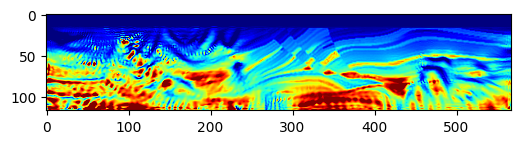

Epoch: 571 Loss:  5789.308837890625 model_loss:  451208.66
Epoch: 572 Loss:  5791.599609375 model_loss:  451362.34
Epoch: 573 Loss:  5790.412109375 model_loss:  451589.88
Epoch: 574 Loss:  5788.6796875 model_loss:  451758.2
Epoch: 575 Loss:  5786.537109375 model_loss:  452015.9
Epoch: 576 Loss:  5782.30224609375 model_loss:  452151.4
Epoch: 577 Loss:  5777.818603515625 model_loss:  452444.16
Epoch: 578 Loss:  5774.94482421875 model_loss:  452578.88
Epoch: 579 Loss:  5771.87744140625 model_loss:  452856.12
Epoch: 580 Loss:  5772.895751953125 model_loss:  453007.8


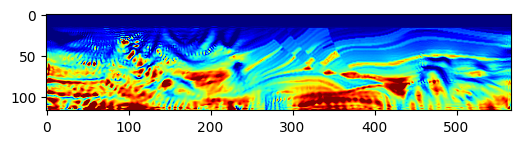

Epoch: 581 Loss:  5769.899658203125 model_loss:  453278.8
Epoch: 582 Loss:  5769.845947265625 model_loss:  453441.1
Epoch: 583 Loss:  5767.07470703125 model_loss:  453709.53
Epoch: 584 Loss:  5765.515380859375 model_loss:  453881.94
Epoch: 585 Loss:  5762.1103515625 model_loss:  454162.7
Epoch: 586 Loss:  5759.801025390625 model_loss:  454329.8
Epoch: 587 Loss:  5757.0234375 model_loss:  454622.88
Epoch: 588 Loss:  5755.697021484375 model_loss:  454790.34
Epoch: 589 Loss:  5830.419921875 model_loss:  455081.1
Epoch: 590 Loss:  5826.3076171875 model_loss:  455222.0


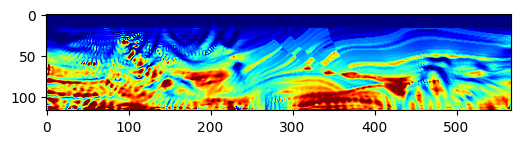

Epoch: 591 Loss:  5815.3056640625 model_loss:  455523.3
Epoch: 592 Loss:  5816.0888671875 model_loss:  455662.66
Epoch: 593 Loss:  5806.5546875 model_loss:  455948.34
Epoch: 594 Loss:  5815.62060546875 model_loss:  456115.8
Epoch: 595 Loss:  5801.91796875 model_loss:  456389.53
Epoch: 596 Loss:  5811.75830078125 model_loss:  456589.3
Epoch: 597 Loss:  5801.970703125 model_loss:  456838.78
Epoch: 598 Loss:  5806.894287109375 model_loss:  457069.75
Epoch: 599 Loss:  5798.724609375 model_loss:  457321.22
Epoch: 600 Loss:  5800.61328125 model_loss:  457524.25


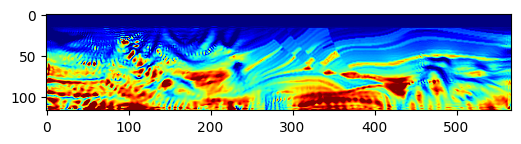

Epoch: 601 Loss:  5791.384765625 model_loss:  457839.34
Epoch: 602 Loss:  5792.08642578125 model_loss:  458010.84
Epoch: 603 Loss:  5784.634765625 model_loss:  458305.8
Epoch: 604 Loss:  5789.662109375 model_loss:  458497.2
Epoch: 605 Loss:  5781.149169921875 model_loss:  458793.2
Epoch: 606 Loss:  5785.48193359375 model_loss:  459006.0
Epoch: 607 Loss:  5781.0751953125 model_loss:  459253.72
Epoch: 608 Loss:  5783.07421875 model_loss:  459483.53
Epoch: 609 Loss:  5782.169921875 model_loss:  459763.9
Epoch: 610 Loss:  5779.796142578125 model_loss:  459954.6


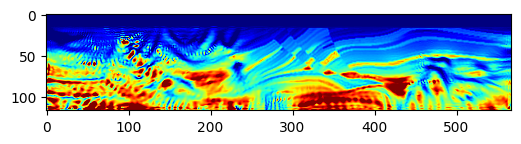

Epoch: 611 Loss:  5776.09033203125 model_loss:  460262.44
Epoch: 612 Loss:  5774.48974609375 model_loss:  460430.78
Epoch: 613 Loss:  5770.60400390625 model_loss:  460744.78
Epoch: 614 Loss:  5771.140625 model_loss:  460918.75
Epoch: 615 Loss:  5767.345703125 model_loss:  461216.53
Epoch: 616 Loss:  5767.65576171875 model_loss:  461400.16
Epoch: 617 Loss:  5767.181640625 model_loss:  461691.3
Epoch: 618 Loss:  5765.94091796875 model_loss:  461877.84
Epoch: 619 Loss:  5766.332763671875 model_loss:  462179.47
Epoch: 620 Loss:  5763.73779296875 model_loss:  462348.56


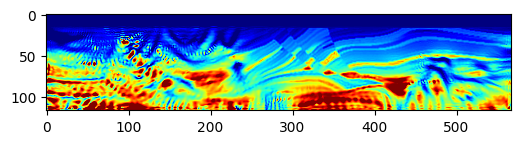

Epoch: 621 Loss:  5761.570068359375 model_loss:  462666.4
Epoch: 622 Loss:  5760.14306640625 model_loss:  462832.7
Epoch: 623 Loss:  5757.331298828125 model_loss:  463149.56
Epoch: 624 Loss:  5756.849853515625 model_loss:  463321.16
Epoch: 625 Loss:  5754.94189453125 model_loss:  463632.97
Epoch: 626 Loss:  5753.806396484375 model_loss:  463814.38
Epoch: 627 Loss:  5753.3857421875 model_loss:  464122.56
Epoch: 628 Loss:  5751.453125 model_loss:  464300.5
Epoch: 629 Loss:  5750.450927734375 model_loss:  464622.0
Epoch: 630 Loss:  5748.880859375 model_loss:  464795.44


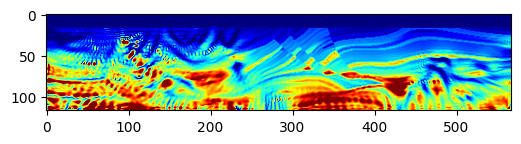

Epoch: 631 Loss:  5746.7548828125 model_loss:  465120.6
Epoch: 632 Loss:  5745.7421875 model_loss:  465300.44
Epoch: 633 Loss:  5743.54150390625 model_loss:  465625.4
Epoch: 634 Loss:  5742.4912109375 model_loss:  465812.03
Epoch: 635 Loss:  5741.0546875 model_loss:  466137.66
Epoch: 636 Loss:  5739.54931640625 model_loss:  466327.44
Epoch: 637 Loss:  5738.447021484375 model_loss:  466656.03
Epoch: 638 Loss:  5736.97216796875 model_loss:  466847.47
Epoch: 639 Loss:  5735.763916015625 model_loss:  467179.88
Epoch: 640 Loss:  5734.414794921875 model_loss:  467372.9


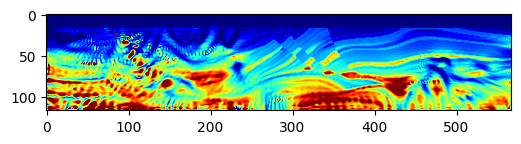

Epoch: 641 Loss:  5733.1572265625 model_loss:  467708.12
Epoch: 642 Loss:  5731.626953125 model_loss:  467904.3
Epoch: 643 Loss:  5730.5185546875 model_loss:  468240.72
Epoch: 644 Loss:  5728.7685546875 model_loss:  468437.22
Epoch: 645 Loss:  5727.8701171875 model_loss:  468773.94
Epoch: 646 Loss:  5726.049072265625 model_loss:  468970.97
Epoch: 647 Loss:  5725.34228515625 model_loss:  469305.88
Epoch: 648 Loss:  5723.5107421875 model_loss:  469503.8
Epoch: 649 Loss:  5723.0478515625 model_loss:  469837.84
Epoch: 650 Loss:  5721.03857421875 model_loss:  470035.6


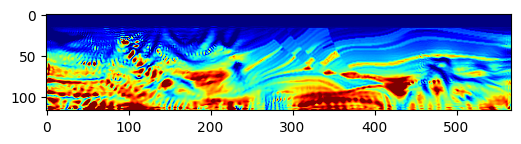

Epoch: 651 Loss:  5720.707275390625 model_loss:  470369.78
Epoch: 652 Loss:  5718.528076171875 model_loss:  470566.34
Epoch: 653 Loss:  5718.240966796875 model_loss:  470899.47
Epoch: 654 Loss:  5715.981689453125 model_loss:  471095.25
Epoch: 655 Loss:  5715.83642578125 model_loss:  471425.97
Epoch: 656 Loss:  5713.462646484375 model_loss:  471621.56
Epoch: 657 Loss:  5713.59521484375 model_loss:  471950.53
Epoch: 658 Loss:  5711.071533203125 model_loss:  472145.1
Epoch: 659 Loss:  5711.394287109375 model_loss:  472473.06
Epoch: 660 Loss:  5708.722900390625 model_loss:  472666.34


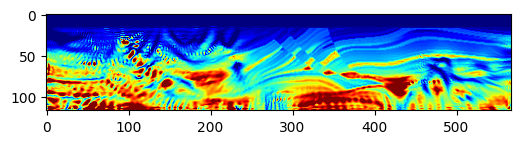

Epoch: 661 Loss:  5709.15185546875 model_loss:  472992.44
Epoch: 662 Loss:  5706.2861328125 model_loss:  473185.1
Epoch: 663 Loss:  5706.8251953125 model_loss:  473508.47
Epoch: 664 Loss:  5703.817138671875 model_loss:  473699.88
Epoch: 665 Loss:  5704.4716796875 model_loss:  474020.72
Epoch: 666 Loss:  5701.3759765625 model_loss:  474211.22
Epoch: 667 Loss:  5702.177734375 model_loss:  474529.2
Epoch: 668 Loss:  5698.96337890625 model_loss:  474719.72
Epoch: 669 Loss:  5699.9208984375 model_loss:  475034.62
Epoch: 670 Loss:  5696.577392578125 model_loss:  475225.22


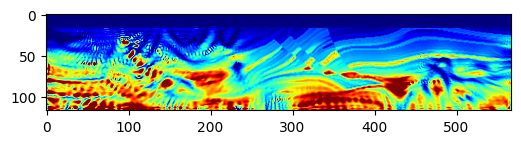

Epoch: 671 Loss:  5697.6474609375 model_loss:  475537.72
Epoch: 672 Loss:  5694.183837890625 model_loss:  475728.12
Epoch: 673 Loss:  5695.37841796875 model_loss:  476038.28
Epoch: 674 Loss:  5691.7626953125 model_loss:  476229.03
Epoch: 675 Loss:  5693.1455078125 model_loss:  476536.84
Epoch: 676 Loss:  5689.389404296875 model_loss:  476727.7
Epoch: 677 Loss:  5690.88623046875 model_loss:  477033.38
Epoch: 678 Loss:  5687.0625 model_loss:  477224.34
Epoch: 679 Loss:  5688.649658203125 model_loss:  477527.62
Epoch: 680 Loss:  5684.70654296875 model_loss:  477719.25


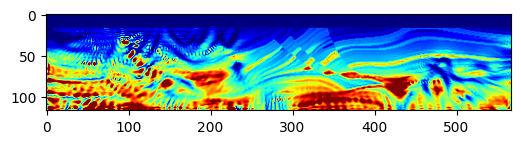

Epoch: 681 Loss:  5686.448486328125 model_loss:  478020.0
Epoch: 682 Loss:  5682.40185546875 model_loss:  478211.94
Epoch: 683 Loss:  5684.22509765625 model_loss:  478510.88
Epoch: 684 Loss:  5680.1337890625 model_loss:  478703.0
Epoch: 685 Loss:  5682.05224609375 model_loss:  478999.4
Epoch: 686 Loss:  5677.823974609375 model_loss:  479192.53
Epoch: 687 Loss:  5679.867431640625 model_loss:  479485.8
Epoch: 688 Loss:  5675.555419921875 model_loss:  479678.97
Epoch: 689 Loss:  5677.69189453125 model_loss:  479969.4
Epoch: 690 Loss:  5673.320068359375 model_loss:  480162.6


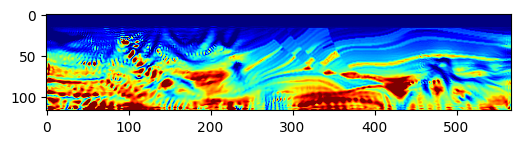

Epoch: 691 Loss:  5675.568115234375 model_loss:  480449.53
Epoch: 692 Loss:  5671.031982421875 model_loss:  480642.97
Epoch: 693 Loss:  5673.43994140625 model_loss:  480926.0
Epoch: 694 Loss:  5668.886962890625 model_loss:  481118.8
Epoch: 695 Loss:  5671.331787109375 model_loss:  481397.9
Epoch: 696 Loss:  5666.75146484375 model_loss:  481590.6
Epoch: 697 Loss:  5669.341552734375 model_loss:  481865.44
Epoch: 698 Loss:  5664.591064453125 model_loss:  482058.12
Epoch: 699 Loss:  5667.29150390625 model_loss:  482328.75
Epoch: 700 Loss:  5662.649169921875 model_loss:  482521.44


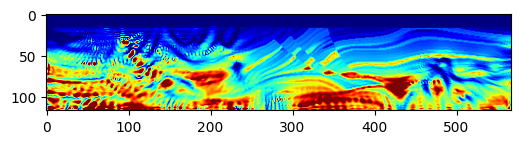

Epoch: 701 Loss:  5665.31494140625 model_loss:  482788.97
Epoch: 702 Loss:  5660.59228515625 model_loss:  482982.28
Epoch: 703 Loss:  5663.396484375 model_loss:  483247.53
Epoch: 704 Loss:  5658.572265625 model_loss:  483441.5
Epoch: 705 Loss:  5661.38037109375 model_loss:  483705.94
Epoch: 706 Loss:  5656.6884765625 model_loss:  483900.0
Epoch: 707 Loss:  5659.436767578125 model_loss:  484165.0
Epoch: 708 Loss:  5654.552001953125 model_loss:  484359.78
Epoch: 709 Loss:  5657.61376953125 model_loss:  484624.72
Epoch: 710 Loss:  5652.790771484375 model_loss:  484819.1


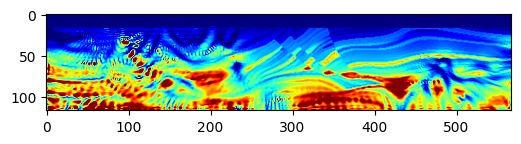

Epoch: 711 Loss:  5655.723388671875 model_loss:  485082.16
Epoch: 712 Loss:  5651.103271484375 model_loss:  485276.5
Epoch: 713 Loss:  5654.1279296875 model_loss:  485537.94
Epoch: 714 Loss:  5649.114013671875 model_loss:  485732.1
Epoch: 715 Loss:  5652.3662109375 model_loss:  485989.47
Epoch: 716 Loss:  5647.849365234375 model_loss:  486182.9
Epoch: 717 Loss:  5650.6513671875 model_loss:  486436.47
Epoch: 718 Loss:  5645.93310546875 model_loss:  486629.44
Epoch: 719 Loss:  5649.294921875 model_loss:  486880.88
Epoch: 720 Loss:  5644.3623046875 model_loss:  487071.28


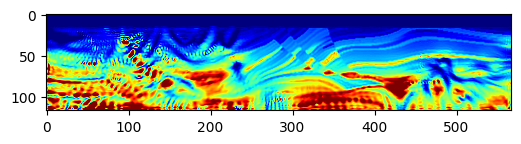

Epoch: 721 Loss:  5647.5146484375 model_loss:  487318.22
Epoch: 722 Loss:  5643.3095703125 model_loss:  487506.22
Epoch: 723 Loss:  5645.978759765625 model_loss:  487751.62
Epoch: 724 Loss:  5640.794189453125 model_loss:  487937.66
Epoch: 725 Loss:  5644.3115234375 model_loss:  488181.66
Epoch: 726 Loss:  5639.85546875 model_loss:  488365.97
Epoch: 727 Loss:  5642.303466796875 model_loss:  488602.06
Epoch: 728 Loss:  5637.670166015625 model_loss:  488789.34
Epoch: 729 Loss:  5641.4716796875 model_loss:  489028.97
Epoch: 730 Loss:  5635.568115234375 model_loss:  489212.16


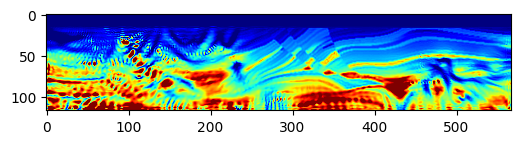

Epoch: 731 Loss:  5639.426025390625 model_loss:  489447.53
Epoch: 732 Loss:  5636.432373046875 model_loss:  489633.16
Epoch: 733 Loss:  5637.82080078125 model_loss:  489867.7
Epoch: 734 Loss:  5633.01025390625 model_loss:  490056.16
Epoch: 735 Loss:  5637.22705078125 model_loss:  490300.62
Epoch: 736 Loss:  5633.41064453125 model_loss:  490481.12
Epoch: 737 Loss:  5635.466064453125 model_loss:  490712.4
Epoch: 738 Loss:  5630.736572265625 model_loss:  490903.56
Epoch: 739 Loss:  5636.263427734375 model_loss:  491148.44
Epoch: 740 Loss:  5627.9287109375 model_loss:  491329.94


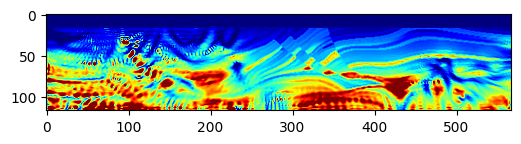

Epoch: 741 Loss:  5632.896728515625 model_loss:  491570.22
Epoch: 742 Loss:  5638.040771484375 model_loss:  491748.1
Epoch: 743 Loss:  5630.530517578125 model_loss:  491975.72
Epoch: 744 Loss:  5630.812744140625 model_loss:  492167.56
Epoch: 745 Loss:  5636.452392578125 model_loss:  492415.03
Epoch: 746 Loss:  5628.74267578125 model_loss:  492584.22
Epoch: 747 Loss:  5638.544189453125 model_loss:  492803.7
Epoch: 748 Loss:  5632.036376953125 model_loss:  492966.38
Epoch: 749 Loss:  5634.379638671875 model_loss:  493204.25
Epoch: 750 Loss:  5636.595458984375 model_loss:  493390.22


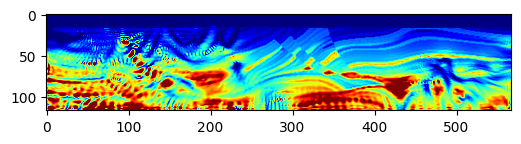

Epoch: 751 Loss:  5627.755859375 model_loss:  493604.4
Epoch: 752 Loss:  5646.06689453125 model_loss:  493751.44
Epoch: 753 Loss:  5640.0966796875 model_loss:  493996.12
Epoch: 754 Loss:  5620.892822265625 model_loss:  494138.84
Epoch: 755 Loss:  5648.232177734375 model_loss:  494355.28
Epoch: 756 Loss:  5634.123291015625 model_loss:  494563.6
Epoch: 757 Loss:  5625.19091796875 model_loss:  494763.47
Epoch: 758 Loss:  5659.974853515625 model_loss:  494860.3
Epoch: 759 Loss:  5637.331787109375 model_loss:  495161.06
Epoch: 760 Loss:  5620.72998046875 model_loss:  495311.03


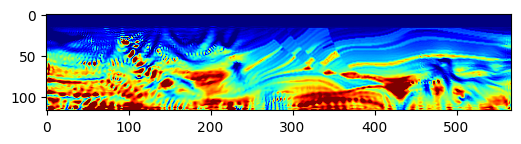

Epoch: 761 Loss:  5659.5673828125 model_loss:  495460.53
Epoch: 762 Loss:  5636.0009765625 model_loss:  495704.4
Epoch: 763 Loss:  5621.2314453125 model_loss:  495891.38
Epoch: 764 Loss:  5652.65771484375 model_loss:  495960.25
Epoch: 765 Loss:  5637.146484375 model_loss:  496293.25
Epoch: 766 Loss:  5615.2275390625 model_loss:  496423.06
Epoch: 767 Loss:  5641.329345703125 model_loss:  496570.06
Epoch: 768 Loss:  5629.271484375 model_loss:  496820.97
Epoch: 769 Loss:  5614.75341796875 model_loss:  497000.97
Epoch: 770 Loss:  5640.17138671875 model_loss:  497096.0


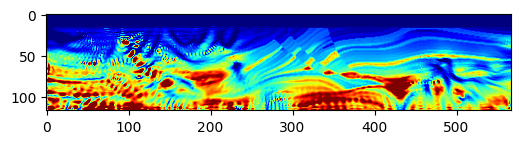

Epoch: 771 Loss:  5624.83251953125 model_loss:  497429.1
Epoch: 772 Loss:  5609.4130859375 model_loss:  497546.8
Epoch: 773 Loss:  5643.248046875 model_loss:  497735.1
Epoch: 774 Loss:  5621.544677734375 model_loss:  497966.38
Epoch: 775 Loss:  5617.345458984375 model_loss:  498163.7
Epoch: 776 Loss:  5646.396484375 model_loss:  498261.7
Epoch: 777 Loss:  5623.50830078125 model_loss:  498591.06
Epoch: 778 Loss:  5609.696044921875 model_loss:  498728.25
Epoch: 779 Loss:  5645.043701171875 model_loss:  498881.62
Epoch: 780 Loss:  5621.26318359375 model_loss:  499155.97


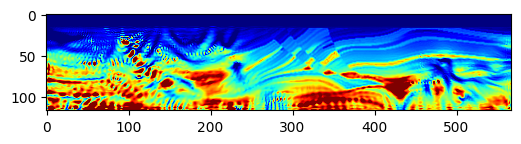

Epoch: 781 Loss:  5608.762451171875 model_loss:  499346.78
Epoch: 782 Loss:  5638.083984375 model_loss:  499445.2
Epoch: 783 Loss:  5618.442626953125 model_loss:  499788.56
Epoch: 784 Loss:  5601.013671875 model_loss:  499941.2
Epoch: 785 Loss:  5632.637939453125 model_loss:  500082.22
Epoch: 786 Loss:  5612.257080078125 model_loss:  500375.7
Epoch: 787 Loss:  5602.347900390625 model_loss:  500570.7
Epoch: 788 Loss:  5633.156005859375 model_loss:  500675.78
Epoch: 789 Loss:  5611.2041015625 model_loss:  501015.7
Epoch: 790 Loss:  5600.6142578125 model_loss:  501194.84


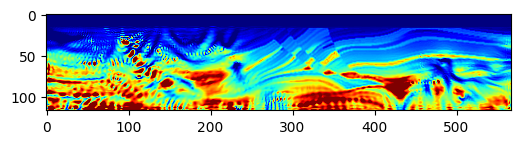

Epoch: 791 Loss:  5635.995849609375 model_loss:  501327.22
Epoch: 792 Loss:  5610.387451171875 model_loss:  501625.88
Epoch: 793 Loss:  5601.130859375 model_loss:  501845.34
Epoch: 794 Loss:  5633.594970703125 model_loss:  501931.5
Epoch: 795 Loss:  5610.812255859375 model_loss:  502269.9
Epoch: 796 Loss:  5593.39697265625 model_loss:  502460.88
Epoch: 797 Loss:  5625.24169921875 model_loss:  502567.75
Epoch: 798 Loss:  5605.939697265625 model_loss:  502880.25
Epoch: 799 Loss:  5589.9892578125 model_loss:  503085.3
Epoch: 800 Loss:  5617.7265625 model_loss:  503180.78


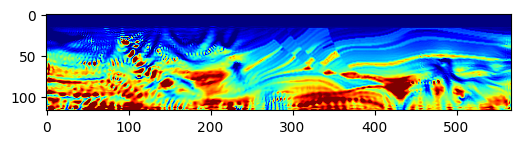

Epoch: 801 Loss:  5600.7119140625 model_loss:  503514.84
Epoch: 802 Loss:  5586.3583984375 model_loss:  503701.62
Epoch: 803 Loss:  5616.399658203125 model_loss:  503824.06
Epoch: 804 Loss:  5596.376953125 model_loss:  504130.12
Epoch: 805 Loss:  5588.36865234375 model_loss:  504332.7
Epoch: 806 Loss:  5620.522216796875 model_loss:  504441.0
Epoch: 807 Loss:  5597.14306640625 model_loss:  504753.88
Epoch: 808 Loss:  5588.80859375 model_loss:  504959.53
Epoch: 809 Loss:  5622.050537109375 model_loss:  505061.97
Epoch: 810 Loss:  5598.281005859375 model_loss:  505369.44


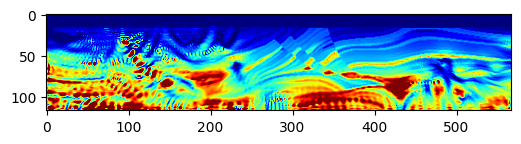

Epoch: 811 Loss:  5585.05322265625 model_loss:  505578.38
Epoch: 812 Loss:  5615.373291015625 model_loss:  505674.78
Epoch: 813 Loss:  5595.8544921875 model_loss:  505987.3
Epoch: 814 Loss:  5581.14697265625 model_loss:  506190.47
Epoch: 815 Loss:  5608.30322265625 model_loss:  506289.34
Epoch: 816 Loss:  5591.16064453125 model_loss:  506608.75
Epoch: 817 Loss:  5576.62548828125 model_loss:  506800.47
Epoch: 818 Loss:  5602.56396484375 model_loss:  506931.03
Epoch: 819 Loss:  5586.3369140625 model_loss:  507223.34
Epoch: 820 Loss:  5580.604736328125 model_loss:  507442.53


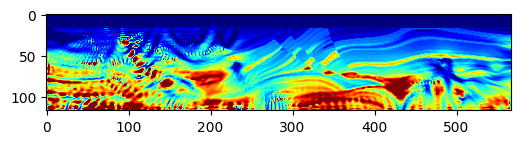

Epoch: 821 Loss:  5609.298583984375 model_loss:  507548.62
Epoch: 822 Loss:  5587.5546875 model_loss:  507870.88
Epoch: 823 Loss:  5577.53759765625 model_loss:  508072.8
Epoch: 824 Loss:  5608.45556640625 model_loss:  508220.78
Epoch: 825 Loss:  5586.82421875 model_loss:  508491.9
Epoch: 826 Loss:  5582.893798828125 model_loss:  508741.56
Epoch: 827 Loss:  5609.573486328125 model_loss:  508811.44
Epoch: 828 Loss:  5589.387939453125 model_loss:  509157.53
Epoch: 829 Loss:  5572.904296875 model_loss:  509350.25
Epoch: 830 Loss:  5598.421142578125 model_loss:  509492.1


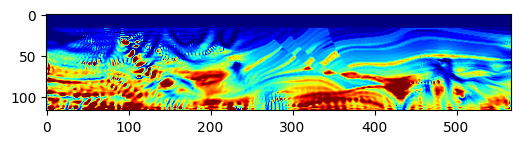

Epoch: 831 Loss:  5582.768798828125 model_loss:  509763.6
Epoch: 832 Loss:  5575.809326171875 model_loss:  509991.7
Epoch: 833 Loss:  5599.393310546875 model_loss:  510076.25
Epoch: 834 Loss:  5582.75341796875 model_loss:  510412.56
Epoch: 835 Loss:  5569.20947265625 model_loss:  510599.4
Epoch: 836 Loss:  5594.37841796875 model_loss:  510761.16
Epoch: 837 Loss:  5576.7265625 model_loss:  511032.22
Epoch: 838 Loss:  5574.9423828125 model_loss:  511261.12
Epoch: 839 Loss:  5600.329345703125 model_loss:  511358.44
Epoch: 840 Loss:  5579.75390625 model_loss:  511678.0


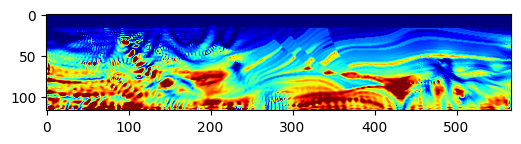

Epoch: 841 Loss:  5568.43798828125 model_loss:  511899.2
Epoch: 842 Loss:  5597.796875 model_loss:  512039.53
Epoch: 843 Loss:  5577.04443359375 model_loss:  512337.3
Epoch: 844 Loss:  5570.435791015625 model_loss:  512557.8
Epoch: 845 Loss:  5598.92626953125 model_loss:  512671.25
Epoch: 846 Loss:  5578.60498046875 model_loss:  512980.06
Epoch: 847 Loss:  5566.22021484375 model_loss:  513220.4
Epoch: 848 Loss:  5593.36865234375 model_loss:  513328.12
Epoch: 849 Loss:  5575.254638671875 model_loss:  513663.0
Epoch: 850 Loss:  5563.082275390625 model_loss:  513840.84


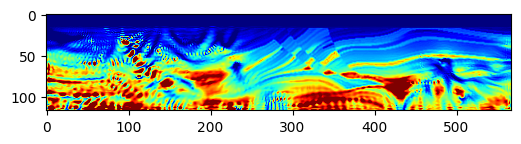

Epoch: 851 Loss:  5590.328369140625 model_loss:  514000.5
Epoch: 852 Loss:  5572.995361328125 model_loss:  514278.4
Epoch: 853 Loss:  5565.097412109375 model_loss:  514534.38
Epoch: 854 Loss:  5591.396484375 model_loss:  514632.5
Epoch: 855 Loss:  5572.95263671875 model_loss:  514974.4
Epoch: 856 Loss:  5561.29296875 model_loss:  515154.38
Epoch: 857 Loss:  5591.66015625 model_loss:  515323.5
Epoch: 858 Loss:  5571.85986328125 model_loss:  515602.94
Epoch: 859 Loss:  5563.095947265625 model_loss:  515846.34
Epoch: 860 Loss:  5587.2607421875 model_loss:  515969.84


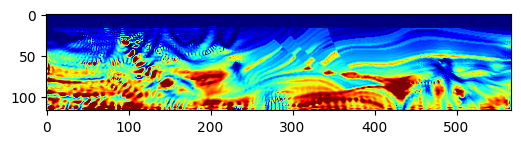

Epoch: 861 Loss:  5571.1474609375 model_loss:  516281.16
Epoch: 862 Loss:  5562.67431640625 model_loss:  516519.25
Epoch: 863 Loss:  5586.1298828125 model_loss:  516629.4
Epoch: 864 Loss:  5569.6298828125 model_loss:  516981.78
Epoch: 865 Loss:  5559.6904296875 model_loss:  517151.84
Epoch: 866 Loss:  5581.5400390625 model_loss:  517365.38
Epoch: 867 Loss:  5566.1220703125 model_loss:  517592.47
Epoch: 868 Loss:  5569.1572265625 model_loss:  517895.9
Epoch: 869 Loss:  5581.6826171875 model_loss:  517949.16
Epoch: 870 Loss:  5570.685546875 model_loss:  518332.97


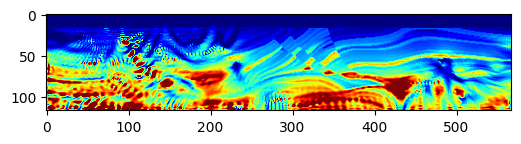

Epoch: 871 Loss:  5556.57763671875 model_loss:  518477.5
Epoch: 872 Loss:  5576.03662109375 model_loss:  518712.8
Epoch: 873 Loss:  5559.91943359375 model_loss:  518927.56
Epoch: 874 Loss:  5567.36328125 model_loss:  519200.34
Epoch: 875 Loss:  5581.684326171875 model_loss:  519300.3
Epoch: 876 Loss:  5567.19580078125 model_loss:  519618.22
Epoch: 877 Loss:  5555.0966796875 model_loss:  519851.06
Epoch: 878 Loss:  5580.43310546875 model_loss:  520015.6
Epoch: 879 Loss:  5561.99609375 model_loss:  520324.88
Epoch: 880 Loss:  5561.869873046875 model_loss:  520510.72


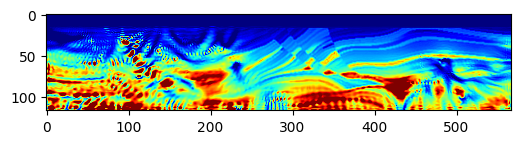

Epoch: 881 Loss:  5581.11083984375 model_loss:  520724.66
Epoch: 882 Loss:  5564.037841796875 model_loss:  520922.62
Epoch: 883 Loss:  5571.20068359375 model_loss:  521306.4
Epoch: 884 Loss:  5579.10009765625 model_loss:  521295.72
Epoch: 885 Loss:  5573.1015625 model_loss:  521730.9
Epoch: 886 Loss:  5560.1611328125 model_loss:  521806.28
Epoch: 887 Loss:  5576.087890625 model_loss:  522100.2
Epoch: 888 Loss:  5558.138671875 model_loss:  522234.4
Epoch: 889 Loss:  5566.956787109375 model_loss:  522566.78
Epoch: 890 Loss:  5569.2451171875 model_loss:  522625.06


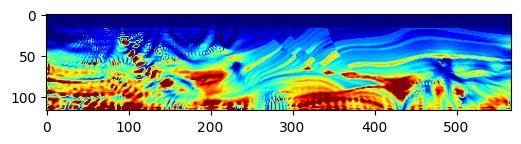

Epoch: 891 Loss:  5563.80615234375 model_loss:  522967.12
Epoch: 892 Loss:  5548.74462890625 model_loss:  523140.06
Epoch: 893 Loss:  5568.75390625 model_loss:  523370.56
Epoch: 894 Loss:  5551.5400390625 model_loss:  523632.84
Epoch: 895 Loss:  5560.072021484375 model_loss:  523860.25
Epoch: 896 Loss:  5569.6416015625 model_loss:  524066.47
Epoch: 897 Loss:  5554.05322265625 model_loss:  524295.6
Epoch: 898 Loss:  5559.96435546875 model_loss:  524655.6
Epoch: 899 Loss:  5568.812744140625 model_loss:  524705.9
Epoch: 900 Loss:  5560.19677734375 model_loss:  525125.44


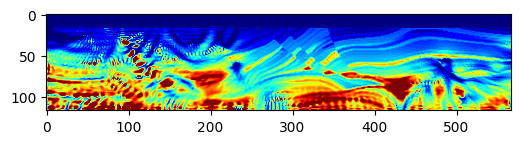

Epoch: 901 Loss:  5554.635009765625 model_loss:  525219.3
Epoch: 902 Loss:  5573.63330078125 model_loss:  525527.06
Epoch: 903 Loss:  5554.927734375 model_loss:  525648.8
Epoch: 904 Loss:  5565.2255859375 model_loss:  526021.5
Epoch: 905 Loss:  5564.082275390625 model_loss:  526057.44
Epoch: 906 Loss:  5558.41748046875 model_loss:  526419.0
Epoch: 907 Loss:  5544.521240234375 model_loss:  526570.44
Epoch: 908 Loss:  5562.672607421875 model_loss:  526813.44
Epoch: 909 Loss:  5544.75 model_loss:  527034.5
Epoch: 910 Loss:  5555.469482421875 model_loss:  527298.06


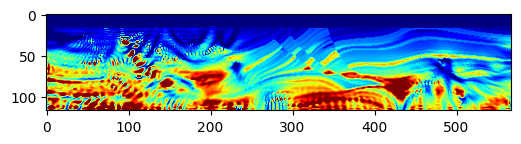

Epoch: 911 Loss:  5556.77490234375 model_loss:  527473.5
Epoch: 912 Loss:  5546.175537109375 model_loss:  527729.7
Epoch: 913 Loss:  5550.970703125 model_loss:  528053.0
Epoch: 914 Loss:  5558.679443359375 model_loss:  528161.3
Epoch: 915 Loss:  5549.49560546875 model_loss:  528528.75
Epoch: 916 Loss:  5552.582763671875 model_loss:  528664.1
Epoch: 917 Loss:  5565.98291015625 model_loss:  528960.75
Epoch: 918 Loss:  5551.560791015625 model_loss:  529093.4
Epoch: 919 Loss:  5560.297119140625 model_loss:  529483.6
Epoch: 920 Loss:  5558.6572265625 model_loss:  529518.1


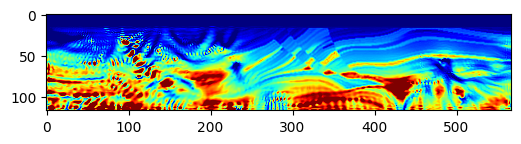

Epoch: 921 Loss:  5552.65283203125 model_loss:  529888.06
Epoch: 922 Loss:  5542.0087890625 model_loss:  530036.0
Epoch: 923 Loss:  5557.446533203125 model_loss:  530294.4
Epoch: 924 Loss:  5540.902099609375 model_loss:  530487.06
Epoch: 925 Loss:  5551.6025390625 model_loss:  530774.56
Epoch: 926 Loss:  5546.075439453125 model_loss:  530933.56
Epoch: 927 Loss:  5541.49755859375 model_loss:  531202.25
Epoch: 928 Loss:  5544.127197265625 model_loss:  531498.6
Epoch: 929 Loss:  5546.8564453125 model_loss:  531642.1
Epoch: 930 Loss:  5544.614990234375 model_loss:  531971.25


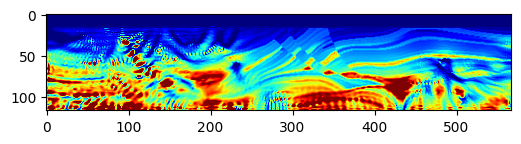

Epoch: 931 Loss:  5549.16748046875 model_loss:  532133.0
Epoch: 932 Loss:  5554.38134765625 model_loss:  532433.56
Epoch: 933 Loss:  5548.3037109375 model_loss:  532554.06
Epoch: 934 Loss:  5552.356689453125 model_loss:  532959.94
Epoch: 935 Loss:  5545.052978515625 model_loss:  533003.7
Epoch: 936 Loss:  5546.391357421875 model_loss:  533372.8
Epoch: 937 Loss:  5539.9931640625 model_loss:  533523.06
Epoch: 938 Loss:  5545.73388671875 model_loss:  533798.4
Epoch: 939 Loss:  5545.90185546875 model_loss:  533962.4
Epoch: 940 Loss:  5548.041748046875 model_loss:  534283.4


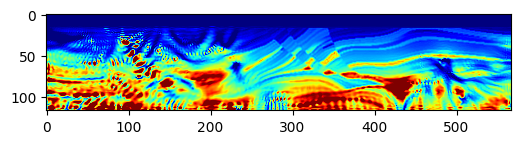

Epoch: 941 Loss:  5532.078125 model_loss:  534443.8
Epoch: 942 Loss:  5546.25537109375 model_loss:  534703.3
Epoch: 943 Loss:  5537.71435546875 model_loss:  535000.7
Epoch: 944 Loss:  5534.123046875 model_loss:  535176.8
Epoch: 945 Loss:  5549.033203125 model_loss:  535464.0
Epoch: 946 Loss:  5538.24755859375 model_loss:  535666.9
Epoch: 947 Loss:  5543.07568359375 model_loss:  536003.75
Epoch: 948 Loss:  5550.463623046875 model_loss:  536083.94
Epoch: 949 Loss:  5543.3974609375 model_loss:  536509.7
Epoch: 950 Loss:  5533.683837890625 model_loss:  536586.75


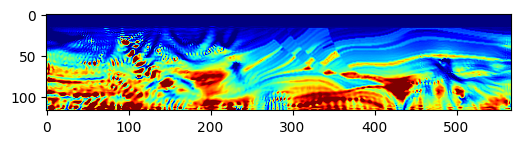

Epoch: 951 Loss:  5553.884521484375 model_loss:  536926.0
Epoch: 952 Loss:  5534.770263671875 model_loss:  537087.9
Epoch: 953 Loss:  5546.070068359375 model_loss:  537423.3
Epoch: 954 Loss:  5550.160888671875 model_loss:  537512.4
Epoch: 955 Loss:  5539.517822265625 model_loss:  537877.56
Epoch: 956 Loss:  5531.720703125 model_loss:  538056.44
Epoch: 957 Loss:  5556.095458984375 model_loss:  538301.7
Epoch: 958 Loss:  5534.260009765625 model_loss:  538580.8
Epoch: 959 Loss:  5544.07080078125 model_loss:  538817.4
Epoch: 960 Loss:  5556.772216796875 model_loss:  539036.06


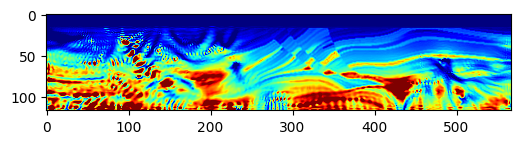

Epoch: 961 Loss:  5536.00439453125 model_loss:  539280.7
Epoch: 962 Loss:  5544.17822265625 model_loss:  539640.4
Epoch: 963 Loss:  5575.94921875 model_loss:  539701.9
Epoch: 964 Loss:  5585.65087890625 model_loss:  540137.8
Epoch: 965 Loss:  5574.36669921875 model_loss:  540207.44
Epoch: 966 Loss:  5588.504150390625 model_loss:  540553.94
Epoch: 967 Loss:  5575.57177734375 model_loss:  540695.56
Epoch: 968 Loss:  5578.5029296875 model_loss:  541045.7
Epoch: 969 Loss:  5580.096435546875 model_loss:  541116.06
Epoch: 970 Loss:  5576.70947265625 model_loss:  541501.9


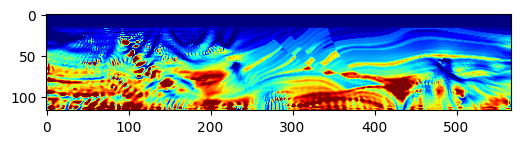

Epoch: 971 Loss:  5563.468017578125 model_loss:  541609.56
Epoch: 972 Loss:  5568.376953125 model_loss:  541916.56
Epoch: 973 Loss:  5557.726318359375 model_loss:  542148.2
Epoch: 974 Loss:  5560.341552734375 model_loss:  542388.94
Epoch: 975 Loss:  5560.193115234375 model_loss:  542614.5
Epoch: 976 Loss:  5559.1416015625 model_loss:  542889.06
Epoch: 977 Loss:  5556.3291015625 model_loss:  543135.0
Epoch: 978 Loss:  5566.115966796875 model_loss:  543343.4
Epoch: 979 Loss:  5559.427734375 model_loss:  543666.8
Epoch: 980 Loss:  5558.236328125 model_loss:  543844.6


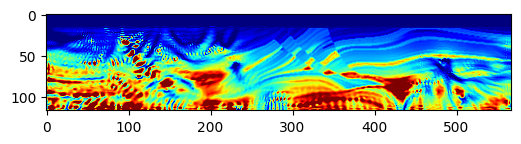

Epoch: 981 Loss:  5569.954345703125 model_loss:  544140.06
Epoch: 982 Loss:  5558.837646484375 model_loss:  544331.06
Epoch: 983 Loss:  5564.733642578125 model_loss:  544681.0
Epoch: 984 Loss:  5566.744140625 model_loss:  544778.4
Epoch: 985 Loss:  5562.83203125 model_loss:  545155.9
Epoch: 986 Loss:  5556.0712890625 model_loss:  545314.8
Epoch: 987 Loss:  5568.05517578125 model_loss:  545590.25
Epoch: 988 Loss:  5556.2275390625 model_loss:  545805.25
Epoch: 989 Loss:  5562.498291015625 model_loss:  546105.4
Epoch: 990 Loss:  5561.1103515625 model_loss:  546275.0


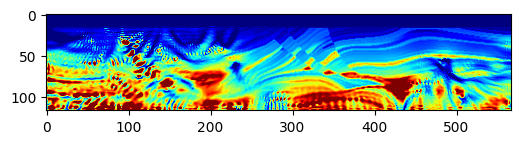

Epoch: 991 Loss:  5557.10546875 model_loss:  546560.75
Epoch: 992 Loss:  5560.14013671875 model_loss:  546840.8
Epoch: 993 Loss:  5563.68017578125 model_loss:  547010.8
Epoch: 994 Loss:  5562.1044921875 model_loss:  547356.0
Epoch: 995 Loss:  5563.0 model_loss:  547524.94
Epoch: 996 Loss:  5572.541015625 model_loss:  547847.3
Epoch: 997 Loss:  5561.629150390625 model_loss:  547986.25
Epoch: 998 Loss:  5568.9833984375 model_loss:  548384.6
Epoch: 999 Loss:  5564.99609375 model_loss:  548455.75
Epoch: 1000 Loss:  5566.260986328125 model_loss:  548841.06


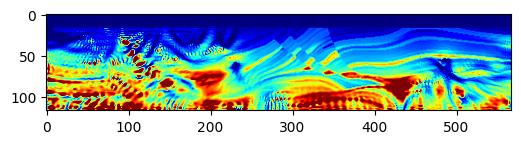

Epoch: 1001 Loss:  5557.605712890625 model_loss:  548989.94
Epoch: 1002 Loss:  5566.890380859375 model_loss:  549289.5
Epoch: 1003 Loss:  5557.95751953125 model_loss:  549480.75
Epoch: 1004 Loss:  5562.727783203125 model_loss:  549766.8
Epoch: 1005 Loss:  5554.650146484375 model_loss:  549973.1
Epoch: 1006 Loss:  5557.441650390625 model_loss:  550222.8
Epoch: 1007 Loss:  5555.3193359375 model_loss:  550528.5
Epoch: 1008 Loss:  5554.78955078125 model_loss:  550692.6
Epoch: 1009 Loss:  5562.7451171875 model_loss:  551035.5
Epoch: 1010 Loss:  5558.0478515625 model_loss:  551198.7


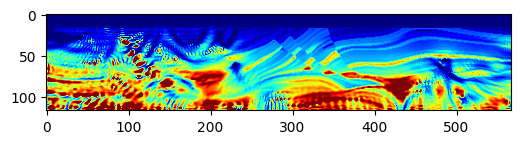

Epoch: 1011 Loss:  5566.495849609375 model_loss:  551563.8
Epoch: 1012 Loss:  5564.68994140625 model_loss:  551656.4
Epoch: 1013 Loss:  5566.192138671875 model_loss:  552088.4
Epoch: 1014 Loss:  5555.467529296875 model_loss:  552159.75
Epoch: 1015 Loss:  5566.50048828125 model_loss:  552530.5
Epoch: 1016 Loss:  5553.701904296875 model_loss:  552671.9
Epoch: 1017 Loss:  5560.062255859375 model_loss:  553004.8
Epoch: 1018 Loss:  5557.940673828125 model_loss:  553145.56
Epoch: 1019 Loss:  5557.3505859375 model_loss:  553467.2
Epoch: 1020 Loss:  5554.964599609375 model_loss:  553685.56


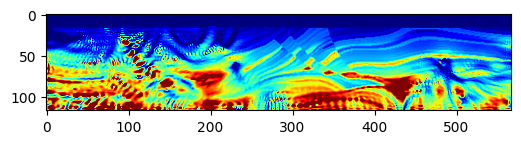

Epoch: 1021 Loss:  5566.038330078125 model_loss:  553908.1
Epoch: 1022 Loss:  5558.720458984375 model_loss:  554235.06
Epoch: 1023 Loss:  5565.467529296875 model_loss:  554407.8
Epoch: 1024 Loss:  5576.073974609375 model_loss:  554739.25
Epoch: 1025 Loss:  5560.737060546875 model_loss:  554878.06
Epoch: 1026 Loss:  5569.13671875 model_loss:  555302.44
Epoch: 1027 Loss:  5568.37255859375 model_loss:  555334.8
Epoch: 1028 Loss:  5565.70361328125 model_loss:  555785.1
Epoch: 1029 Loss:  5556.5546875 model_loss:  555878.2
Epoch: 1030 Loss:  5570.860595703125 model_loss:  556213.8


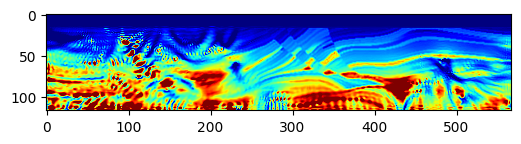

Epoch: 1031 Loss:  5554.383544921875 model_loss:  556384.0
Epoch: 1032 Loss:  5561.826171875 model_loss:  556703.7
Epoch: 1033 Loss:  5556.884521484375 model_loss:  556859.06
Epoch: 1034 Loss:  5552.26806640625 model_loss:  557164.1
Epoch: 1035 Loss:  5553.058349609375 model_loss:  557427.0
Epoch: 1036 Loss:  5559.0087890625 model_loss:  557618.0
Epoch: 1037 Loss:  5554.8037109375 model_loss:  557957.9
Epoch: 1038 Loss:  5560.98486328125 model_loss:  558133.56
Epoch: 1039 Loss:  5566.12841796875 model_loss:  558463.56
Epoch: 1040 Loss:  5558.1650390625 model_loss:  558603.5


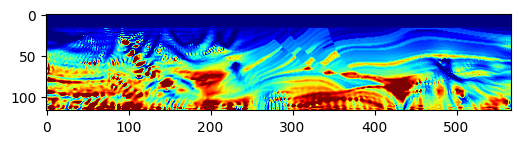

Epoch: 1041 Loss:  5563.12158203125 model_loss:  559028.56
Epoch: 1042 Loss:  5556.572998046875 model_loss:  559083.1
Epoch: 1043 Loss:  5558.43212890625 model_loss:  559490.2
Epoch: 1044 Loss:  5552.513427734375 model_loss:  559620.25
Epoch: 1045 Loss:  5558.171630859375 model_loss:  559940.94
Epoch: 1046 Loss:  5556.09814453125 model_loss:  560103.3
Epoch: 1047 Loss:  5560.21728515625 model_loss:  560438.3
Epoch: 1048 Loss:  5547.08349609375 model_loss:  560605.25
Epoch: 1049 Loss:  5559.20263671875 model_loss:  560874.25
Epoch: 1050 Loss:  5552.136962890625 model_loss:  561174.2


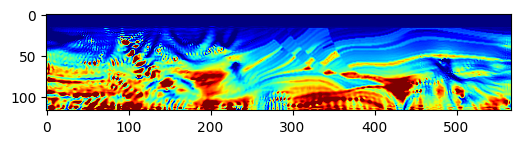

Epoch: 1051 Loss:  5551.03271484375 model_loss:  561351.9
Epoch: 1052 Loss:  5565.572265625 model_loss:  561668.44
Epoch: 1053 Loss:  5553.7744140625 model_loss:  561852.44
Epoch: 1054 Loss:  5560.14013671875 model_loss:  562209.9
Epoch: 1055 Loss:  5560.7763671875 model_loss:  562286.2
Epoch: 1056 Loss:  5558.3486328125 model_loss:  562728.2
Epoch: 1057 Loss:  5549.149658203125 model_loss:  562809.06
Epoch: 1058 Loss:  5564.37060546875 model_loss:  563155.3
Epoch: 1059 Loss:  5548.90087890625 model_loss:  563329.0
Epoch: 1060 Loss:  5557.560791015625 model_loss:  563644.1


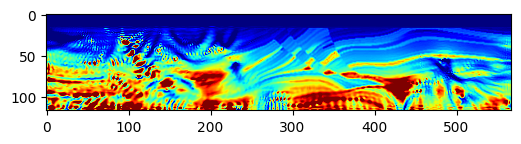

Epoch: 1061 Loss:  5558.6591796875 model_loss:  563786.3
Epoch: 1062 Loss:  5550.4609375 model_loss:  564110.0
Epoch: 1063 Loss:  5545.771240234375 model_loss:  564332.25
Epoch: 1064 Loss:  5557.322021484375 model_loss:  564556.3
Epoch: 1065 Loss:  5547.26806640625 model_loss:  564865.4
Epoch: 1066 Loss:  5556.96826171875 model_loss:  565064.1
Epoch: 1067 Loss:  5560.61669921875 model_loss:  565347.25
Epoch: 1068 Loss:  5550.53125 model_loss:  565537.75
Epoch: 1069 Loss:  5557.036376953125 model_loss:  565929.25
Epoch: 1070 Loss:  5555.627197265625 model_loss:  566002.6


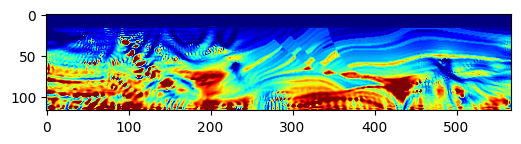

Epoch: 1071 Loss:  5552.37255859375 model_loss:  566410.25
Epoch: 1072 Loss:  5550.781982421875 model_loss:  566530.3
Epoch: 1073 Loss:  5558.9599609375 model_loss:  566860.8
Epoch: 1074 Loss:  5551.343017578125 model_loss:  567009.3
Epoch: 1075 Loss:  5557.568603515625 model_loss:  567378.1
Epoch: 1076 Loss:  5543.518798828125 model_loss:  567496.2
Epoch: 1077 Loss:  5549.27978515625 model_loss:  567826.06
Epoch: 1078 Loss:  5547.096435546875 model_loss:  568060.06
Epoch: 1079 Loss:  5545.173095703125 model_loss:  568283.3
Epoch: 1080 Loss:  5555.322265625 model_loss:  568568.44


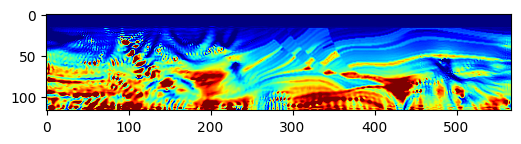

Epoch: 1081 Loss:  5551.642578125 model_loss:  568784.9
Epoch: 1082 Loss:  5551.544677734375 model_loss:  569102.9
Epoch: 1083 Loss:  5551.233642578125 model_loss:  569222.9
Epoch: 1084 Loss:  5550.716796875 model_loss:  569651.7
Epoch: 1085 Loss:  5542.2021484375 model_loss:  569738.06
Epoch: 1086 Loss:  5556.781005859375 model_loss:  570111.06
Epoch: 1087 Loss:  5544.297607421875 model_loss:  570274.7
Epoch: 1088 Loss:  5553.998291015625 model_loss:  570596.5
Epoch: 1089 Loss:  5559.11767578125 model_loss:  570736.56
Epoch: 1090 Loss:  5549.4404296875 model_loss:  571083.9


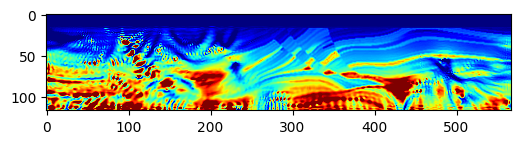

Epoch: 1091 Loss:  5537.937744140625 model_loss:  571272.3
Epoch: 1092 Loss:  5551.75927734375 model_loss:  571534.8
Epoch: 1093 Loss:  5538.8486328125 model_loss:  571816.6
Epoch: 1094 Loss:  5548.510009765625 model_loss:  572042.75
Epoch: 1095 Loss:  5558.929443359375 model_loss:  572297.2
Epoch: 1096 Loss:  5543.408447265625 model_loss:  572543.5
Epoch: 1097 Loss:  5550.3818359375 model_loss:  572886.2
Epoch: 1098 Loss:  5560.557373046875 model_loss:  573008.9
Epoch: 1099 Loss:  5546.81005859375 model_loss:  573407.4
Epoch: 1100 Loss:  5551.2490234375 model_loss:  573545.7


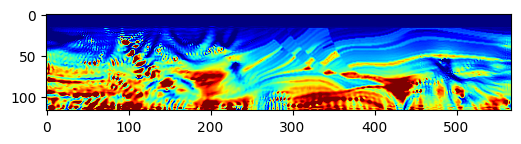

Epoch: 1101 Loss:  5568.76318359375 model_loss:  573862.1
Epoch: 1102 Loss:  5546.808837890625 model_loss:  574037.6
Epoch: 1103 Loss:  5556.899658203125 model_loss:  574421.1
Epoch: 1104 Loss:  5564.24609375 model_loss:  574502.8
Epoch: 1105 Loss:  5547.36474609375 model_loss:  574904.0
Epoch: 1106 Loss:  5547.640625 model_loss:  575071.75
Epoch: 1107 Loss:  5574.787353515625 model_loss:  575326.5
Epoch: 1108 Loss:  5547.9267578125 model_loss:  575621.94
Epoch: 1109 Loss:  5554.3017578125 model_loss:  575840.8
Epoch: 1110 Loss:  5573.59228515625 model_loss:  576092.25


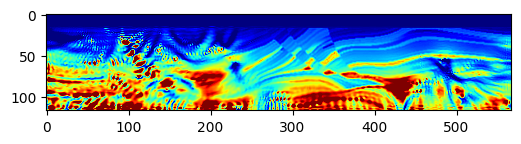

Epoch: 1111 Loss:  5549.34033203125 model_loss:  576348.1
Epoch: 1112 Loss:  5551.338134765625 model_loss:  576670.5
Epoch: 1113 Loss:  5563.856201171875 model_loss:  576755.44
Epoch: 1114 Loss:  5551.573974609375 model_loss:  577221.2
Epoch: 1115 Loss:  5540.2080078125 model_loss:  577293.9
Epoch: 1116 Loss:  5562.12744140625 model_loss:  577653.7
Epoch: 1117 Loss:  5543.308837890625 model_loss:  577857.5
Epoch: 1118 Loss:  5550.309814453125 model_loss:  578164.44
Epoch: 1119 Loss:  5565.90478515625 model_loss:  578287.75
Epoch: 1120 Loss:  5549.960693359375 model_loss:  578693.25


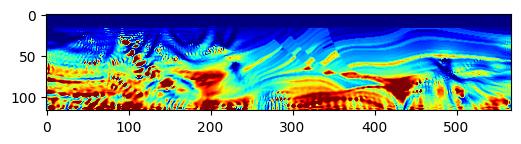

Epoch: 1121 Loss:  5534.114990234375 model_loss:  578827.5
Epoch: 1122 Loss:  5556.15087890625 model_loss:  579119.7
Epoch: 1123 Loss:  5537.504638671875 model_loss:  579408.9
Epoch: 1124 Loss:  5541.2451171875 model_loss:  579647.06
Epoch: 1125 Loss:  5565.2802734375 model_loss:  579862.4
Epoch: 1126 Loss:  5544.9560546875 model_loss:  580194.8
Epoch: 1127 Loss:  5539.447509765625 model_loss:  580439.6
Epoch: 1128 Loss:  5568.759521484375 model_loss:  580635.5
Epoch: 1129 Loss:  5544.86767578125 model_loss:  581009.3
Epoch: 1130 Loss:  5536.60498046875 model_loss:  581168.94


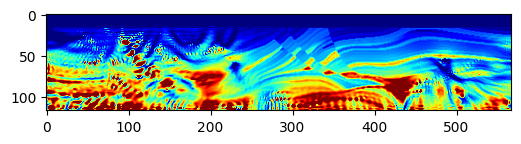

Epoch: 1131 Loss:  5567.740234375 model_loss:  581458.4
Epoch: 1132 Loss:  5547.25 model_loss:  581716.06
Epoch: 1133 Loss:  5543.562744140625 model_loss:  582034.2
Epoch: 1134 Loss:  5565.963623046875 model_loss:  582139.75
Epoch: 1135 Loss:  5549.814697265625 model_loss:  582600.75
Epoch: 1136 Loss:  5532.9453125 model_loss:  582684.4
Epoch: 1137 Loss:  5552.8271484375 model_loss:  583024.7
Epoch: 1138 Loss:  5540.8798828125 model_loss:  583261.75
Epoch: 1139 Loss:  5537.125732421875 model_loss:  583557.9
Epoch: 1140 Loss:  5554.203125 model_loss:  583701.94


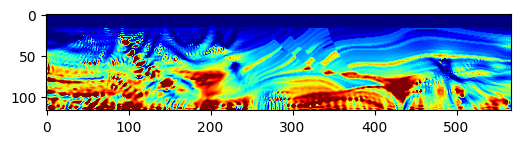

Epoch: 1141 Loss:  5542.2900390625 model_loss:  584125.06
Epoch: 1142 Loss:  5526.634033203125 model_loss:  584242.9
Epoch: 1143 Loss:  5547.699462890625 model_loss:  584571.5
Epoch: 1144 Loss:  5532.25439453125 model_loss:  584846.75
Epoch: 1145 Loss:  5534.50634765625 model_loss:  585100.25
Epoch: 1146 Loss:  5556.606689453125 model_loss:  585305.25
Epoch: 1147 Loss:  5537.90185546875 model_loss:  585654.9
Epoch: 1148 Loss:  5528.6689453125 model_loss:  585874.0
Epoch: 1149 Loss:  5555.98046875 model_loss:  586108.75
Epoch: 1150 Loss:  5535.59765625 model_loss:  586459.25


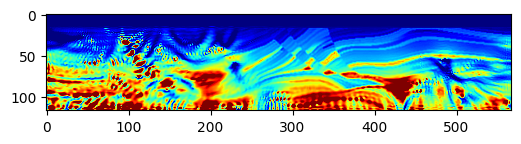

Epoch: 1151 Loss:  5531.476806640625 model_loss:  586655.44
Epoch: 1152 Loss:  5561.683837890625 model_loss:  586917.25
Epoch: 1153 Loss:  5540.0458984375 model_loss:  587199.2
Epoch: 1154 Loss:  5536.46142578125 model_loss:  587514.75
Epoch: 1155 Loss:  5560.9404296875 model_loss:  587640.1
Epoch: 1156 Loss:  5543.193359375 model_loss:  588087.1
Epoch: 1157 Loss:  5527.552001953125 model_loss:  588192.2
Epoch: 1158 Loss:  5548.73681640625 model_loss:  588529.0
Epoch: 1159 Loss:  5536.6279296875 model_loss:  588760.75
Epoch: 1160 Loss:  5532.068115234375 model_loss:  589077.1


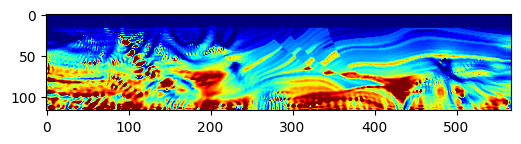

Epoch: 1161 Loss:  5549.226806640625 model_loss:  589206.4
Epoch: 1162 Loss:  5537.74462890625 model_loss:  589643.4
Epoch: 1163 Loss:  5522.02099609375 model_loss:  589755.94
Epoch: 1164 Loss:  5542.861328125 model_loss:  590096.9
Epoch: 1165 Loss:  5528.779541015625 model_loss:  590368.3
Epoch: 1166 Loss:  5527.3994140625 model_loss:  590628.06
Epoch: 1167 Loss:  5549.58056640625 model_loss:  590844.25
Epoch: 1168 Loss:  5533.0458984375 model_loss:  591187.8
Epoch: 1169 Loss:  5525.627685546875 model_loss:  591422.6
Epoch: 1170 Loss:  5551.60888671875 model_loss:  591643.25


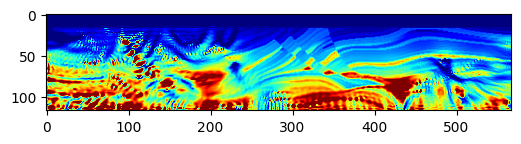

Epoch: 1171 Loss:  5533.08935546875 model_loss:  592025.0
Epoch: 1172 Loss:  5526.1611328125 model_loss:  592183.0
Epoch: 1173 Loss:  5551.85693359375 model_loss:  592500.3
Epoch: 1174 Loss:  5533.993896484375 model_loss:  592725.8
Epoch: 1175 Loss:  5535.64599609375 model_loss:  593093.9
Epoch: 1176 Loss:  5550.2255859375 model_loss:  593165.8
Epoch: 1177 Loss:  5538.990478515625 model_loss:  593658.25
Epoch: 1178 Loss:  5524.658203125 model_loss:  593724.7
Epoch: 1179 Loss:  5539.827392578125 model_loss:  594105.8
Epoch: 1180 Loss:  5527.489990234375 model_loss:  594300.75


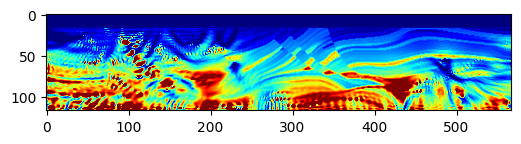

Epoch: 1181 Loss:  5528.87060546875 model_loss:  594635.7
Epoch: 1182 Loss:  5541.048095703125 model_loss:  594772.6
Epoch: 1183 Loss:  5531.633544921875 model_loss:  595182.8
Epoch: 1184 Loss:  5517.40869140625 model_loss:  595336.75
Epoch: 1185 Loss:  5537.6015625 model_loss:  595647.06
Epoch: 1186 Loss:  5523.1220703125 model_loss:  595956.3
Epoch: 1187 Loss:  5524.538330078125 model_loss:  596174.1
Epoch: 1188 Loss:  5545.4775390625 model_loss:  596446.94
Epoch: 1189 Loss:  5527.59814453125 model_loss:  596716.75
Epoch: 1190 Loss:  5531.0048828125 model_loss:  597056.56


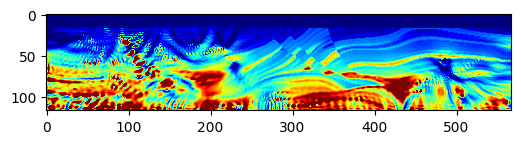

Epoch: 1191 Loss:  5546.7900390625 model_loss:  597165.3
Epoch: 1192 Loss:  5533.12744140625 model_loss:  597646.7
Epoch: 1193 Loss:  5523.94189453125 model_loss:  597720.4
Epoch: 1194 Loss:  5544.433349609375 model_loss:  598118.6
Epoch: 1195 Loss:  5528.152587890625 model_loss:  598268.75
Epoch: 1196 Loss:  5534.3896484375 model_loss:  598670.5
Epoch: 1197 Loss:  5542.3212890625 model_loss:  598731.94
Epoch: 1198 Loss:  5534.6083984375 model_loss:  599204.44
Epoch: 1199 Loss:  5518.875244140625 model_loss:  599294.0
Epoch: 1200 Loss:  5530.89501953125 model_loss:  599653.2


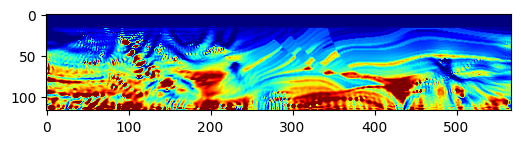

Epoch: 1201 Loss:  5517.732177734375 model_loss:  599888.3
Epoch: 1202 Loss:  5520.4404296875 model_loss:  600176.75
Epoch: 1203 Loss:  5533.10009765625 model_loss:  600390.2
Epoch: 1204 Loss:  5522.838134765625 model_loss:  600721.8
Epoch: 1205 Loss:  5520.185302734375 model_loss:  600986.94
Epoch: 1206 Loss:  5539.681396484375 model_loss:  601197.9
Epoch: 1207 Loss:  5524.35302734375 model_loss:  601599.4
Epoch: 1208 Loss:  5525.823486328125 model_loss:  601735.06
Epoch: 1209 Loss:  5546.218994140625 model_loss:  602098.94
Epoch: 1210 Loss:  5526.627197265625 model_loss:  602259.9


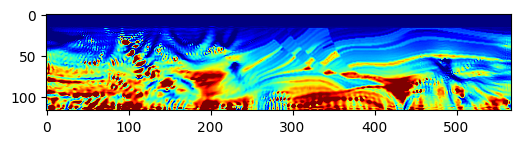

Epoch: 1211 Loss:  5537.281005859375 model_loss:  602700.06
Epoch: 1212 Loss:  5541.65576171875 model_loss:  602710.1
Epoch: 1213 Loss:  5537.010986328125 model_loss:  603227.5
Epoch: 1214 Loss:  5522.86962890625 model_loss:  603272.06
Epoch: 1215 Loss:  5533.0595703125 model_loss:  603671.25
Epoch: 1216 Loss:  5518.51611328125 model_loss:  603821.1
Epoch: 1217 Loss:  5522.862060546875 model_loss:  604186.44
Epoch: 1218 Loss:  5527.1162109375 model_loss:  604318.5
Epoch: 1219 Loss:  5522.34326171875 model_loss:  604712.0
Epoch: 1220 Loss:  5513.044189453125 model_loss:  604899.6


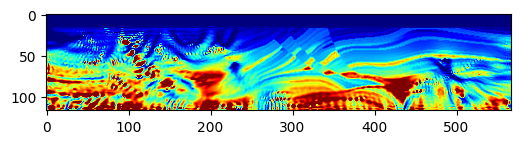

Epoch: 1221 Loss:  5530.580810546875 model_loss:  605185.5
Epoch: 1222 Loss:  5517.334716796875 model_loss:  605520.75
Epoch: 1223 Loss:  5524.48974609375 model_loss:  605704.7
Epoch: 1224 Loss:  5538.138671875 model_loss:  606031.9
Epoch: 1225 Loss:  5520.677734375 model_loss:  606226.44
Epoch: 1226 Loss:  5530.6533203125 model_loss:  606643.2
Epoch: 1227 Loss:  5533.3740234375 model_loss:  606676.4
Epoch: 1228 Loss:  5528.930419921875 model_loss:  607193.06
Epoch: 1229 Loss:  5519.084716796875 model_loss:  607240.0
Epoch: 1230 Loss:  5533.39501953125 model_loss:  607650.75


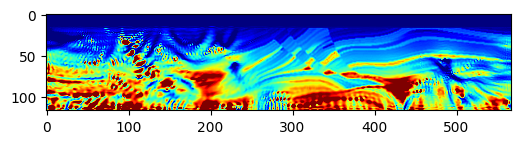

Epoch: 1231 Loss:  5516.6728515625 model_loss:  607778.4
Epoch: 1232 Loss:  5523.218994140625 model_loss:  608171.5
Epoch: 1233 Loss:  5523.52490234375 model_loss:  608275.7
Epoch: 1234 Loss:  5518.627197265625 model_loss:  608681.3
Epoch: 1235 Loss:  5513.484619140625 model_loss:  608864.2
Epoch: 1236 Loss:  5528.154052734375 model_loss:  609133.4
Epoch: 1237 Loss:  5515.87744140625 model_loss:  609464.9
Epoch: 1238 Loss:  5527.129150390625 model_loss:  609656.0
Epoch: 1239 Loss:  5536.06591796875 model_loss:  609987.06
Epoch: 1240 Loss:  5518.712890625 model_loss:  610159.2


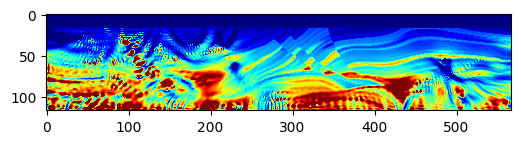

Epoch: 1241 Loss:  5527.894775390625 model_loss:  610596.8
Epoch: 1242 Loss:  5528.4755859375 model_loss:  610622.06
Epoch: 1243 Loss:  5523.83837890625 model_loss:  611132.7
Epoch: 1244 Loss:  5516.056396484375 model_loss:  611189.7
Epoch: 1245 Loss:  5530.203125 model_loss:  611590.2
Epoch: 1246 Loss:  5513.625 model_loss:  611723.9
Epoch: 1247 Loss:  5520.61572265625 model_loss:  612106.94
Epoch: 1248 Loss:  5515.815185546875 model_loss:  612226.06
Epoch: 1249 Loss:  5511.5341796875 model_loss:  612606.06
Epoch: 1250 Loss:  5514.062255859375 model_loss:  612832.5


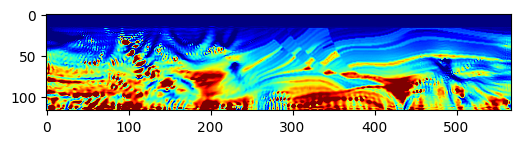

Epoch: 1251 Loss:  5520.716796875 model_loss:  613053.6
Epoch: 1252 Loss:  5515.73095703125 model_loss:  613415.8
Epoch: 1253 Loss:  5525.60791015625 model_loss:  613580.1
Epoch: 1254 Loss:  5531.45458984375 model_loss:  613948.44
Epoch: 1255 Loss:  5517.016845703125 model_loss:  614068.8
Epoch: 1256 Loss:  5525.189208984375 model_loss:  614534.75
Epoch: 1257 Loss:  5522.435302734375 model_loss:  614555.7
Epoch: 1258 Loss:  5518.91455078125 model_loss:  615042.5
Epoch: 1259 Loss:  5513.398193359375 model_loss:  615131.5
Epoch: 1260 Loss:  5522.809326171875 model_loss:  615496.44


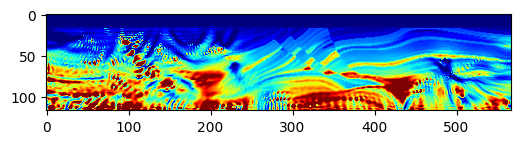

Epoch: 1261 Loss:  5510.9580078125 model_loss:  615673.9
Epoch: 1262 Loss:  5519.25048828125 model_loss:  616020.6
Epoch: 1263 Loss:  5508.7197265625 model_loss:  616200.0
Epoch: 1264 Loss:  5509.541015625 model_loss:  616514.7
Epoch: 1265 Loss:  5511.24169921875 model_loss:  616823.4
Epoch: 1266 Loss:  5519.887939453125 model_loss:  616988.7
Epoch: 1267 Loss:  5539.5029296875 model_loss:  617373.3
Epoch: 1268 Loss:  5534.615234375 model_loss:  617520.1
Epoch: 1269 Loss:  5541.290283203125 model_loss:  617917.6
Epoch: 1270 Loss:  5535.48828125 model_loss:  617995.4


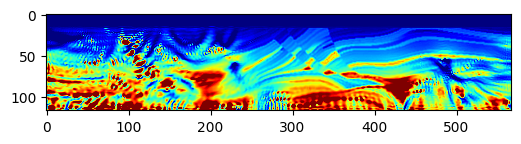

Epoch: 1271 Loss:  5538.38232421875 model_loss:  618464.44
Epoch: 1272 Loss:  5528.86474609375 model_loss:  618525.94
Epoch: 1273 Loss:  5535.354248046875 model_loss:  618932.56
Epoch: 1274 Loss:  5526.137939453125 model_loss:  619079.2
Epoch: 1275 Loss:  5529.716552734375 model_loss:  619426.25
Epoch: 1276 Loss:  5528.28271484375 model_loss:  619607.44
Epoch: 1277 Loss:  5527.983642578125 model_loss:  619931.25
Epoch: 1278 Loss:  5527.453369140625 model_loss:  620197.3
Epoch: 1279 Loss:  5534.491455078125 model_loss:  620407.5
Epoch: 1280 Loss:  5531.473876953125 model_loss:  620788.1


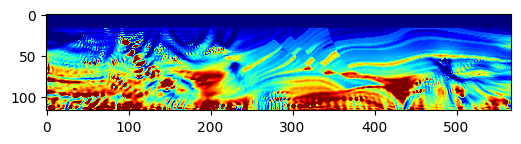

Epoch: 1281 Loss:  5533.380859375 model_loss:  620921.6
Epoch: 1282 Loss:  5544.86865234375 model_loss:  621314.0
Epoch: 1283 Loss:  5532.52685546875 model_loss:  621435.94
Epoch: 1284 Loss:  5540.936279296875 model_loss:  621886.75
Epoch: 1285 Loss:  5536.41796875 model_loss:  621921.44
Epoch: 1286 Loss:  5536.2001953125 model_loss:  622403.56
Epoch: 1287 Loss:  5526.576416015625 model_loss:  622490.0
Epoch: 1288 Loss:  5536.453369140625 model_loss:  622865.25
Epoch: 1289 Loss:  5524.38330078125 model_loss:  623043.75
Epoch: 1290 Loss:  5530.45703125 model_loss:  623381.3


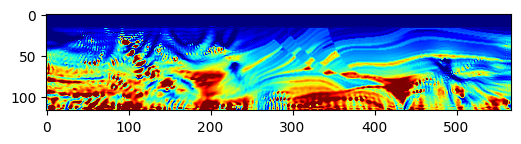

Epoch: 1291 Loss:  5525.392333984375 model_loss:  623578.4
Epoch: 1292 Loss:  5524.32763671875 model_loss:  623887.8
Epoch: 1293 Loss:  5527.810791015625 model_loss:  624199.6
Epoch: 1294 Loss:  5526.928466796875 model_loss:  624372.06
Epoch: 1295 Loss:  5532.99951171875 model_loss:  624773.25
Epoch: 1296 Loss:  5530.88916015625 model_loss:  624916.4
Epoch: 1297 Loss:  5539.026611328125 model_loss:  625322.25
Epoch: 1298 Loss:  5532.19775390625 model_loss:  625407.7
Epoch: 1299 Loss:  5535.80517578125 model_loss:  625890.0
Epoch: 1300 Loss:  5525.166259765625 model_loss:  625946.5


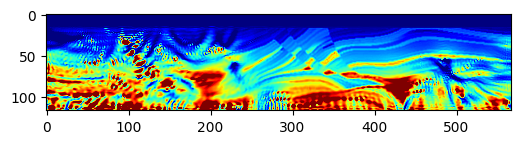

Epoch: 1301 Loss:  5531.30859375 model_loss:  626376.9
Epoch: 1302 Loss:  5522.15185546875 model_loss:  626526.3
Epoch: 1303 Loss:  5525.39404296875 model_loss:  626866.1
Epoch: 1304 Loss:  5526.231201171875 model_loss:  627058.4
Epoch: 1305 Loss:  5525.84423828125 model_loss:  627395.6
Epoch: 1306 Loss:  5524.22119140625 model_loss:  627656.9
Epoch: 1307 Loss:  5534.21484375 model_loss:  627870.4
Epoch: 1308 Loss:  5528.85595703125 model_loss:  628276.0
Epoch: 1309 Loss:  5531.473388671875 model_loss:  628401.06
Epoch: 1310 Loss:  5545.21435546875 model_loss:  628800.7


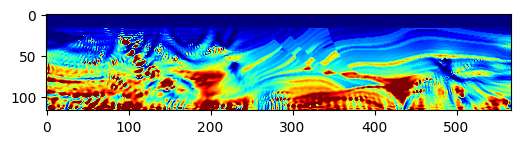

Epoch: 1311 Loss:  5529.977783203125 model_loss:  628934.94
Epoch: 1312 Loss:  5539.533447265625 model_loss:  629390.6
Epoch: 1313 Loss:  5535.94482421875 model_loss:  629410.75
Epoch: 1314 Loss:  5533.71337890625 model_loss:  629925.2
Epoch: 1315 Loss:  5523.62744140625 model_loss:  630002.25
Epoch: 1316 Loss:  5535.9794921875 model_loss:  630377.0
Epoch: 1317 Loss:  5521.488037109375 model_loss:  630565.0
Epoch: 1318 Loss:  5529.59521484375 model_loss:  630910.56
Epoch: 1319 Loss:  5524.447998046875 model_loss:  631092.6
Epoch: 1320 Loss:  5520.6845703125 model_loss:  631427.25


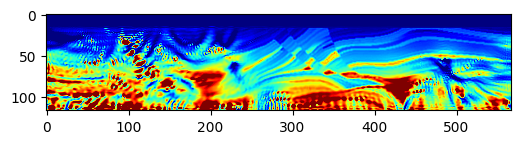

Epoch: 1321 Loss:  5526.17529296875 model_loss:  631735.3
Epoch: 1322 Loss:  5524.93994140625 model_loss:  631905.1
Epoch: 1323 Loss:  5529.183837890625 model_loss:  632318.7
Epoch: 1324 Loss:  5530.3955078125 model_loss:  632467.75
Epoch: 1325 Loss:  5536.199951171875 model_loss:  632861.56
Epoch: 1326 Loss:  5529.949951171875 model_loss:  632957.8
Epoch: 1327 Loss:  5533.072509765625 model_loss:  633449.06
Epoch: 1328 Loss:  5521.393798828125 model_loss:  633498.25
Epoch: 1329 Loss:  5527.221435546875 model_loss:  633939.3
Epoch: 1330 Loss:  5520.172119140625 model_loss:  634099.1


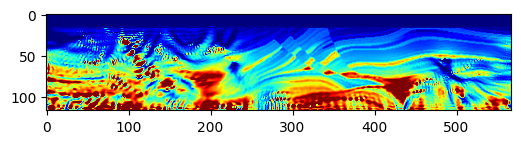

Epoch: 1331 Loss:  5521.287109375 model_loss:  634424.5
Epoch: 1332 Loss:  5528.480712890625 model_loss:  634626.44
Epoch: 1333 Loss:  5526.403076171875 model_loss:  634981.2
Epoch: 1334 Loss:  5520.6669921875 model_loss:  635231.5
Epoch: 1335 Loss:  5535.798095703125 model_loss:  635452.7
Epoch: 1336 Loss:  5525.365234375 model_loss:  635872.75
Epoch: 1337 Loss:  5526.7822265625 model_loss:  635993.8
Epoch: 1338 Loss:  5543.97314453125 model_loss:  636385.94
Epoch: 1339 Loss:  5526.230712890625 model_loss:  636556.1
Epoch: 1340 Loss:  5537.061767578125 model_loss:  636995.0


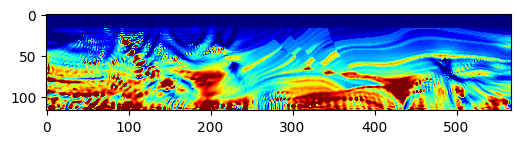

Epoch: 1341 Loss:  5538.354736328125 model_loss:  637018.6
Epoch: 1342 Loss:  5531.9208984375 model_loss:  637556.5
Epoch: 1343 Loss:  5520.487548828125 model_loss:  637623.4
Epoch: 1344 Loss:  5538.68603515625 model_loss:  638008.0
Epoch: 1345 Loss:  5519.811279296875 model_loss:  638209.0
Epoch: 1346 Loss:  5528.192626953125 model_loss:  638563.4
Epoch: 1347 Loss:  5533.6298828125 model_loss:  638720.7
Epoch: 1348 Loss:  5520.86083984375 model_loss:  639120.9
Epoch: 1349 Loss:  5528.181396484375 model_loss:  639382.3
Epoch: 1350 Loss:  5541.79443359375 model_loss:  639583.9


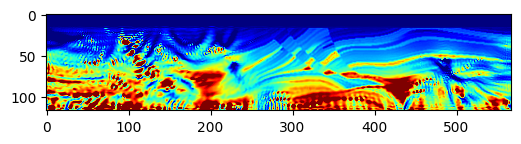

Epoch: 1351 Loss:  5525.2919921875 model_loss:  640011.7
Epoch: 1352 Loss:  5534.058349609375 model_loss:  640155.7
Epoch: 1353 Loss:  5548.768798828125 model_loss:  640537.5
Epoch: 1354 Loss:  5527.025390625 model_loss:  640700.4
Epoch: 1355 Loss:  5538.355224609375 model_loss:  641162.3
Epoch: 1356 Loss:  5544.41455078125 model_loss:  641184.0
Epoch: 1357 Loss:  5532.91064453125 model_loss:  641716.0
Epoch: 1358 Loss:  5520.43798828125 model_loss:  641791.6
Epoch: 1359 Loss:  5543.76416015625 model_loss:  642178.6
Epoch: 1360 Loss:  5521.474609375 model_loss:  642386.06


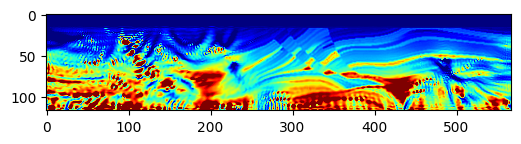

Epoch: 1361 Loss:  5526.103515625 model_loss:  642740.5
Epoch: 1362 Loss:  5542.0771484375 model_loss:  642896.7
Epoch: 1363 Loss:  5525.704345703125 model_loss:  643329.4
Epoch: 1364 Loss:  5523.970947265625 model_loss:  643547.2
Epoch: 1365 Loss:  5550.07421875 model_loss:  643792.75
Epoch: 1366 Loss:  5526.123291015625 model_loss:  644194.3
Epoch: 1367 Loss:  5526.33447265625 model_loss:  644360.4
Epoch: 1368 Loss:  5555.03369140625 model_loss:  644714.44
Epoch: 1369 Loss:  5532.54736328125 model_loss:  644956.5
Epoch: 1370 Loss:  5532.49072265625 model_loss:  645332.75


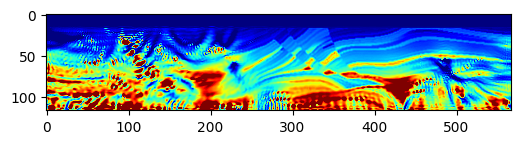

Epoch: 1371 Loss:  5553.244384765625 model_loss:  645423.2
Epoch: 1372 Loss:  5537.505615234375 model_loss:  645942.7
Epoch: 1373 Loss:  5519.700439453125 model_loss:  646012.2
Epoch: 1374 Loss:  5540.361572265625 model_loss:  646401.2
Epoch: 1375 Loss:  5530.0966796875 model_loss:  646641.56
Epoch: 1376 Loss:  5518.4658203125 model_loss:  646965.44
Epoch: 1377 Loss:  5533.443115234375 model_loss:  647133.2
Epoch: 1378 Loss:  5525.97412109375 model_loss:  647593.5
Epoch: 1379 Loss:  5510.4072265625 model_loss:  647728.9
Epoch: 1380 Loss:  5532.14794921875 model_loss:  648068.25


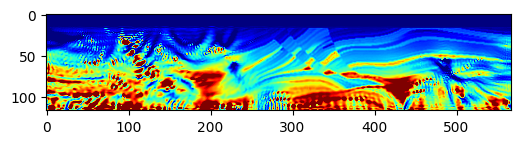

Epoch: 1381 Loss:  5518.105224609375 model_loss:  648393.5
Epoch: 1382 Loss:  5512.404296875 model_loss:  648625.0
Epoch: 1383 Loss:  5534.2841796875 model_loss:  648917.0
Epoch: 1384 Loss:  5519.36083984375 model_loss:  649241.5
Epoch: 1385 Loss:  5519.842041015625 model_loss:  649538.3
Epoch: 1386 Loss:  5540.379638671875 model_loss:  649730.25
Epoch: 1387 Loss:  5523.216796875 model_loss:  650169.56
Epoch: 1388 Loss:  5514.58203125 model_loss:  650328.0
Epoch: 1389 Loss:  5540.05029296875 model_loss:  650675.75
Epoch: 1390 Loss:  5522.982421875 model_loss:  650934.06


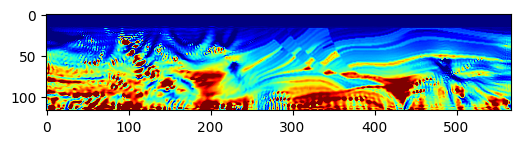

Epoch: 1391 Loss:  5523.56982421875 model_loss:  651285.94
Epoch: 1392 Loss:  5540.79931640625 model_loss:  651420.5
Epoch: 1393 Loss:  5528.072021484375 model_loss:  651895.56
Epoch: 1394 Loss:  5513.159423828125 model_loss:  652032.7
Epoch: 1395 Loss:  5529.94873046875 model_loss:  652383.94
Epoch: 1396 Loss:  5517.944091796875 model_loss:  652649.94
Epoch: 1397 Loss:  5518.781982421875 model_loss:  652963.6
Epoch: 1398 Loss:  5532.521240234375 model_loss:  653140.56
Epoch: 1399 Loss:  5523.040283203125 model_loss:  653574.4
Epoch: 1400 Loss:  5509.541748046875 model_loss:  653737.56


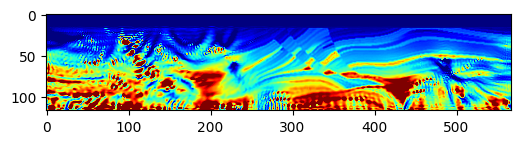

Epoch: 1401 Loss:  5525.59814453125 model_loss:  654089.8
Epoch: 1402 Loss:  5512.740234375 model_loss:  654375.75
Epoch: 1403 Loss:  5516.22509765625 model_loss:  654666.56
Epoch: 1404 Loss:  5532.404541015625 model_loss:  654885.94
Epoch: 1405 Loss:  5518.63916015625 model_loss:  655272.06
Epoch: 1406 Loss:  5509.369384765625 model_loss:  655499.56
Epoch: 1407 Loss:  5530.807861328125 model_loss:  655786.3
Epoch: 1408 Loss:  5514.169921875 model_loss:  656132.56
Epoch: 1409 Loss:  5516.12841796875 model_loss:  656380.8
Epoch: 1410 Loss:  5541.20751953125 model_loss:  656630.44


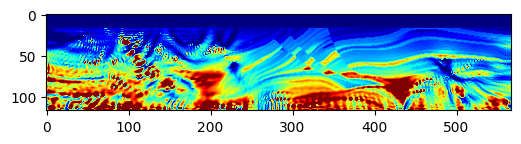

Epoch: 1411 Loss:  5520.96142578125 model_loss:  656981.4
Epoch: 1412 Loss:  5514.890869140625 model_loss:  657258.94
Epoch: 1413 Loss:  5541.720703125 model_loss:  657475.2
Epoch: 1414 Loss:  5522.96533203125 model_loss:  657888.9
Epoch: 1415 Loss:  5512.208740234375 model_loss:  658071.5
Epoch: 1416 Loss:  5539.770263671875 model_loss:  658370.75
Epoch: 1417 Loss:  5525.054931640625 model_loss:  658684.8
Epoch: 1418 Loss:  5512.242431640625 model_loss:  658969.6
Epoch: 1419 Loss:  5534.603515625 model_loss:  659169.7
Epoch: 1420 Loss:  5523.311279296875 model_loss:  659606.25


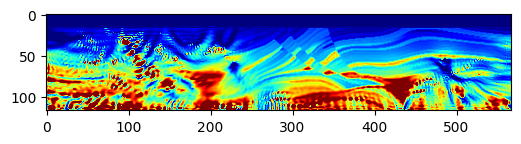

Epoch: 1421 Loss:  5507.56640625 model_loss:  659757.75
Epoch: 1422 Loss:  5527.700927734375 model_loss:  660086.3
Epoch: 1423 Loss:  5518.3369140625 model_loss:  660403.44
Epoch: 1424 Loss:  5506.130126953125 model_loss:  660650.2
Epoch: 1425 Loss:  5524.34765625 model_loss:  660921.75
Epoch: 1426 Loss:  5516.2763671875 model_loss:  661280.25
Epoch: 1427 Loss:  5508.74267578125 model_loss:  661515.94
Epoch: 1428 Loss:  5527.558837890625 model_loss:  661774.7
Epoch: 1429 Loss:  5516.03955078125 model_loss:  662159.8
Epoch: 1430 Loss:  5507.32373046875 model_loss:  662344.1


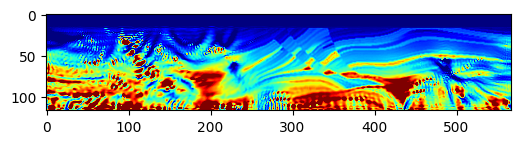

Epoch: 1431 Loss:  5526.01953125 model_loss:  662696.3
Epoch: 1432 Loss:  5513.758056640625 model_loss:  662951.56
Epoch: 1433 Loss:  5516.529541015625 model_loss:  663300.56
Epoch: 1434 Loss:  5526.412841796875 model_loss:  663440.6
Epoch: 1435 Loss:  5518.860595703125 model_loss:  663911.5
Epoch: 1436 Loss:  5506.73291015625 model_loss:  664038.1
Epoch: 1437 Loss:  5519.19189453125 model_loss:  664422.06
Epoch: 1438 Loss:  5508.2646484375 model_loss:  664647.2
Epoch: 1439 Loss:  5512.265625 model_loss:  664993.2
Epoch: 1440 Loss:  5521.699462890625 model_loss:  665163.4


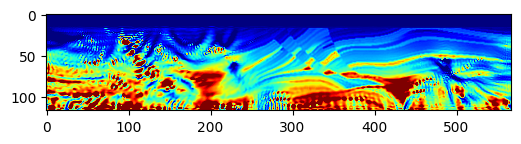

Epoch: 1441 Loss:  5513.17626953125 model_loss:  665582.56
Epoch: 1442 Loss:  5501.548828125 model_loss:  665781.3
Epoch: 1443 Loss:  5517.34228515625 model_loss:  666093.2
Epoch: 1444 Loss:  5505.335693359375 model_loss:  666422.56
Epoch: 1445 Loss:  5509.0693359375 model_loss:  666669.94
Epoch: 1446 Loss:  5529.484619140625 model_loss:  666951.25
Epoch: 1447 Loss:  5511.65234375 model_loss:  667254.8
Epoch: 1448 Loss:  5513.21337890625 model_loss:  667597.06
Epoch: 1449 Loss:  5532.7626953125 model_loss:  667742.06
Epoch: 1450 Loss:  5516.751220703125 model_loss:  668230.1


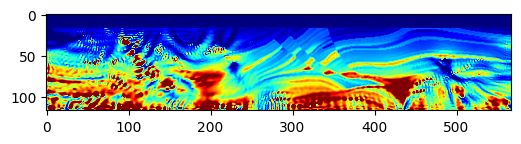

Epoch: 1451 Loss:  5507.975830078125 model_loss:  668337.5
Epoch: 1452 Loss:  5530.60205078125 model_loss:  668731.5
Epoch: 1453 Loss:  5515.56103515625 model_loss:  668924.75
Epoch: 1454 Loss:  5516.919189453125 model_loss:  669330.2
Epoch: 1455 Loss:  5530.185546875 model_loss:  669403.8
Epoch: 1456 Loss:  5520.281005859375 model_loss:  669937.0
Epoch: 1457 Loss:  5504.6474609375 model_loss:  670007.94
Epoch: 1458 Loss:  5518.209716796875 model_loss:  670415.4
Epoch: 1459 Loss:  5508.5888671875 model_loss:  670652.3
Epoch: 1460 Loss:  5505.561279296875 model_loss:  670964.4


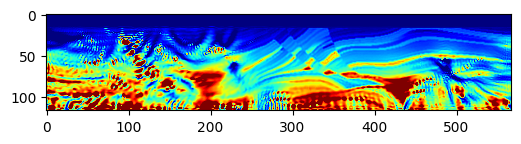

Epoch: 1461 Loss:  5520.969482421875 model_loss:  671181.0
Epoch: 1462 Loss:  5511.61328125 model_loss:  671577.44
Epoch: 1463 Loss:  5502.29296875 model_loss:  671801.2
Epoch: 1464 Loss:  5523.2529296875 model_loss:  672076.1
Epoch: 1465 Loss:  5509.5185546875 model_loss:  672469.44
Epoch: 1466 Loss:  5506.172607421875 model_loss:  672638.1
Epoch: 1467 Loss:  5527.730224609375 model_loss:  673010.44
Epoch: 1468 Loss:  5511.49755859375 model_loss:  673220.25
Epoch: 1469 Loss:  5515.978759765625 model_loss:  673638.94
Epoch: 1470 Loss:  5525.92578125 model_loss:  673693.75


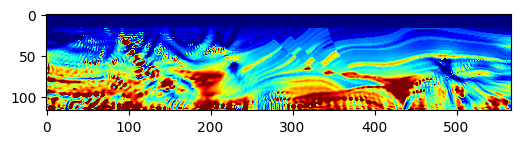

Epoch: 1471 Loss:  5517.801513671875 model_loss:  674244.7
Epoch: 1472 Loss:  5504.696044921875 model_loss:  674296.5
Epoch: 1473 Loss:  5517.552978515625 model_loss:  674730.56
Epoch: 1474 Loss:  5506.866455078125 model_loss:  674901.56
Epoch: 1475 Loss:  5507.34423828125 model_loss:  675286.1
Epoch: 1476 Loss:  5517.123779296875 model_loss:  675425.4
Epoch: 1477 Loss:  5509.637451171875 model_loss:  675875.4
Epoch: 1478 Loss:  5497.611572265625 model_loss:  676046.94
Epoch: 1479 Loss:  5515.708251953125 model_loss:  676368.56
Epoch: 1480 Loss:  5503.542724609375 model_loss:  676714.75


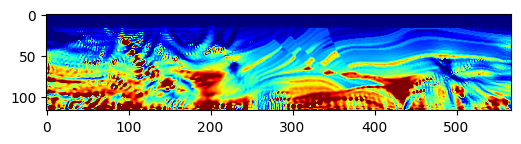

Epoch: 1481 Loss:  5504.68408203125 model_loss:  676923.06
Epoch: 1482 Loss:  5522.03173828125 model_loss:  677263.0
Epoch: 1483 Loss:  5505.94384765625 model_loss:  677495.25
Epoch: 1484 Loss:  5512.764892578125 model_loss:  677905.2
Epoch: 1485 Loss:  5519.9765625 model_loss:  677966.8
Epoch: 1486 Loss:  5512.686279296875 model_loss:  678517.7
Epoch: 1487 Loss:  5502.86962890625 model_loss:  678562.2
Epoch: 1488 Loss:  5518.09326171875 model_loss:  679016.5
Epoch: 1489 Loss:  5504.29833984375 model_loss:  679146.8
Epoch: 1490 Loss:  5508.34130859375 model_loss:  679570.2


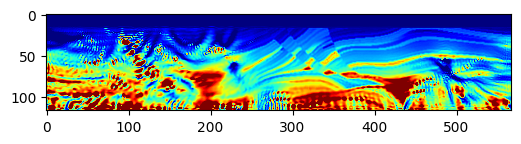

Epoch: 1491 Loss:  5515.09423828125 model_loss:  679668.5
Epoch: 1492 Loss:  5507.166748046875 model_loss:  680139.0
Epoch: 1493 Loss:  5496.10107421875 model_loss:  680291.5
Epoch: 1494 Loss:  5513.189697265625 model_loss:  680613.5
Epoch: 1495 Loss:  5500.17333984375 model_loss:  680946.6
Epoch: 1496 Loss:  5505.04248046875 model_loss:  681163.3
Epoch: 1497 Loss:  5519.64599609375 model_loss:  681499.0
Epoch: 1498 Loss:  5502.790771484375 model_loss:  681723.8
Epoch: 1499 Loss:  5511.16162109375 model_loss:  682144.1
Epoch: 1500 Loss:  5515.442626953125 model_loss:  682197.94


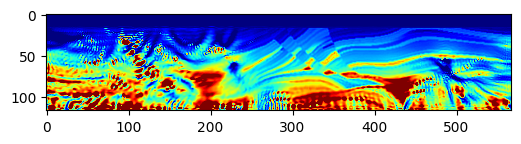

Epoch: 1501 Loss:  5509.105224609375 model_loss:  682749.8
Epoch: 1502 Loss:  5500.630615234375 model_loss:  682792.94
Epoch: 1503 Loss:  5515.66455078125 model_loss:  683250.6
Epoch: 1504 Loss:  5500.6826171875 model_loss:  683372.1
Epoch: 1505 Loss:  5505.65087890625 model_loss:  683801.1
Epoch: 1506 Loss:  5510.80224609375 model_loss:  683902.4
Epoch: 1507 Loss:  5502.8583984375 model_loss:  684361.25
Epoch: 1508 Loss:  5496.104736328125 model_loss:  684535.4
Epoch: 1509 Loss:  5512.89306640625 model_loss:  684829.44
Epoch: 1510 Loss:  5499.47607421875 model_loss:  685196.1


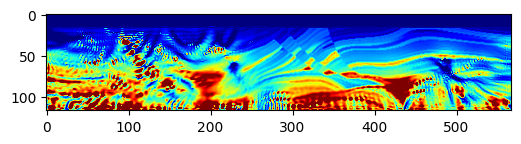

Epoch: 1511 Loss:  5507.52685546875 model_loss:  685383.2
Epoch: 1512 Loss:  5521.8505859375 model_loss:  685764.44
Epoch: 1513 Loss:  5503.090087890625 model_loss:  685940.44
Epoch: 1514 Loss:  5512.392822265625 model_loss:  686414.4
Epoch: 1515 Loss:  5513.487548828125 model_loss:  686428.7
Epoch: 1516 Loss:  5508.3203125 model_loss:  687010.56
Epoch: 1517 Loss:  5497.884033203125 model_loss:  687043.4
Epoch: 1518 Loss:  5511.63818359375 model_loss:  687513.2
Epoch: 1519 Loss:  5496.22314453125 model_loss:  687649.1
Epoch: 1520 Loss:  5500.537353515625 model_loss:  688071.2


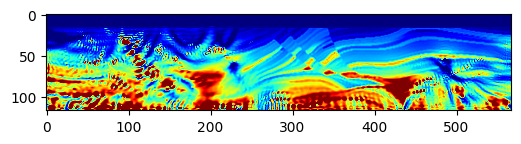

Epoch: 1521 Loss:  5505.941162109375 model_loss:  688213.9
Epoch: 1522 Loss:  5498.0068359375 model_loss:  688658.7
Epoch: 1523 Loss:  5497.043212890625 model_loss:  688883.7
Epoch: 1524 Loss:  5511.25634765625 model_loss:  689148.4
Epoch: 1525 Loss:  5498.5166015625 model_loss:  689573.5
Epoch: 1526 Loss:  5506.70751953125 model_loss:  689729.3
Epoch: 1527 Loss:  5521.039306640625 model_loss:  690166.9
Epoch: 1528 Loss:  5501.9892578125 model_loss:  690308.1
Epoch: 1529 Loss:  5512.396728515625 model_loss:  690824.7
Epoch: 1530 Loss:  5512.650146484375 model_loss:  690828.06


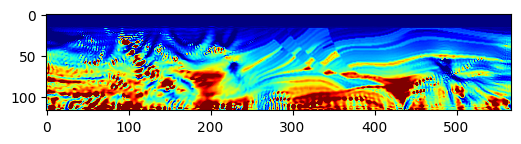

Epoch: 1531 Loss:  5507.166015625 model_loss:  691423.25
Epoch: 1532 Loss:  5494.414306640625 model_loss:  691468.94
Epoch: 1533 Loss:  5507.911865234375 model_loss:  691934.75
Epoch: 1534 Loss:  5491.694580078125 model_loss:  692103.7
Epoch: 1535 Loss:  5495.806396484375 model_loss:  692513.6
Epoch: 1536 Loss:  5502.2333984375 model_loss:  692690.7
Epoch: 1537 Loss:  5493.7890625 model_loss:  693129.44
Epoch: 1538 Loss:  5495.174072265625 model_loss:  693379.9
Epoch: 1539 Loss:  5509.301513671875 model_loss:  693637.4
Epoch: 1540 Loss:  5495.61083984375 model_loss:  694082.06


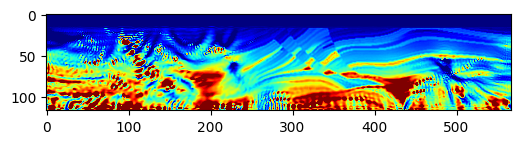

Epoch: 1541 Loss:  5503.376220703125 model_loss:  694232.8
Epoch: 1542 Loss:  5517.5068359375 model_loss:  694676.1
Epoch: 1543 Loss:  5498.1708984375 model_loss:  694819.75
Epoch: 1544 Loss:  5509.042236328125 model_loss:  695334.56
Epoch: 1545 Loss:  5510.69482421875 model_loss:  695344.8
Epoch: 1546 Loss:  5504.042724609375 model_loss:  695931.3
Epoch: 1547 Loss:  5490.86279296875 model_loss:  695988.8
Epoch: 1548 Loss:  5505.30859375 model_loss:  696442.1
Epoch: 1549 Loss:  5488.46142578125 model_loss:  696625.8
Epoch: 1550 Loss:  5492.92919921875 model_loss:  697030.25


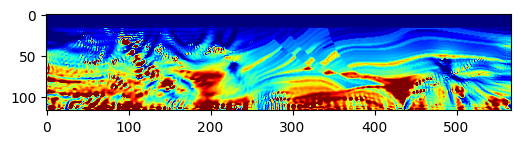

Epoch: 1551 Loss:  5500.708251953125 model_loss:  697204.8
Epoch: 1552 Loss:  5491.08935546875 model_loss:  697650.75
Epoch: 1553 Loss:  5492.56494140625 model_loss:  697888.75
Epoch: 1554 Loss:  5508.82177734375 model_loss:  698158.06
Epoch: 1555 Loss:  5492.896728515625 model_loss:  698589.4
Epoch: 1556 Loss:  5500.95947265625 model_loss:  698754.2
Epoch: 1557 Loss:  5515.724853515625 model_loss:  699179.6
Epoch: 1558 Loss:  5495.279296875 model_loss:  699340.4
Epoch: 1559 Loss:  5506.402099609375 model_loss:  699838.4
Epoch: 1560 Loss:  5510.241455078125 model_loss:  699853.3


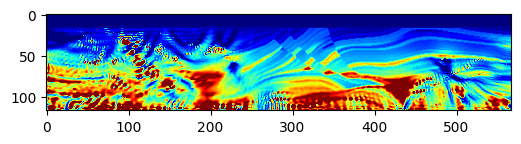

Epoch: 1561 Loss:  5502.3466796875 model_loss:  700437.44
Epoch: 1562 Loss:  5488.95361328125 model_loss:  700490.9
Epoch: 1563 Loss:  5504.349853515625 model_loss:  700947.2
Epoch: 1564 Loss:  5487.5087890625 model_loss:  701128.2
Epoch: 1565 Loss:  5491.47216796875 model_loss:  701536.2
Epoch: 1566 Loss:  5501.74365234375 model_loss:  701694.56
Epoch: 1567 Loss:  5491.146240234375 model_loss:  702163.4
Epoch: 1568 Loss:  5487.482421875 model_loss:  702362.94
Epoch: 1569 Loss:  5508.293701171875 model_loss:  702668.5
Epoch: 1570 Loss:  5489.543212890625 model_loss:  703068.2


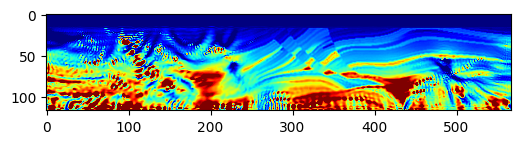

Epoch: 1571 Loss:  5496.099609375 model_loss:  703263.7
Epoch: 1572 Loss:  5513.031982421875 model_loss:  703653.25
Epoch: 1573 Loss:  5491.933837890625 model_loss:  703864.6
Epoch: 1574 Loss:  5501.903076171875 model_loss:  704317.94
Epoch: 1575 Loss:  5510.708251953125 model_loss:  704364.8
Epoch: 1576 Loss:  5499.862548828125 model_loss:  704940.44
Epoch: 1577 Loss:  5486.94580078125 model_loss:  704995.1
Epoch: 1578 Loss:  5505.0576171875 model_loss:  705458.8
Epoch: 1579 Loss:  5489.09716796875 model_loss:  705638.5
Epoch: 1580 Loss:  5491.998291015625 model_loss:  706056.7


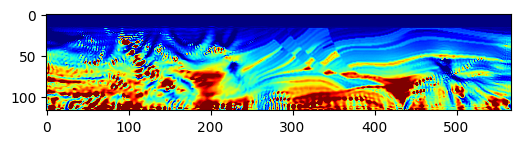

Epoch: 1581 Loss:  5505.117919921875 model_loss:  706189.7
Epoch: 1582 Loss:  5493.54150390625 model_loss:  706695.9
Epoch: 1583 Loss:  5480.57958984375 model_loss:  706836.56
Epoch: 1584 Loss:  5501.832275390625 model_loss:  707208.1
Epoch: 1585 Loss:  5484.443115234375 model_loss:  707542.2
Epoch: 1586 Loss:  5487.743896484375 model_loss:  707810.94
Epoch: 1587 Loss:  5509.95556640625 model_loss:  708112.3
Epoch: 1588 Loss:  5490.609130859375 model_loss:  708447.9
Epoch: 1589 Loss:  5491.0224609375 model_loss:  708773.7
Epoch: 1590 Loss:  5514.26708984375 model_loss:  708960.4


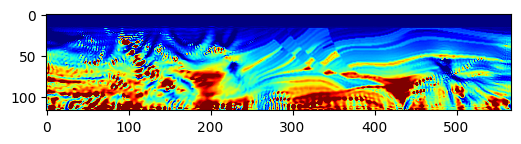

Epoch: 1591 Loss:  5494.183349609375 model_loss:  709440.8
Epoch: 1592 Loss:  5485.24462890625 model_loss:  709583.4
Epoch: 1593 Loss:  5514.27197265625 model_loss:  709984.1
Epoch: 1594 Loss:  5496.244384765625 model_loss:  710223.6
Epoch: 1595 Loss:  5492.43896484375 model_loss:  710621.75
Epoch: 1596 Loss:  5512.22265625 model_loss:  710749.06
Epoch: 1597 Loss:  5499.4560546875 model_loss:  711280.56
Epoch: 1598 Loss:  5481.936279296875 model_loss:  711379.6
Epoch: 1599 Loss:  5496.666259765625 model_loss:  711796.0
Epoch: 1600 Loss:  5488.69970703125 model_loss:  712068.94


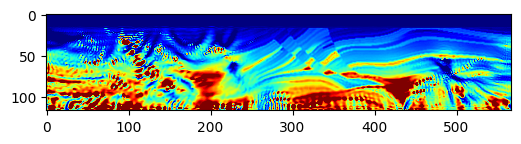

Epoch: 1601 Loss:  5482.312744140625 model_loss:  712403.0
Epoch: 1602 Loss:  5497.40869140625 model_loss:  712624.94
Epoch: 1603 Loss:  5489.361572265625 model_loss:  713074.2
Epoch: 1604 Loss:  5474.91845703125 model_loss:  713246.1
Epoch: 1605 Loss:  5495.7568359375 model_loss:  713628.8
Epoch: 1606 Loss:  5482.30322265625 model_loss:  713943.3
Epoch: 1607 Loss:  5482.3251953125 model_loss:  714241.06
Epoch: 1608 Loss:  5505.16259765625 model_loss:  714515.8
Epoch: 1609 Loss:  5487.418212890625 model_loss:  714890.1
Epoch: 1610 Loss:  5479.822021484375 model_loss:  715167.94


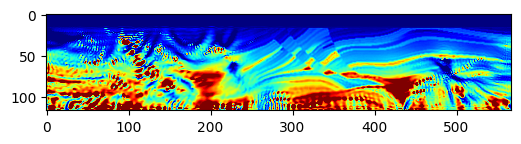

Epoch: 1611 Loss:  5505.486328125 model_loss:  715429.75
Epoch: 1612 Loss:  5487.25244140625 model_loss:  715836.44
Epoch: 1613 Loss:  5482.410888671875 model_loss:  716076.06
Epoch: 1614 Loss:  5511.2275390625 model_loss:  716375.2
Epoch: 1615 Loss:  5491.9169921875 model_loss:  716722.06
Epoch: 1616 Loss:  5482.54345703125 model_loss:  717034.75
Epoch: 1617 Loss:  5508.6201171875 model_loss:  717256.5
Epoch: 1618 Loss:  5492.98828125 model_loss:  717709.44
Epoch: 1619 Loss:  5479.2744140625 model_loss:  717901.25
Epoch: 1620 Loss:  5503.218505859375 model_loss:  718234.25


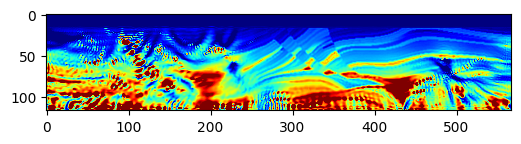

Epoch: 1621 Loss:  5491.392822265625 model_loss:  718584.6
Epoch: 1622 Loss:  5477.30322265625 model_loss:  718854.6
Epoch: 1623 Loss:  5496.183837890625 model_loss:  719143.94
Epoch: 1624 Loss:  5488.32421875 model_loss:  719526.7
Epoch: 1625 Loss:  5479.27294921875 model_loss:  719780.1
Epoch: 1626 Loss:  5496.3837890625 model_loss:  720061.4
Epoch: 1627 Loss:  5486.81103515625 model_loss:  720475.7
Epoch: 1628 Loss:  5476.02294921875 model_loss:  720664.6
Epoch: 1629 Loss:  5493.31201171875 model_loss:  721070.5
Epoch: 1630 Loss:  5482.643310546875 model_loss:  721327.75


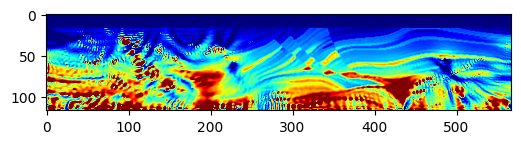

Epoch: 1631 Loss:  5485.16943359375 model_loss:  721707.06
Epoch: 1632 Loss:  5494.7646484375 model_loss:  721876.75
Epoch: 1633 Loss:  5487.59375 model_loss:  722366.4
Epoch: 1634 Loss:  5475.06298828125 model_loss:  722506.5
Epoch: 1635 Loss:  5487.633056640625 model_loss:  722934.4
Epoch: 1636 Loss:  5476.459716796875 model_loss:  723169.56
Epoch: 1637 Loss:  5481.214111328125 model_loss:  723557.0
Epoch: 1638 Loss:  5490.92236328125 model_loss:  723745.94
Epoch: 1639 Loss:  5481.829345703125 model_loss:  724191.75
Epoch: 1640 Loss:  5470.98583984375 model_loss:  724410.44


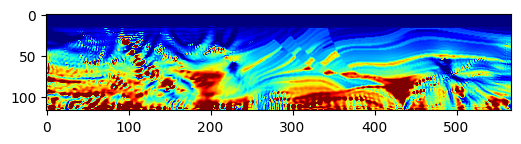

Epoch: 1641 Loss:  5487.262939453125 model_loss:  724745.0
Epoch: 1642 Loss:  5474.64501953125 model_loss:  725100.94
Epoch: 1643 Loss:  5480.08642578125 model_loss:  725380.06
Epoch: 1644 Loss:  5500.47998046875 model_loss:  725686.2
Epoch: 1645 Loss:  5481.00048828125 model_loss:  726008.44
Epoch: 1646 Loss:  5484.734375 model_loss:  726380.3
Epoch: 1647 Loss:  5503.773193359375 model_loss:  726535.1
Epoch: 1648 Loss:  5487.40185546875 model_loss:  727063.44
Epoch: 1649 Loss:  5478.49853515625 model_loss:  727182.25
Epoch: 1650 Loss:  5501.076416015625 model_loss:  727621.7


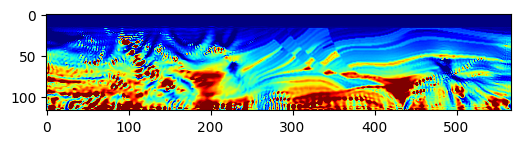

Epoch: 1651 Loss:  5485.5712890625 model_loss:  727824.2
Epoch: 1652 Loss:  5488.3330078125 model_loss:  728269.8
Epoch: 1653 Loss:  5500.898193359375 model_loss:  728351.4
Epoch: 1654 Loss:  5491.546142578125 model_loss:  728926.4
Epoch: 1655 Loss:  5475.732666015625 model_loss:  728995.2
Epoch: 1656 Loss:  5488.03515625 model_loss:  729461.7
Epoch: 1657 Loss:  5478.223876953125 model_loss:  729707.75
Epoch: 1658 Loss:  5476.569091796875 model_loss:  730063.94
Epoch: 1659 Loss:  5491.724609375 model_loss:  730300.25
Epoch: 1660 Loss:  5482.3671875 model_loss:  730725.1


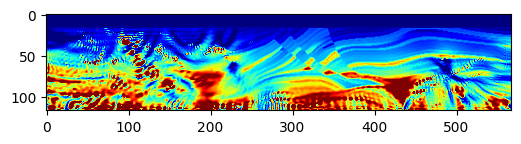

Epoch: 1661 Loss:  5471.8046875 model_loss:  730951.75
Epoch: 1662 Loss:  5493.42236328125 model_loss:  731273.25
Epoch: 1663 Loss:  5479.1279296875 model_loss:  731673.44
Epoch: 1664 Loss:  5476.681640625 model_loss:  731884.7
Epoch: 1665 Loss:  5497.808837890625 model_loss:  732284.44
Epoch: 1666 Loss:  5480.54296875 model_loss:  732512.5
Epoch: 1667 Loss:  5487.175048828125 model_loss:  732972.9
Epoch: 1668 Loss:  5496.1416015625 model_loss:  733036.25
Epoch: 1669 Loss:  5489.2216796875 model_loss:  733633.2
Epoch: 1670 Loss:  5476.80126953125 model_loss:  733687.9


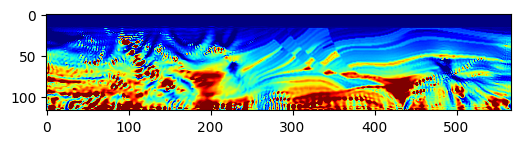

Epoch: 1671 Loss:  5489.388916015625 model_loss:  734187.4
Epoch: 1672 Loss:  5477.834228515625 model_loss:  734354.4
Epoch: 1673 Loss:  5480.9404296875 model_loss:  734808.06
Epoch: 1674 Loss:  5488.06494140625 model_loss:  734942.9
Epoch: 1675 Loss:  5481.470703125 model_loss:  735444.9
Epoch: 1676 Loss:  5467.9072265625 model_loss:  735611.6
Epoch: 1677 Loss:  5484.086181640625 model_loss:  735992.75
Epoch: 1678 Loss:  5472.151123046875 model_loss:  736342.9
Epoch: 1679 Loss:  5475.8740234375 model_loss:  736606.7
Epoch: 1680 Loss:  5491.887451171875 model_loss:  736964.5


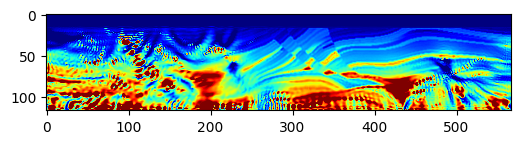

Epoch: 1681 Loss:  5475.082275390625 model_loss:  737235.1
Epoch: 1682 Loss:  5483.66943359375 model_loss:  737668.2
Epoch: 1683 Loss:  5490.998046875 model_loss:  737763.44
Epoch: 1684 Loss:  5492.021240234375 model_loss:  738352.5
Epoch: 1685 Loss:  5491.99560546875 model_loss:  738410.94
Epoch: 1686 Loss:  5508.557861328125 model_loss:  738930.1
Epoch: 1687 Loss:  5493.1787109375 model_loss:  739045.3
Epoch: 1688 Loss:  5498.95263671875 model_loss:  739553.06
Epoch: 1689 Loss:  5503.24072265625 model_loss:  739627.7
Epoch: 1690 Loss:  5497.0390625 model_loss:  740169.7


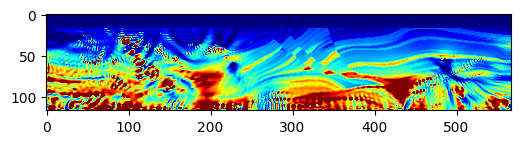

Epoch: 1691 Loss:  5482.643798828125 model_loss:  740297.6
Epoch: 1692 Loss:  5492.37255859375 model_loss:  740714.2
Epoch: 1693 Loss:  5482.4501953125 model_loss:  741020.3
Epoch: 1694 Loss:  5483.08837890625 model_loss:  741319.25
Epoch: 1695 Loss:  5493.785400390625 model_loss:  741657.6
Epoch: 1696 Loss:  5484.8994140625 model_loss:  741957.8
Epoch: 1697 Loss:  5489.2099609375 model_loss:  742339.0
Epoch: 1698 Loss:  5496.650634765625 model_loss:  742506.56
Epoch: 1699 Loss:  5490.38720703125 model_loss:  743035.56
Epoch: 1700 Loss:  5485.927490234375 model_loss:  743137.0


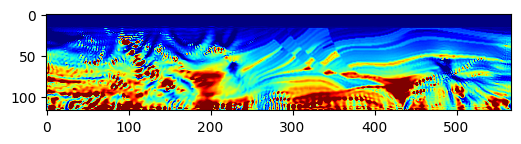

Epoch: 1701 Loss:  5500.4443359375 model_loss:  743650.3
Epoch: 1702 Loss:  5487.0341796875 model_loss:  743772.1
Epoch: 1703 Loss:  5493.857421875 model_loss:  744284.1
Epoch: 1704 Loss:  5494.701171875 model_loss:  744363.3
Epoch: 1705 Loss:  5490.537109375 model_loss:  744894.6
Epoch: 1706 Loss:  5479.3916015625 model_loss:  745043.4
Epoch: 1707 Loss:  5490.02734375 model_loss:  745444.56
Epoch: 1708 Loss:  5479.61328125 model_loss:  745750.56
Epoch: 1709 Loss:  5485.53955078125 model_loss:  746066.25
Epoch: 1710 Loss:  5493.057373046875 model_loss:  746395.75


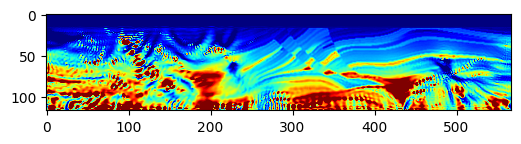

Epoch: 1711 Loss:  5481.7587890625 model_loss:  746684.2
Epoch: 1712 Loss:  5490.40869140625 model_loss:  747110.56
Epoch: 1713 Loss:  5491.810791015625 model_loss:  747242.4
Epoch: 1714 Loss:  5489.849365234375 model_loss:  747793.0
Epoch: 1715 Loss:  5486.53271484375 model_loss:  747898.0
Epoch: 1716 Loss:  5498.841796875 model_loss:  748401.44
Epoch: 1717 Loss:  5485.794189453125 model_loss:  748516.4
Epoch: 1718 Loss:  5492.3779296875 model_loss:  749045.8
Epoch: 1719 Loss:  5488.10498046875 model_loss:  749124.44
Epoch: 1720 Loss:  5485.711181640625 model_loss:  749645.9


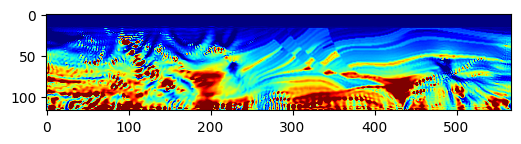

Epoch: 1721 Loss:  5479.949951171875 model_loss:  749833.25
Epoch: 1722 Loss:  5488.5234375 model_loss:  750197.25
Epoch: 1723 Loss:  5482.030029296875 model_loss:  750541.75
Epoch: 1724 Loss:  5492.03466796875 model_loss:  750824.06
Epoch: 1725 Loss:  5498.67626953125 model_loss:  751209.8
Epoch: 1726 Loss:  5486.25439453125 model_loss:  751411.94
Epoch: 1727 Loss:  5495.3759765625 model_loss:  751931.4
Epoch: 1728 Loss:  5490.56396484375 model_loss:  751983.94
Epoch: 1729 Loss:  5491.731689453125 model_loss:  752586.06
Epoch: 1730 Loss:  5486.174072265625 model_loss:  752661.06


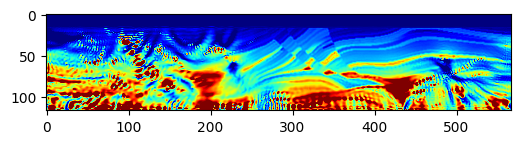

Epoch: 1731 Loss:  5495.8525390625 model_loss:  753185.4
Epoch: 1732 Loss:  5484.8212890625 model_loss:  753288.0
Epoch: 1733 Loss:  5489.77587890625 model_loss:  753810.9
Epoch: 1734 Loss:  5479.532958984375 model_loss:  753934.75
Epoch: 1735 Loss:  5480.6357421875 model_loss:  754396.1
Epoch: 1736 Loss:  5478.710693359375 model_loss:  754673.5
Epoch: 1737 Loss:  5480.259033203125 model_loss:  754965.06
Epoch: 1738 Loss:  5487.236328125 model_loss:  755367.5
Epoch: 1739 Loss:  5487.1826171875 model_loss:  755594.0
Epoch: 1740 Loss:  5496.384033203125 model_loss:  756056.9


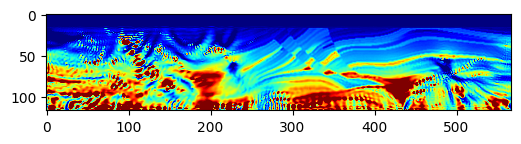

Epoch: 1741 Loss:  5488.82373046875 model_loss:  756157.94
Epoch: 1742 Loss:  5494.4140625 model_loss:  756746.9
Epoch: 1743 Loss:  5484.608642578125 model_loss:  756779.7
Epoch: 1744 Loss:  5491.27392578125 model_loss:  757350.4
Epoch: 1745 Loss:  5481.89306640625 model_loss:  757456.06
Epoch: 1746 Loss:  5487.54833984375 model_loss:  757961.4
Epoch: 1747 Loss:  5485.042724609375 model_loss:  758087.2
Epoch: 1748 Loss:  5485.30126953125 model_loss:  758577.8
Epoch: 1749 Loss:  5476.650146484375 model_loss:  758785.6
Epoch: 1750 Loss:  5488.108154296875 model_loss:  759129.3


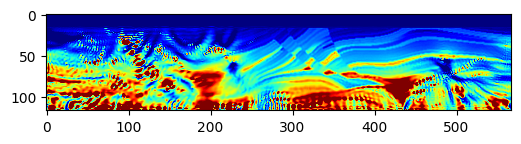

Epoch: 1751 Loss:  5482.60791015625 model_loss:  759528.9
Epoch: 1752 Loss:  5490.641357421875 model_loss:  759737.56
Epoch: 1753 Loss:  5504.64111328125 model_loss:  760178.56
Epoch: 1754 Loss:  5487.92431640625 model_loss:  760335.8
Epoch: 1755 Loss:  5498.41259765625 model_loss:  760887.7
Epoch: 1756 Loss:  5493.1826171875 model_loss:  760889.25
Epoch: 1757 Loss:  5492.50439453125 model_loss:  761536.8
Epoch: 1758 Loss:  5483.0029296875 model_loss:  761574.9
Epoch: 1759 Loss:  5494.123291015625 model_loss:  762098.6
Epoch: 1760 Loss:  5480.458740234375 model_loss:  762234.8


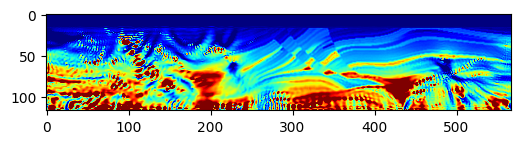

Epoch: 1761 Loss:  5487.1611328125 model_loss:  762727.44
Epoch: 1762 Loss:  5479.12939453125 model_loss:  762883.9
Epoch: 1763 Loss:  5477.45263671875 model_loss:  763328.06
Epoch: 1764 Loss:  5480.022216796875 model_loss:  763632.3
Epoch: 1765 Loss:  5480.5029296875 model_loss:  763880.44
Epoch: 1766 Loss:  5487.4541015625 model_loss:  764331.44
Epoch: 1767 Loss:  5489.672607421875 model_loss:  764519.1
Epoch: 1768 Loss:  5496.3896484375 model_loss:  764996.6
Epoch: 1769 Loss:  5488.550537109375 model_loss:  765082.56
Epoch: 1770 Loss:  5493.197998046875 model_loss:  765684.56


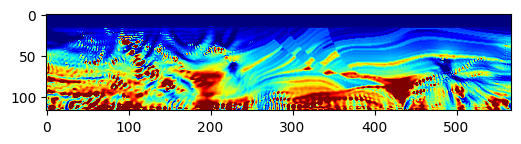

Epoch: 1771 Loss:  5481.882568359375 model_loss:  765702.56
Epoch: 1772 Loss:  5487.147705078125 model_loss:  766276.8
Epoch: 1773 Loss:  5479.359375 model_loss:  766408.7
Epoch: 1774 Loss:  5482.65576171875 model_loss:  766872.75
Epoch: 1775 Loss:  5486.678466796875 model_loss:  767047.6
Epoch: 1776 Loss:  5485.29833984375 model_loss:  767513.94
Epoch: 1777 Loss:  5476.07763671875 model_loss:  767749.44
Epoch: 1778 Loss:  5491.703125 model_loss:  768065.25
Epoch: 1779 Loss:  5482.1484375 model_loss:  768502.94
Epoch: 1780 Loss:  5488.551025390625 model_loss:  768679.7


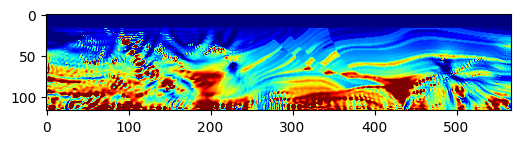

Epoch: 1781 Loss:  5504.866943359375 model_loss:  769132.06
Epoch: 1782 Loss:  5485.42529296875 model_loss:  769300.25
Epoch: 1783 Loss:  5496.968505859375 model_loss:  769845.0
Epoch: 1784 Loss:  5494.365478515625 model_loss:  769847.7
Epoch: 1785 Loss:  5490.86328125 model_loss:  770497.56
Epoch: 1786 Loss:  5480.3642578125 model_loss:  770541.7
Epoch: 1787 Loss:  5493.738037109375 model_loss:  771047.0
Epoch: 1788 Loss:  5477.50048828125 model_loss:  771224.3
Epoch: 1789 Loss:  5485.984619140625 model_loss:  771694.56
Epoch: 1790 Loss:  5481.979736328125 model_loss:  771862.8


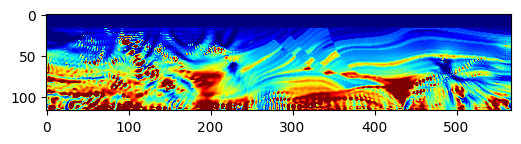

Epoch: 1791 Loss:  5475.6494140625 model_loss:  772321.56
Epoch: 1792 Loss:  5481.416748046875 model_loss:  772613.1
Epoch: 1793 Loss:  5484.2314453125 model_loss:  772866.56
Epoch: 1794 Loss:  5483.396484375 model_loss:  773325.8
Epoch: 1795 Loss:  5493.868408203125 model_loss:  773520.75
Epoch: 1796 Loss:  5496.2431640625 model_loss:  773977.1
Epoch: 1797 Loss:  5486.409912109375 model_loss:  774095.2
Epoch: 1798 Loss:  5492.50390625 model_loss:  774684.7
Epoch: 1799 Loss:  5483.399169921875 model_loss:  774701.7
Epoch: 1800 Loss:  5483.410888671875 model_loss:  775290.56


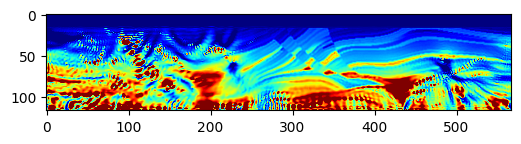

Epoch: 1801 Loss:  5481.060546875 model_loss:  775426.2
Epoch: 1802 Loss:  5482.987060546875 model_loss:  775874.7
Epoch: 1803 Loss:  5484.175048828125 model_loss:  776078.75
Epoch: 1804 Loss:  5488.32861328125 model_loss:  776540.75
Epoch: 1805 Loss:  5472.16845703125 model_loss:  776761.25
Epoch: 1806 Loss:  5485.355712890625 model_loss:  777119.75
Epoch: 1807 Loss:  5479.006591796875 model_loss:  777531.94
Epoch: 1808 Loss:  5476.162353515625 model_loss:  777729.5
Epoch: 1809 Loss:  5494.519775390625 model_loss:  778173.4
Epoch: 1810 Loss:  5478.74560546875 model_loss:  778395.2


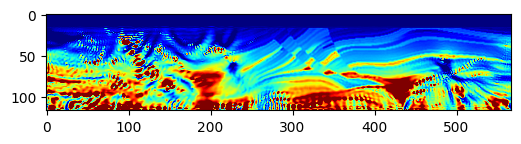

Epoch: 1811 Loss:  5489.044189453125 model_loss:  778891.56
Epoch: 1812 Loss:  5491.0751953125 model_loss:  778955.75
Epoch: 1813 Loss:  5485.290771484375 model_loss:  779580.7
Epoch: 1814 Loss:  5475.468994140625 model_loss:  779652.75
Epoch: 1815 Loss:  5490.766357421875 model_loss:  780152.2
Epoch: 1816 Loss:  5474.32275390625 model_loss:  780362.8
Epoch: 1817 Loss:  5483.814453125 model_loss:  780829.5
Epoch: 1818 Loss:  5484.82275390625 model_loss:  781001.06
Epoch: 1819 Loss:  5474.7685546875 model_loss:  781487.25
Epoch: 1820 Loss:  5481.317138671875 model_loss:  781770.25


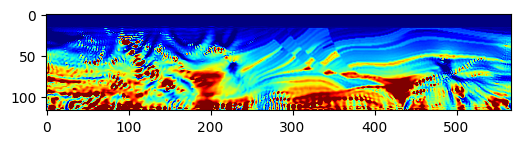

Epoch: 1821 Loss:  5489.867919921875 model_loss:  782047.6
Epoch: 1822 Loss:  5480.382080078125 model_loss:  782513.3
Epoch: 1823 Loss:  5495.694580078125 model_loss:  782730.8
Epoch: 1824 Loss:  5500.0419921875 model_loss:  783174.44
Epoch: 1825 Loss:  5482.33984375 model_loss:  783343.56
Epoch: 1826 Loss:  5492.3359375 model_loss:  783922.3
Epoch: 1827 Loss:  5489.6025390625 model_loss:  783949.6
Epoch: 1828 Loss:  5482.5615234375 model_loss:  784577.4
Epoch: 1829 Loss:  5479.4921875 model_loss:  784689.8
Epoch: 1830 Loss:  5490.83984375 model_loss:  785172.94


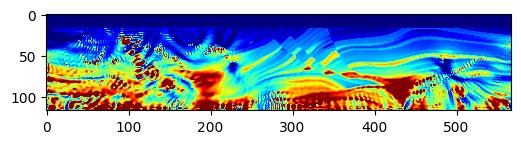

Epoch: 1831 Loss:  5474.87646484375 model_loss:  785397.0
Epoch: 1832 Loss:  5486.454345703125 model_loss:  785861.6
Epoch: 1833 Loss:  5476.6318359375 model_loss:  786075.9
Epoch: 1834 Loss:  5471.403076171875 model_loss:  786517.94
Epoch: 1835 Loss:  5477.795654296875 model_loss:  786871.5
Epoch: 1836 Loss:  5473.943359375 model_loss:  787110.56
Epoch: 1837 Loss:  5479.177978515625 model_loss:  787593.0
Epoch: 1838 Loss:  5483.39111328125 model_loss:  787809.75
Epoch: 1839 Loss:  5484.7080078125 model_loss:  788290.8
Epoch: 1840 Loss:  5483.345703125 model_loss:  788424.1


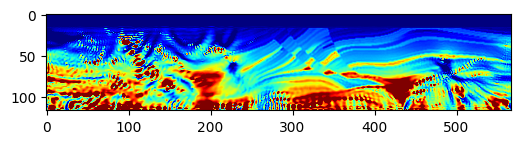

Epoch: 1841 Loss:  5484.2158203125 model_loss:  789020.2
Epoch: 1842 Loss:  5470.253662109375 model_loss:  789096.75
Epoch: 1843 Loss:  5479.46044921875 model_loss:  789646.6
Epoch: 1844 Loss:  5473.09326171875 model_loss:  789857.56
Epoch: 1845 Loss:  5474.1318359375 model_loss:  790296.2
Epoch: 1846 Loss:  5490.164306640625 model_loss:  790514.8
Epoch: 1847 Loss:  5479.873291015625 model_loss:  791005.44
Epoch: 1848 Loss:  5471.87744140625 model_loss:  791261.7
Epoch: 1849 Loss:  5494.45947265625 model_loss:  791587.7
Epoch: 1850 Loss:  5477.15380859375 model_loss:  792050.9


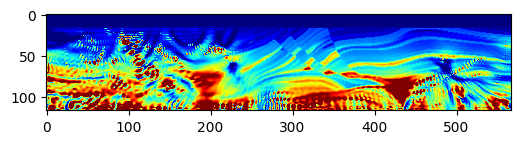

Epoch: 1851 Loss:  5481.3544921875 model_loss:  792259.1
Epoch: 1852 Loss:  5501.95361328125 model_loss:  792688.44
Epoch: 1853 Loss:  5478.66259765625 model_loss:  792940.4
Epoch: 1854 Loss:  5489.87841796875 model_loss:  793454.5
Epoch: 1855 Loss:  5497.69384765625 model_loss:  793509.3
Epoch: 1856 Loss:  5486.76904296875 model_loss:  794164.44
Epoch: 1857 Loss:  5474.567138671875 model_loss:  794223.2
Epoch: 1858 Loss:  5497.10546875 model_loss:  794746.56
Epoch: 1859 Loss:  5476.858642578125 model_loss:  794962.44
Epoch: 1860 Loss:  5484.02001953125 model_loss:  795436.2


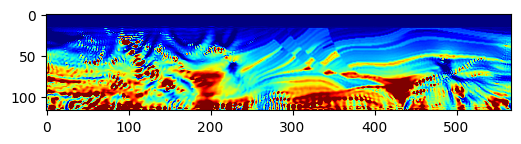

Epoch: 1861 Loss:  5500.225341796875 model_loss:  795593.94
Epoch: 1862 Loss:  5482.760986328125 model_loss:  796150.9
Epoch: 1863 Loss:  5472.6171875 model_loss:  796328.1
Epoch: 1864 Loss:  5501.209716796875 model_loss:  796717.75
Epoch: 1865 Loss:  5477.552734375 model_loss:  797115.2
Epoch: 1866 Loss:  5480.1708984375 model_loss:  797394.44
Epoch: 1867 Loss:  5510.15625 model_loss:  797760.44
Epoch: 1868 Loss:  5486.681640625 model_loss:  798102.7
Epoch: 1869 Loss:  5485.087158203125 model_loss:  798497.3
Epoch: 1870 Loss:  5509.81884765625 model_loss:  798669.75


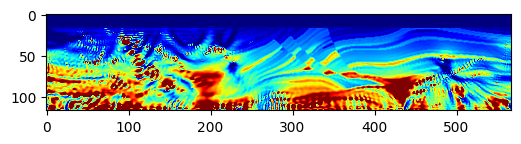

Epoch: 1871 Loss:  5490.734130859375 model_loss:  799228.94
Epoch: 1872 Loss:  5473.80615234375 model_loss:  799353.25
Epoch: 1873 Loss:  5500.773193359375 model_loss:  799833.7
Epoch: 1874 Loss:  5488.99951171875 model_loss:  800094.4
Epoch: 1875 Loss:  5478.08984375 model_loss:  800517.7
Epoch: 1876 Loss:  5496.2880859375 model_loss:  800695.8
Epoch: 1877 Loss:  5486.572998046875 model_loss:  801257.25
Epoch: 1878 Loss:  5467.9111328125 model_loss:  801370.1
Epoch: 1879 Loss:  5483.26806640625 model_loss:  801852.06
Epoch: 1880 Loss:  5473.993408203125 model_loss:  802142.9


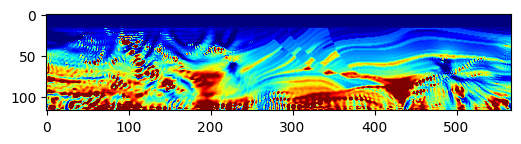

Epoch: 1881 Loss:  5469.798583984375 model_loss:  802516.3
Epoch: 1882 Loss:  5487.15771484375 model_loss:  802771.1
Epoch: 1883 Loss:  5476.65087890625 model_loss:  803259.3
Epoch: 1884 Loss:  5462.917236328125 model_loss:  803450.06
Epoch: 1885 Loss:  5486.066162109375 model_loss:  803874.25
Epoch: 1886 Loss:  5469.01806640625 model_loss:  804190.6
Epoch: 1887 Loss:  5473.924560546875 model_loss:  804563.9
Epoch: 1888 Loss:  5496.2685546875 model_loss:  804814.2
Epoch: 1889 Loss:  5475.761474609375 model_loss:  805266.94
Epoch: 1890 Loss:  5468.855712890625 model_loss:  805547.5


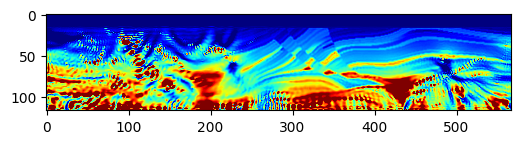

Epoch: 1891 Loss:  5497.055419921875 model_loss:  805852.1
Epoch: 1892 Loss:  5475.099609375 model_loss:  806275.2
Epoch: 1893 Loss:  5472.237548828125 model_loss:  806557.1
Epoch: 1894 Loss:  5503.804443359375 model_loss:  806875.5
Epoch: 1895 Loss:  5481.787109375 model_loss:  807264.0
Epoch: 1896 Loss:  5473.87353515625 model_loss:  807599.44
Epoch: 1897 Loss:  5501.483154296875 model_loss:  807831.0
Epoch: 1898 Loss:  5484.140625 model_loss:  808334.75
Epoch: 1899 Loss:  5467.188720703125 model_loss:  808505.56
Epoch: 1900 Loss:  5490.4951171875 model_loss:  808931.7


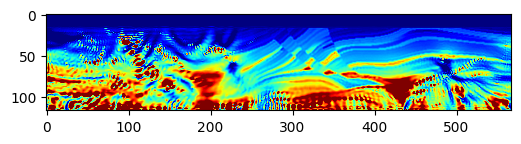

Epoch: 1901 Loss:  5480.793701171875 model_loss:  809244.5
Epoch: 1902 Loss:  5468.732421875 model_loss:  809605.6
Epoch: 1903 Loss:  5486.666748046875 model_loss:  809837.7
Epoch: 1904 Loss:  5477.620849609375 model_loss:  810346.4
Epoch: 1905 Loss:  5461.020263671875 model_loss:  810492.9
Epoch: 1906 Loss:  5479.888671875 model_loss:  810955.5
Epoch: 1907 Loss:  5469.583740234375 model_loss:  811250.3
Epoch: 1908 Loss:  5464.95361328125 model_loss:  811611.56
Epoch: 1909 Loss:  5485.484619140625 model_loss:  811882.0
Epoch: 1910 Loss:  5471.71630859375 model_loss:  812335.7


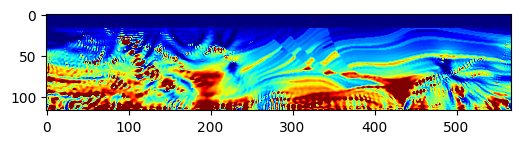

Epoch: 1911 Loss:  5460.531494140625 model_loss:  812567.94
Epoch: 1912 Loss:  5485.855224609375 model_loss:  812934.7
Epoch: 1913 Loss:  5468.6640625 model_loss:  813295.9
Epoch: 1914 Loss:  5467.404541015625 model_loss:  813620.6
Epoch: 1915 Loss:  5494.253662109375 model_loss:  813908.94
Epoch: 1916 Loss:  5474.04931640625 model_loss:  814316.25
Epoch: 1917 Loss:  5466.631591796875 model_loss:  814632.94
Epoch: 1918 Loss:  5493.576416015625 model_loss:  814884.5
Epoch: 1919 Loss:  5475.6689453125 model_loss:  815355.56
Epoch: 1920 Loss:  5463.54931640625 model_loss:  815566.25


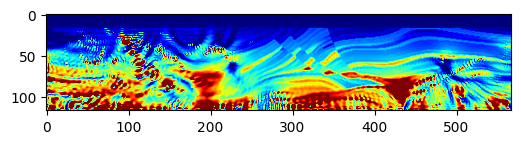

Epoch: 1921 Loss:  5490.517822265625 model_loss:  815949.44
Epoch: 1922 Loss:  5476.105224609375 model_loss:  816283.3
Epoch: 1923 Loss:  5466.059326171875 model_loss:  816637.6
Epoch: 1924 Loss:  5487.904296875 model_loss:  816861.25
Epoch: 1925 Loss:  5475.510498046875 model_loss:  817363.6
Epoch: 1926 Loss:  5459.607177734375 model_loss:  817527.56
Epoch: 1927 Loss:  5480.83447265625 model_loss:  817957.5
Epoch: 1928 Loss:  5470.2998046875 model_loss:  818272.5
Epoch: 1929 Loss:  5460.740966796875 model_loss:  818609.7
Epoch: 1930 Loss:  5481.733642578125 model_loss:  818892.6


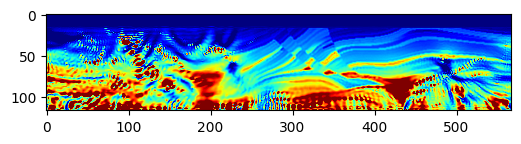

Epoch: 1931 Loss:  5470.044921875 model_loss:  819327.1
Epoch: 1932 Loss:  5458.7763671875 model_loss:  819573.7
Epoch: 1933 Loss:  5482.63720703125 model_loss:  819914.4
Epoch: 1934 Loss:  5468.265625 model_loss:  820309.44
Epoch: 1935 Loss:  5459.767578125 model_loss:  820573.0
Epoch: 1936 Loss:  5484.109619140625 model_loss:  820940.94
Epoch: 1937 Loss:  5469.041015625 model_loss:  821268.9
Epoch: 1938 Loss:  5465.974609375 model_loss:  821654.0
Epoch: 1939 Loss:  5484.822509765625 model_loss:  821835.44
Epoch: 1940 Loss:  5471.578369140625 model_loss:  822372.5


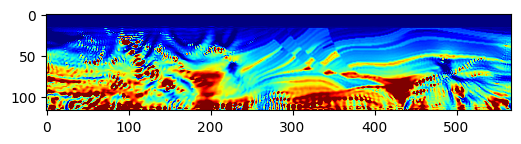

Epoch: 1941 Loss:  5458.757080078125 model_loss:  822515.7
Epoch: 1942 Loss:  5480.378173828125 model_loss:  822973.1
Epoch: 1943 Loss:  5467.9677734375 model_loss:  823236.2
Epoch: 1944 Loss:  5465.61474609375 model_loss:  823652.25
Epoch: 1945 Loss:  5482.97998046875 model_loss:  823836.0
Epoch: 1946 Loss:  5471.10107421875 model_loss:  824363.06
Epoch: 1947 Loss:  5455.860107421875 model_loss:  824526.9
Epoch: 1948 Loss:  5475.3310546875 model_loss:  824949.75
Epoch: 1949 Loss:  5463.723388671875 model_loss:  825280.8
Epoch: 1950 Loss:  5459.620361328125 model_loss:  825607.94


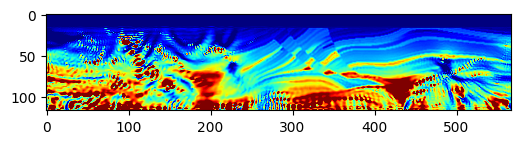

Epoch: 1951 Loss:  5482.32861328125 model_loss:  825915.75
Epoch: 1952 Loss:  5467.841552734375 model_loss:  826314.25
Epoch: 1953 Loss:  5459.50048828125 model_loss:  826621.3
Epoch: 1954 Loss:  5482.01416015625 model_loss:  826889.1
Epoch: 1955 Loss:  5467.145751953125 model_loss:  827362.9
Epoch: 1956 Loss:  5457.81103515625 model_loss:  827556.3
Epoch: 1957 Loss:  5481.7666015625 model_loss:  827997.0
Epoch: 1958 Loss:  5467.6962890625 model_loss:  828257.0
Epoch: 1959 Loss:  5466.28076171875 model_loss:  828705.1
Epoch: 1960 Loss:  5481.90478515625 model_loss:  828834.06


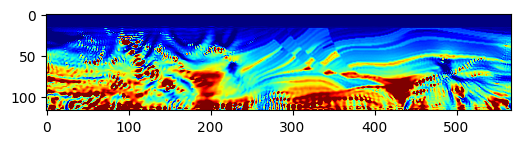

Epoch: 1961 Loss:  5471.095703125 model_loss:  829423.4
Epoch: 1962 Loss:  5456.164306640625 model_loss:  829525.9
Epoch: 1963 Loss:  5472.225341796875 model_loss:  830022.1
Epoch: 1964 Loss:  5462.406005859375 model_loss:  830276.44
Epoch: 1965 Loss:  5459.247802734375 model_loss:  830684.2
Epoch: 1966 Loss:  5475.708251953125 model_loss:  830912.75
Epoch: 1967 Loss:  5465.19482421875 model_loss:  831398.25
Epoch: 1968 Loss:  5453.500244140625 model_loss:  831619.44
Epoch: 1969 Loss:  5474.4013671875 model_loss:  831979.25
Epoch: 1970 Loss:  5461.4736328125 model_loss:  832382.06


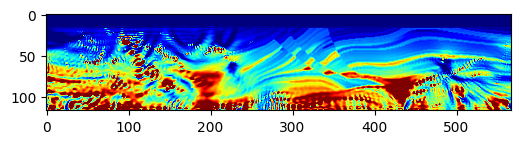

Epoch: 1971 Loss:  5457.15576171875 model_loss:  832626.75
Epoch: 1972 Loss:  5478.200439453125 model_loss:  833043.25
Epoch: 1973 Loss:  5462.847900390625 model_loss:  833307.5
Epoch: 1974 Loss:  5466.65771484375 model_loss:  833777.0
Epoch: 1975 Loss:  5475.915283203125 model_loss:  833861.7
Epoch: 1976 Loss:  5468.6220703125 model_loss:  834489.9
Epoch: 1977 Loss:  5456.977783203125 model_loss:  834545.94
Epoch: 1978 Loss:  5471.2001953125 model_loss:  835094.4
Epoch: 1979 Loss:  5459.697509765625 model_loss:  835262.3
Epoch: 1980 Loss:  5462.1591796875 model_loss:  835749.1


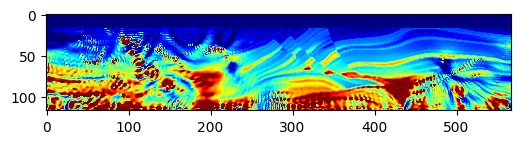

Epoch: 1981 Loss:  5471.324951171875 model_loss:  835887.44
Epoch: 1982 Loss:  5463.4921875 model_loss:  836428.6
Epoch: 1983 Loss:  5450.47509765625 model_loss:  836596.7
Epoch: 1984 Loss:  5467.093017578125 model_loss:  836992.44
Epoch: 1985 Loss:  5455.81005859375 model_loss:  837363.56
Epoch: 1986 Loss:  5457.3662109375 model_loss:  837624.25
Epoch: 1987 Loss:  5474.55078125 model_loss:  838034.75
Epoch: 1988 Loss:  5458.29736328125 model_loss:  838282.2
Epoch: 1989 Loss:  5466.87548828125 model_loss:  838772.25
Epoch: 1990 Loss:  5470.287353515625 model_loss:  838830.7


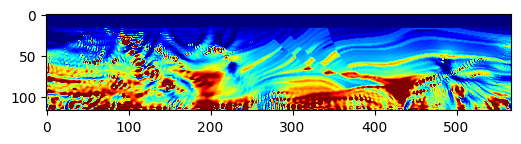

Epoch: 1991 Loss:  5466.8232421875 model_loss:  839479.44
Epoch: 1992 Loss:  5457.349365234375 model_loss:  839511.9
Epoch: 1993 Loss:  5470.2080078125 model_loss:  840093.4
Epoch: 1994 Loss:  5456.91357421875 model_loss:  840201.44
Epoch: 1995 Loss:  5462.267578125 model_loss:  840740.2
Epoch: 1996 Loss:  5465.369384765625 model_loss:  840841.8
Epoch: 1997 Loss:  5460.1083984375 model_loss:  841395.75
Epoch: 1998 Loss:  5450.521484375 model_loss:  841575.8
Epoch: 1999 Loss:  5464.728515625 model_loss:  841952.25
Epoch: 2000 Loss:  5454.80712890625 model_loss:  842350.06


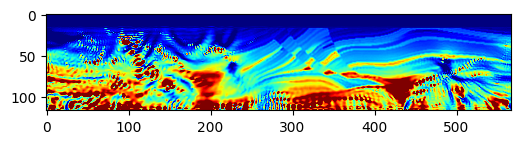

Runtime: 21.44201935927073


In [9]:
# Iterative inversion loop
t_start = time.time()
num_batches = 2 # split data into 2 batches for speed and reduced memory use
num_epochs = 2001 # Pass through the entire dataset 20001 times
model_loss = []
data_loss = []
for epoch in range(num_epochs):
    epoch_loss = 0.0
    
    for it in range(num_batches):
        optimizer.zero_grad()
        batch_src_amps = source_amplitudes[it::num_batches]
        batch_rcv_amps_true = receiver_amplitudes_true[it::num_batches].to(device)        
        batch_x_s = source_locations[it::num_batches].to(device)
        batch_x_r = receiver_locations[it::num_batches].to(device)
          
        out = scalar(
          model.T, dx, dt,
          source_amplitudes=batch_src_amps,
          source_locations=batch_x_s,
          receiver_locations=batch_x_r,
          pml_freq=freq,)
        
        batch_rcv_amps_pred = out[-1].permute(0, 2, 1)        
        u_obs = batch_rcv_amps_true
        u_pred = batch_rcv_amps_pred
        
        loss = criterion_data.forward(u_obs, u_pred)
        epoch_loss += loss.item()
        loss.backward()
        model.grad *= mask     
          
        optimizer.step()
    # scheduler.step()
    v_loss = criterion(model.cpu(),model_true.cpu()).detach().numpy()
    model_loss.append(v_loss.item())
    data_loss.append(epoch_loss)
    print('Epoch:', epoch, 'Loss: ', epoch_loss,'model_loss: ', v_loss)
    if epoch !=0 and epoch % 10 == 0:
        plt.figure(figsize=(6, 4))
        plt.imshow(model.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
                   cmap='jet')
        plt.show()

t_end = time.time()
print('Runtime:', (t_end - t_start)/60)